<a href="https://colab.research.google.com/github/JoDeMiro/Micado-Research/blob/main/ML_Auto_10_test.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# ML Auto 10.ipynb másolata

Ebben a részben azt fogom kipróbálni, hogy előre nézés helyett teljesen föl és teljesen lefelénéz a két szenzor. Gyakorlatilag ugyan azt kell mérnie mint ami a célváltozó. Megvizsgálom azt, hogy igy milyen előrejelzéseket ad.
Igen lehet, hogy a center szenzort ki kell venni.

## A kocsinál a távolság számítás lett átírva



```
# itt régen a k += 1 volt
```



# ToDo
letölteni a pythont és ott futtatni a kódot

huzzon egy nyomot a becslésre is, hogy lássam, hogy hova a faszomba becsüli az első modell
a mit is? ja igen a középtől való eltérést.

csinálni egy második modelt illetve kettőt

az egyik legyen a régi, de hagyjuk a faszba a fel-le becslést, az egész before aftert
és csak egyszerűen kössünk rá a becslésre valamilyen szabályt. Ha nagyobb mint x akkor +3

a másik verzió amit gyorsan ki kéne próbálni, hogy a linreg helyett beteszek egy mlp-t

**ToDo:**

Megnézni, hogy normalizálom-e az adatokat a neruális háló előtt, mert lehet hogy ez viszi félre a becslést.

**Gondolat:**

Nyilvánvaló, hogy egy idő után se a before after adatokra nem képes jó becslést adni
```
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[2.13709439]]
-------- 1 y up ->  center =  [[1.94404015]]
-------- 1 y up ->  right  =  [[1.85292015]]
```
Ezért arra gondoltam, hogy beeresztem azokat az adatokat is, amelyeket az action körben lép meg.
Ha úgy se megy akkor át kell gondolni a képletet! A becslés képleétt, before after.

A másik, hogy csinálni kéne egy ábrát arra nézve, hogy mi a kapcsolat a tényleges before after között és nem csinálni rá semmilyen becslét.
Egyszerűen minden metrikára megnézni, hogy mi a lépés elötti adata és mi a lépés utáni adata. Ezt meg lehet csinálni úgy, hogy egy ploton vízszintesen van before, fűggőlegesen az after, és színnel van kódolva az action (kék +1, piros -1)

Amúgy most jutott eszembe, hogy egyébként a 0 actionre nem is becsülünk lehet, hogy ez is hiba.

Vagy úgy is lehet ábrázolni, hogy egy ploton van a +1 és külön egy másik ploton a -1. A lényeg, hogy nem becslés, hanem a before after közötti kapcsolat szenzoronként.

A fenti viszgálatot azért végzem el, hogy lássam, hol kap olyan adatokat ** milyen helyzetben kap olyan adatokat ** a before after adatsor amitől ilyen mértékben elromlik az előre jelző képessége.

2. Teljesen nyilvánvaló, hogy a szenzoros adatok és a tengelytől mért távolság közötti kapcsolatot a lineáris regresszió képtelen megragadni.

3. Utána ki kell próbálni, hogy a szenzorok nem előre néznek, hanem oldalra. Igen ez teljes egészében az amit a célváltozó is mér. De csak ellenőrzés végett.



# Micado Auto Scale Research

Ebben a felskálázási adatok elemzésével foglalkozom.

Ez az interkatív bemutató arra van, hogy a válotzók közötti összefüggéseket jobban átlásssam, elemezzem, az esetleges anomáliákat rögtön kiszúrjam.

A playground részben a rendszer alapját adó neuráli háló beállításaival lehet játszani és megfigyelni, hogy milyen hatással van a rendszer teljesítményére.

<a name="tartalom"></a>

## Tartalom

Bevezetés

> [Empty](#empty)<br>
> [Play Ground](#play_ground)<br>
> [SandBox](#sandbox)<br>
> [Before After](#beforeafter)<br>
> [Szintetikus adatok generálása](#szintetikus_adatok)<br>
> [Irodalom](#irodalom)<br>
> [ToDo](#todo)<br>


## Bevezető gondolat

Összességében az egésszel kapcsolatban van egy hatalmas kérdőjel.

Tulajdonképpen két paradigma van.

Az egyik - nem az enyém - így néz ki:

Egyszerűen becsüjük meg azt, hogy az adott szenzoros adatok alapján mi legyen a döntés kimenetele (fel, le, semmi). Akkor hoztunk jó döntést, ha valamilyen metrika alapján valamilyen költséget minimalizáltunk, vagy maximalizáltunk. Például, ha egy döntéssel sikerült közelebb kerülni a záróvonalhoz, vagyis az út közepére. Vagy az az autó a lehető legmeszebb jutott el anélkül, hogy érintette volna a falat és lehetőleg a leggyorsabban is.

A másik - amin én dolgozom - viszont egy plusz lépéssel egészül ki és ettől sokkal bonyolultabb. Hogy van-e létjogosultsága az ennek a kisérletnek a lényege.

Vannak szenzoros adataink, ami alapján hozunk egy döntést. Eddig olyan mint a máisik, de az érdemi különbség a módszerben és a tanulás folyamatában van.

A szenzoros adatokból megbecsüljük azt, hogy mennyire vagyunk jók és nem azt becsüljük, hogy mit kéne tenni!

Ha nem vagyunk jók akkor egy második modell segítségével csinálunk valamilyen lépést, amitől azt várjuk, hogy jók leszünk.

És itt jogosan merül fel a kérdés, hogy de miért nem az első módszert alkalmazzuk és erre most még én sem tudom a választ pontosan megadni. De röviden erről szól ez a kutatás.

## Paradmigva váltás

Miért olyan nehéz debuggolni ezt a rendszert?

Azért mert ha belegondolsz felügyelt tanulásnál mutatsz egy mintát, a rendszer kiszámolja a hibát és a hiba szerint módosítja a tanulásnál a súlyokat.

Itt viszont mutatsz egy mintát a rendszer kiszámoja a hibát a hiba szerint módosítja a súlyokat, a súlyok alapján hoz egy döntést, AMIT VISSZACSATOLÓDIK A RENDSZERBE olyan formán, hogy ezzel a lépéésel megváltoznak a bemeneti adatok, ami alapján újra tanítjuk a rendszert, és így tovább ahogy haladunk előre az időben, a tanulás során.

>> Attól lesz reinforcement learning, hogy a döntést visszatápláljuk a rendszerbe, ezáltal megváltoznak a bemeneti adatok. Ez a legnagyobb különbség a super-vised és a re-enforcement learning között.

In [1]:
import numpy as np
import matplotlib.pyplot as plt

from sklearn.linear_model import LinearRegression

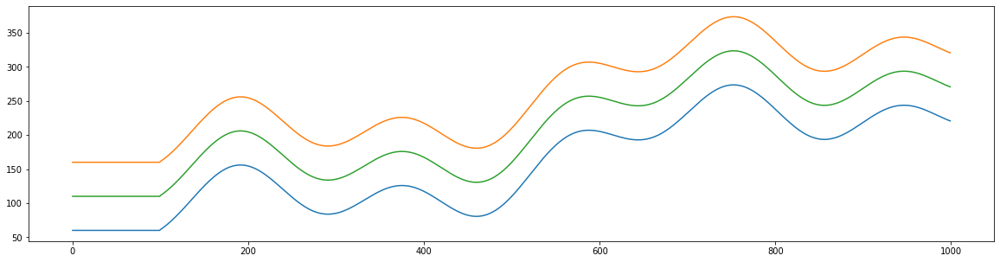

In [2]:
distance    = np.arange(0, 1000, 1)
road        = 100
wall_left   = 30*(np.sin(distance/180)) + distance * 0.3 + 30 * np.cos(distance/30) + 50 * np.sin(distance/90)
wall_left[0:100] = 60
wall_right  = wall_left + road
wall_center = ( wall_left + wall_right ) / 2


plt.figure(figsize=(20,5)); plt.plot(wall_left); plt.plot(wall_right); plt.plot(wall_center); plt.show()

In [3]:
class Road():
  def __init__(self, wide):
    self.distance    = np.arange(0, 1000, 1)
    self.wide        = wide
    self.wall_right  = 30*(np.sin(self.distance/180)) + self.distance * 0.3 + 30 * np.cos(self.distance/30) + 50 * np.sin(self.distance/90)
    self.wall_right[0:100] = 60
    self.wall_left   = self.wall_right + self.wide
    self.wall_center = ( self.wall_left + self.wall_right ) / 2

  def show(self):
    fig, ax = plt.subplots(figsize=(26,10)); ax.set_ylim(40, 400); ax.plot(self.wall_left); ax.plot(self.wall_right); ax.plot(self.wall_center);
    return fig, ax


In [4]:
class Car():
  def __init__(self, road):
    self.road = road
    self.x = 0
    self.y = self.road.wall_center[0]
    self.sight = 154           # ennyit lát előre 300, 54
    self.sight_center = 150

    self.y_history  = []
    self.x_history  = []
    self.y_center   = []; self.y_center = self.road.wall_center
    self.y_distance = []
    self.y_distance_real = []
    self.y_distance_predicted = []
    self.regression = LinearRegression(fit_intercept=False)
    self.regression_right = LinearRegression()
    self.regression_center = LinearRegression()
    self.regression_left = LinearRegression()
# most
    self.sensor_center = []
    self.sensor_left   = []
    self.sensor_right  = []
    self.before  = []
    self.after   = []

    self.mesterseges_coutner = 0


  def calculate_distances(self):
    # ha bármikor kevesebb a faltól mért távolsága bármelyik szenzoron akkor a szenzorokon mért távolság is ennyi lesz
    
    k = self.x; d = 0
    while(k < self.x + self.sight_center):
      k += 1; d += 1
      self.distance_center_from_wall = d
      if(int(self.road.wall_left[k]) < self.y):
        print('Sensor center = ', self.distance_center_from_wall)
        break
      if(int(self.road.wall_right[k]) > self.y):
        print('Sensor center = ', self.distance_center_from_wall)
        break

    k = self.x; d = 0
    while(k < self.x + self.sight):
# itt régen a k += 1 volt
      k += 0;  d += 1
      self.distance_left_from_wall = d
      if(int(self.road.wall_left[k]) < self.y + d):
        print('Sensor from left wall = ', self.distance_left_from_wall)
        break

    k = self.x; d = 0
    while(k < self.x + self.sight):
# itt régen a k += 1 volt
      k += 0; d += 1
      self.distance_right_from_wall = d
      if(int(self.road.wall_right[k]) > self.y - d):
        print('Sensor from right wall = ', self.distance_right_from_wall)
        break

    #ki kell kalkulálni a tényleges távolságot a ball és a jobb faltól
    # mert ezekre fogom tanítani a neurális hálót, ahol ezeket becsüljük
    # és a bemeneti változó a 3 szenzorból érkező adat lesz.
    # valójában azt mérjük, hogy milyen távolságra van az út közepétől

    self.distance_from_top     = abs(self.road.wall_left[self.x] - self.y)
    self.distance_from_bottom  = abs(self.road.wall_right[self.x] - self.y)
    print('most távolsagra van a felső faltól = ', self.distance_from_top)
    print('most távolsagra van az alsó faltól = ', self.distance_from_bottom)


    print('cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc')
    print('self.x                       = ', self.x)
    print('cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc')

    # mi lenne, ha mégis inkább a kettő hányadosát becsülném (1 ha egyenlő távolságra van)
    # self.vertical_distance_from_middle = self.road.wall_center[self.x] - self.y
    # self.vertical_distance_from_middle = self.distance_from_top / self.distance_from_bottom

    self.vertical_distance_from_middle = self.y - self.road.wall_center[self.x]

    print('KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK')
    print('self.vertical_distance_from_middle = ', self.vertical_distance_from_middle)
    print('KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK')




    print('ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa = ', self.vertical_distance_from_middle)


    # de elötte szeretnék még valamit leellenőrizni
    # ezeknek a hossza nem fog megeggyezni a tényleges futások számával, hanem több lesz (milyen jó lett volna erre egy teszt esetet írni és akkor test driven development lenne)

    print('\t\t\t ---------------- Teszt ----------------')
    print('\t\t\t len(self.y_distance)    = ', len(self.y_distance))
    print('\t\t\t len(self.sensor_left)   = ', len(self.sensor_left))
    print('\t\t\t len(self.sensor_center) = ', len(self.sensor_center))
    print('\t\t\t len(self.sensor_right)  = ', len(self.sensor_right))
    print('\t\t\t self.x                  = ', self.x)
    print('\t\t\t -------------- Teszt End --------------')


  def append(self):
    self.y_distance.append(self.vertical_distance_from_middle)

    self.sensor_left.append(self.distance_left_from_wall)
    self.sensor_center.append(self.distance_center_from_wall)
    self.sensor_right.append(self.distance_right_from_wall)

    print('\t\t\t ---------------- Append ----------------')
    print('\t\t\t len(self.y_distance)    = ', len(self.y_distance))
    print('\t\t\t len(self.sensor_left)   = ', len(self.sensor_left))
    print('\t\t\t len(self.sensor_center) = ', len(self.sensor_center))
    print('\t\t\t len(self.sensor_right)  = ', len(self.sensor_right))
    print('\t\t\t self.x                  = ', self.x)
    print('\t\t\t -------------- Append End --------------')


  def run(self):
    for i in range(0, 1000, 1):
      print('# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------')
      _summary_mlp_prediction_was_taken = 0
      _summary_mlp_fit_was_taken = 0
      _summary_mesterseges_mozgatas = 0
      _summary_action_was_taken = 0

      self.x = i
      self.calculate_distances()
      # !!!
      self.append()
      # !!!
      if( i % 1 == 0 ):
        if ( i % 20 == 0 ):
          self.plot()
          print(' --- plot --- ')

      if( i >= 0 ):

        if( i % 3 == 0 and i >= 12 ):

          print('------------------------------ IF i % 3 == 0 ------------------------------')
          print('# i = ', i)
          print('# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)')
          X = np.array([self.sensor_left, self.sensor_center, self.sensor_right]).T
          y = np.array([self.y_distance]).T
          print('X.shape = ', X.shape)
          print('y.shape = ', y.shape)
          # print('X       = ', X)
          # print('y       = ', y)
          print('i       = ', i)
          self.regression.fit(X, y)
          _summary_mlp_fit_was_taken = 1

        if( i % 3 == 1 and i >= 22 ):

          print('------------------------------ IF i % 3 == 1 ------------------------------')
          print('# i = ', i)
          print('# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja')
          X_test = np.array([self.sensor_left, self.sensor_center, self.sensor_right]).T
          _X_test = np.array([X_test[-1,:].reshape(-1,1)])
          _X_test = np.array([X_test[-1,:]])
          print('actual _X_test = ', _X_test)
          predicted_test = self.regression.predict(_X_test)
          _summary_mlp_prediction_was_taken = 1
          self.y_distance_real.append(self.y_distance[-1])
          self.y_distance_predicted.append(predicted_test)
          print('actual predicted = ', predicted_test)
          # print('actual predicted = {:.5f}'.format(predicted_test[0,0]))
          print('actual self.y_distance[-1] = ', self.y_distance[-1])
#          print('actual self.y_distance     = ', self.y_distance)
          print('len(self.y_distance_real)      = ', len(self.y_distance_real))
          print('len(self.y_distance_predicted) = ', len(self.y_distance_predicted))

          if( i % 4 == 0 ):
            # olyan szar a becslés, hogy az hihetetlen
            plt.figure(figsize=(12, 5)); plt.scatter(self.y_distance_real, self.y_distance_predicted)
            plt.ylabel('y_distance_predicted'); plt.xlabel('y_distance_real'); plt.show()
            
            # korábban csak azokat az adatokat plottoltam amik a tanulás után lettek visszamérve,
            # de nézzük meg a teljes adatsoron
            X_test_full = np.array([self.sensor_left, self.sensor_center, self.sensor_right]).T
            _X_test_full = X_test_full
            predicted_test_full = self.regression.predict(_X_test_full)
            _y_test_full = np.array([self.y_distance]).T
            print(_y_test_full.shape)
            print(predicted_test_full.shape)
            plt.figure(figsize=(12, 5)); plt.scatter(_y_test_full, predicted_test_full, c='r');
            plt.ylabel('y_distance_predicted'); plt.xlabel('y_distance_real'); plt.show()

            _array_target = np.array([_y_test_full.ravel(), predicted_test_full.ravel(), np.arange(0, _y_test_full.shape[0], 1)]).T

            plt.figure(figsize=(12, 5)); plt.scatter(_array_target[:,0], _array_target[:,1], c=_array_target[:,2]);
            plt.ylabel('y_distance_predicted'); plt.xlabel('y_distance_real'); plt.show()

            plt.figure(figsize=(12, 5)); ax = plt.axes(); ax.scatter(_array_target[:,0], _array_target[:,1], c=_array_target[:,2])
            ax.plot([-10, 2, 4, 10], [-10, 2, 4, 10]); ax.set_ylabel('y_distance_predicted'); ax.set_xlabel('y_distance_real'); plt.show()
            print(' --- plot predcition --- ')


        # most jön az, hogy véletlenszerűen kell egyet ugrania fel, vagy le
        # ez felel meg a before after dologonak
        # az így létrejött adatokat is el kell tárolni úgy mint
        # mi volt a szezoros adat before
        # mi lett a szenzoros adat after
        # mi volt az y before, mi lett az y after
        # mivel mindíg egyet fogunk csak lépni, ezért a dif mindíg egy lesz
        # de ezt számítani kell, mivel a későbbiek folyamán lehet, hogy többet is fog lépni

        if( i % 3 == 2 ):

          print('------------------------------ IF i % 3 == 2 ------------------------------')
          print('# i = ', i)
          print('# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok')

          _summary_mesterseges_mozgatas = 1
          
          if( self.mesterseges_coutner == 0 ):                             # Első lépésben fel
            self.before.append(np.array([self.y, self.distance_left_from_wall, self.distance_center_from_wall, self.distance_right_from_wall]))
            self.y = self.y + 1
            print('artificial move -> up first')
            self.calculate_distances()
            self.after.append(np.array([self.y, self.distance_left_from_wall, self.distance_center_from_wall, self.distance_right_from_wall]))
            self.mesterseges_coutner = 1

          elif( self.mesterseges_coutner == 1 ):                           # Második lépésben le
            self.before.append(np.array([self.y, self.distance_left_from_wall, self.distance_center_from_wall, self.distance_right_from_wall]))
            self.y = self.y - 1
            print('artificial move -> down first')
            self.calculate_distances()
            self.after.append(np.array([self.y, self.distance_left_from_wall, self.distance_center_from_wall, self.distance_right_from_wall]))
            self.mesterseges_coutner = 2

          elif( self.mesterseges_coutner == 2 ):                           # Harmadik lépésben le
            self.before.append(np.array([self.y, self.distance_left_from_wall, self.distance_center_from_wall, self.distance_right_from_wall]))
            self.y = self.y - 1
            print('artificial move -> down second')
            self.calculate_distances()
            self.after.append(np.array([self.y, self.distance_left_from_wall, self.distance_center_from_wall, self.distance_right_from_wall]))
            self.mesterseges_coutner = 3

          elif( self.mesterseges_coutner == 3 ):                           # Negyedik lépésben fel
            self.before.append(np.array([self.y, self.distance_left_from_wall, self.distance_center_from_wall, self.distance_right_from_wall]))
            self.y = self.y + 1
            print('artificial move -> up second')
            self.calculate_distances()
            self.after.append(np.array([self.y, self.distance_left_from_wall, self.distance_center_from_wall, self.distance_right_from_wall]))
            self.mesterseges_coutner = 0

          else:
            print('semmi\n\n\n\n')

          print('self.y = ', self.y)



# itt van egy érdekesség amit csak magamnak írok fel
# ezen a ponton lépünk ki a három if ágból - if( i % 3 == _ )

# ez azért fontos, mert ami itt következik az mindíg lefut
# akár volt neurális háló tanítás
# akár volt neurális háló predikció visszamérése
# akár volt mesterséges mozgatás


# felmerül a kérdés de csak felmerül, hogy nem lehet-e az, hogy ezt csak akkor kéne elvégezni amikor nincs neurális háló tanítás és nincs mesterséges mozgatás sem
# ezt csak egy kísérlet ereéig ki kéne próbálni (if i % 3 == 1) -> vagyis amikor az nn predikció mérése történik

        action = 0
        if( i % 3 == 0 ):

          if( len(self.before) > 9 ):           # ha már van néhány before after adatunk, akkor

            print('------------------------------ IF len(self.before) > 9 ------------------------------')
            print('\n')
            print('# i = ', i)
            print('  Ha már van elég before after adatunk')
            print('# 3. Tanulás itt kerül kiszámításra a lineáris regresszió minden egyes metrikára')
            # minden egyes szezor adatára el kell készítenünk azt a lineráis regressziós modelt ami megmondja, hogy mi lenne a szenzor értéke, ha 1, 2, 3, ... n lépéssel elvinnénk a kocsit

            # oké megvan a before és megvan az after (self.y, left, center, right)
            before_array = np.array(self.before)
            after_array  = np.array(self.after)
            y_delta = after_array[:,0] - before_array[:,0]
            delta_array = after_array - before_array
#            print('--------------------------------------')
#            print(y_delta)
#            print(before_array.shape)
#            print(after_array.shape)
#            print(self.before)
#            print(self.after)
#            print(delta_array)
#            print('--------------------------------------')

            # képlet szerint senzor' = w0 + w1 * senzor + w2 * delta_y
            # valójában ez a képlet nem jó és nem így kéne számolni, mert ez figyelembe veszi a szenzor aktuális értékét is, de most így hagyom
            # ------- fenti sort nem tudom miért írtam, hogy baj az ha figyelembe veszük az aktuális értéket is, hm.

            print('# Linear Regression Learning --------------------------------------------------------------------------------------')
            print('\t\t # Linear Regression Training Results -------------------------------------------------------------------------')

            _X_left = np.array([before_array[:,1], delta_array[:,0]]).T # left és delta_y
  # ez itt teljesen hibás volt. nem a deltat kellet volna becsülnöm
            _y_left = delta_array[:,1].reshape(-1, 1)
  # itt ki lett javítva. nem a deltat kellett volna becsülnöm hanem az aftert     - a fenti sort azért hagytam benne, hogy lássam a hibát
            _y_left = after = after_array[:,1].reshape(-1, 1)
#            regression_left = LinearRegression()
            regression_left = self.regression_left
            regression_left.fit(_X_left, _y_left)
            # print('\t\t _X_left = \n', _X_left)
            # print('\t\t _y_left = \n', _y_left)
            print('\t\t ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------')
            print('\t\t regression_left.coef_ = ', regression_left.coef_)
            print('\t\t regression_left.intercept_ = ', regression_left.intercept_)
            _predicted_left = regression_left.predict(_X_left)
#            plt.scatter(_y_left, _predicted_left)
#            plt.ylabel('_predicted_left')
#            plt.xlabel('_true_y_left')
#            plt.show()
            # kiplottolom a before after adatokat egy konkrét szenzor értékeire
#            plt.scatter(before_array[:,1], after_array[:,1], c='black')
#            plt.ylabel('after')
#            plt.xlabel('before')
#            plt.show()

            _X_center = np.array([before_array[:,2], delta_array[:,0]]).T # center és delta_y
  # ez itt teljesen hibás volt. nem a deltat kellet volna becsülnöm
            _y_center = delta_array[:,2].reshape(-1, 1)
  # itt ki lett javítva. nem a deltat kellett volna becsülnöm hanem az aftert     - a fenti sort azért hagytam benne, hogy lássam a hibát
            _y_center = after_array[:,2].reshape(-1, 1)
#            regression_center = LinearRegression()
            regression_center = self.regression_center
            regression_center.fit(_X_center, _y_center)
            print('\t\t ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------')
            print('\t\t regression_center.coef_ = ', regression_center.coef_)
            print('\t\t regression_center.intercept_', regression_center.intercept_)
            _predicted_center = regression_center.predict(_X_center)
#            plt.scatter(_y_center, _predicted_center)
#            plt.ylabel('_predicted_center')
#            plt.xlabel('_true_y_center')
#            plt.show()
            # kiplottolom a before after adatokat egy konkrét szenzor értékeire
#            plt.scatter(before_array[:,2], after_array[:,2], c='black')
#            plt.ylabel('after')
#            plt.xlabel('before')
#            plt.show()

            _X_right = np.array([before_array[:,3], delta_array[:,0]]).T # right és delta_y
  # ez itt teljesen hibás volt. nem a deltat kellet volna becsülnöm
            _y_right = delta_array[:,3].reshape(-1, 1)
  # itt ki lett javítva. nem a deltat kellett volna becsülnöm hanem az aftert     - a fenti sort azért hagytam benne, hogy lássam a hibát
            _y_right = after_array[:,3].reshape(-1, 1)
#            regression_right = LinearRegression()
            regression_right = self.regression_right
            regression_right.fit(_X_right, _y_right)
            print('\t\t ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------')
            print('\t\t regression_right.coef_ = ', regression_right.coef_)
            print('\t\t regression_right.intercept_ = ', regression_right.intercept_)
            _predicted_right = regression_right.predict(_X_right)
#            plt.scatter(_y_right, _predicted_right)
#            plt.ylabel('_predicted_right')
#            plt.xlabel('_true_y_right')
#            plt.show()
            # kiplottolom a before after adatokat egy konkrét szenzor értékeire
#            plt.scatter(before_array[:,3], after_array[:,3], c='black')
#            plt.ylabel('after')
#            plt.xlabel('before')
#            plt.show()


            # most ki kell számolni, hogy mennyi lenne a szenzorok értéke, ha fel le lépkednénk

            # mondjuk maximalizáljuk a fel le lépkedés mértékét 5-ben

            move = np.array([-5, -4, -3, -2, -1, 0, 1, 2, 3, 4, 5])

            move = np.array([-2, -1, 0, 1, 2])

            move = np.array([-3, -2, -1, 0, 1, 2, 3])

  # most


            print('\t # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------')

            print('\t\t # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke')
            proba_X_metrika   = np.array([1,1]).reshape(1, -1)
            print('proba_X_metrika   = ', proba_X_metrika)
            predicted_proba_left = regression_left.predict(proba_X_metrika)
            predicted_proba_center = regression_center.predict(proba_X_metrika)
            predicted_proba_right = regression_right.predict(proba_X_metrika)
            print('-------- 1 y up ->  left   = ', predicted_proba_left)
            print('-------- 1 y up ->  center = ', predicted_proba_center)
            print('-------- 1 y up ->  right  = ', predicted_proba_right)
            print('\n')

            # EGY KURVA NAGY ELMÉLETI DILLEMMÁHOZ ÉRKEZTEM.

            # HÁROM MEGOLDÁS VAN

            # EBBŐL SZERINTEM MOST A LEGROSSZABBAT VÁLASZOTTAM

            # 1, MINDENKÉPPEN VÁLASZT EGYET, A LEGJOBBAT

            # 2, CSAK AKKOR MODOSÍT HA KÖZELEBB TUDJA VINNI A KÖZÉPPONTHOZ MINT AHOL MOST VAN
            
            action = 0; tmp = 999999990

            for j in move:
              print('\n')
              print('\t\t minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba')
              print('\t\t j = ', j)
              # ide be kell helyettesítenem az éppen aktuális értéket, olyan mintha egy új X változót csinálnék amiben csak egy sor van és arra kérnék egy becslést a korábbi modell alapján
              # a bement az éppen aktuális szenzoros érték és az új lépés

              # na majd ezt a bemenetet kell ellenőrizni, hogy stimmel-e a tanítás során használt bemenettel
              _X_left   = np.array([[self.distance_left_from_wall, j]])
              _X_center = np.array([[self.distance_center_from_wall, j]])
              _X_right  = np.array([[self.distance_right_from_wall, j]])

              print('\t\t ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------')
              print('\t\t _X_left   = ', _X_left)
              print('\t\t _X_center = ', _X_center)
              print('\t\t _X_right  = ', _X_right)

              # a fenti értékek valószínűleg jók, de mindíg minden lépésnél ellenőrizni kell

              predicted_left   = regression_left.predict(_X_left)
              predicted_center = regression_center.predict(_X_center)
              predicted_right  = regression_right.predict(_X_right)

              print('\t\t predicted_left   = ', predicted_left)
              print('\t\t predicted_center = ', predicted_center)
              print('\t\t predicted_right  = ', predicted_right)

              print('\t\t --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------')
              print('\t\t regression_left.coef_   = ', regression_left.coef_)
              print('\t\t regression_center.coef_ = ', regression_center.coef_)
              print('\t\t regression_right.coef_  = ', regression_right.coef_)
              print('\t\t regression_left.intercept_   = ', regression_left.intercept_)
              print('\t\t regression_center.intercept_ = ', regression_center.intercept_)
              print('\t\t regression_right.intercept_  = ', regression_right.intercept_)

              # nekünk majd azt az értéket kell választanunk amelyik segítségével a legközelebb jutunk a 1 értékhez

              _X = np.array([predicted_left.ravel(), predicted_center.ravel(), predicted_right.ravel()]).T    # figyelni kell rá, hogy eredetileg is ez volt-e a változók sorrendje

              print('\t\t # Ez lesz a bemenete a neurális hálónak')
              print('\t\t -------------------------X-------------------------')
              print('\t\t ', _X)
              print('\t\t ---------------Brutálisan hülye dolgot jelez előre ezért ellenőrizni kell, hogy mi a gond. Esetleg a bemeneti adatok?-----------------')

              predicted_position = self.regression.predict(_X)

              print('\t\t predicted_position = ', predicted_position)
              print('\t\t --------------------------------------------------------------------------------------------------------------------------------------')

              # legyünk bátrak és módosítsuk az autó self.y pozicióját

              # azzal az értékkel amely abszolút értékben a legkissebb, helyett
              # mivel a célváltozónk akkor jó ha 1. mivel a felső/alsótól mért távolság hányadosa
              # ezért itt azt az értéket kell kiválasztani ami a legközelebb van +1-hez (és nem azt amelyik 0-hoz)

              # természetesen ezen változtatni kell ha ismét az középvonaltól való eltérés mértékét akarjuk becsülni
              # de ahhoz fenti is át kell állítani az adatokat

              if( abs(0 - predicted_position) < tmp):       # rossz - javítva - tesztelés alatt
                action = j
                tmp = abs(0 - predicted_position)
                print('\t\t ---------------------')
                print('\t\t  action = ', action)
                print('\t\t  predicted_position = ', predicted_position)
                print('\t\t  distance from 0 (tmp)= ', tmp)
                print('\t\t ---------------------')

              print('\t\t adott j-re {0} kiszámoltuk az előrejelzést de még nem hoztunk döntést -------------------------------------------------'.format(j))
              print('\t\t --------------------------------------------------------------------------------------------------------------------------------------')
            
            print('\t minden j-re kiszámoltuk az előrejelzést de még nem hoztunk döntést -------------------------------------------------\n')

# igazság szerint ez a kör ahogy mondtam minden lépésben lefut ha már van elég before after adatunk


# a döntés azonban csak akkor fut le ha az alábbi feltétel teljesül

          if( i % 3 == 0 ):                                                       # ugyan ez a feltétel amikor tanítom az út közepének a becslésére
            print('------------------------------ IF i % 3 == 0 ------------------------------')
            _summary_action_was_taken = 1
            print('=================== TAKE ACTION ===================')
            print('-------- ennyivel módosítom self.y értékét --------')
            print('self.y régi értéke = ', self.y)
            self.y = self.y + action
            print('self.y új értéke   = ', self.y)
            print('action             = ', action)
            print('----------------- módosítás vége -----------------')

          # újra kell gondolni az egészet, ugyanis akkor is ki kell számolni a before after értéket amikor modosítom a pozicióját,
          # vagyis végig kell gondolni ezt az egészet.
          # az első elképzelésem az volt, hogy a poziciót csak bizonyos esetben modosíthatom, csak akkor amikor nincs tanítás, és nincs szimulált emelés, vagy csökkentés sem
          # utóbbit az if( i % 3 == 2) feltétellel szűrtem


      # adjuk hozzá az értéket a self.y_history-hoz
      print('# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------')
      print('#   itt adom hozzás a self.y a self.y_history-hoz')
      self.y_history.append(self.y)
      print('#    self.y :')
      print(self.y)
#      print('#   self.y_history after append :')
#      print(self.y_history)
      print('# \t\t ----------------- Summary -----------------')
      print('# \t\t\t _summary_mlp_fit_was_taken         = ', _summary_mlp_fit_was_taken)
      print('# \t\t\t _summary_mlp_prediction_was_taken  = ', _summary_mlp_prediction_was_taken)
      print('# \t\t\t _summary_mesterseges_mozgatas      = ', _summary_mesterseges_mozgatas)
      print('# \t\t\t _summary_action_were_taken         = ', _summary_action_was_taken)
      print('# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++')
          



  def plot(self):
    fig, ax = self.road.show()
    circle = plt.Circle((self.x, self.y), 5, color='black')
    ax.add_patch(circle)
    ax.plot(range(int(self.x), int(self.x+self.distance_center_from_wall)), np.repeat(self.y, self.distance_center_from_wall))
    ax.plot(range(int(self.x), int(self.x+self.distance_left_from_wall)), range(int(self.y), int(self.y+self.distance_left_from_wall)))
    ax.plot(range(int(self.x), int(self.x+self.distance_right_from_wall)), range(int(self.y), int(self.y-self.distance_right_from_wall), -1))
    if( len(self.y_history) > 0 ):
      ax.plot(self.y_history)
    plt.show()

Sensor center =  140
Sensor from left wall =  51
Sensor from right wall =  51
most távolsagra van a felső faltól =  50.0
most távolsagra van az alsó faltól =  50.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
self.vertical_distance_from_middle =  0.0
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  0.0
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  0
			 len(self.sensor_left)   =  0
			 len(self.sensor_center) =  0
			 len(self.sensor_right)  =  0
			 self.x                  =  0
			 -------------- Teszt End --------------


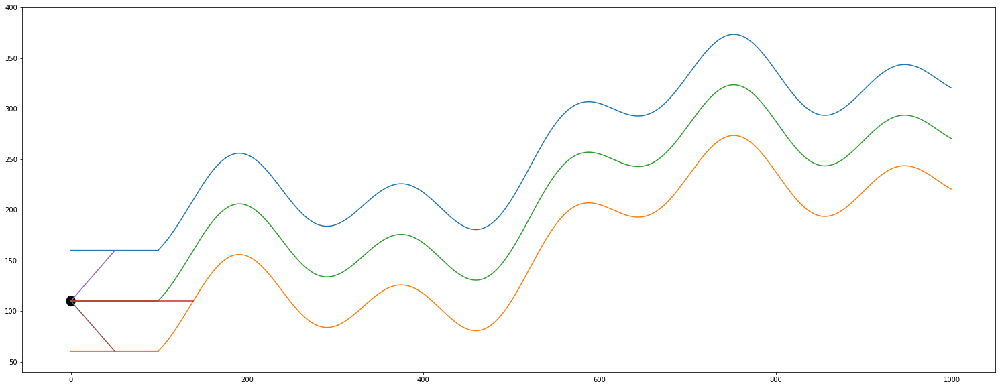

In [5]:
road = Road(wide = 100)
auto = Car(road)

auto.calculate_distances()
auto.plot()

In [6]:
auto.calculate_distances()

Sensor center =  140
Sensor from left wall =  51
Sensor from right wall =  51
most távolsagra van a felső faltól =  50.0
most távolsagra van az alsó faltól =  50.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
self.vertical_distance_from_middle =  0.0
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  0.0
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  0
			 len(self.sensor_left)   =  0
			 len(self.sensor_center) =  0
			 len(self.sensor_right)  =  0
			 self.x                  =  0
			 -------------- Teszt End --------------


# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  140
Sensor from left wall =  51
Sensor from right wall =  51
most távolsagra van a felső faltól =  50.0
most távolsagra van az alsó faltól =  50.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
self.vertical_distance_from_middle =  0.0
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  0.0
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  0
			 len(self.sensor_left)   =  0
			 len(self.sensor_center) =  0
			 len(self.sensor_right)  =  0
			 self.x                  =  0
			 -------------- Teszt End --------------
			 ---------------- 

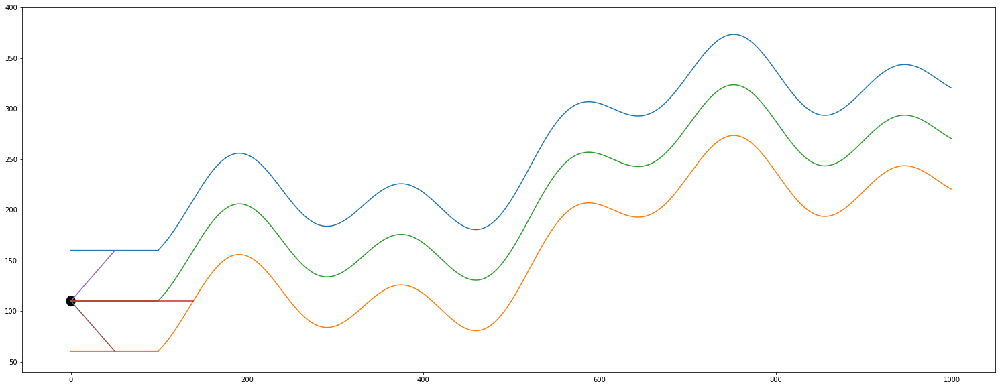

 --- plot --- 
------------------------------ IF i % 3 == 0 ------------------------------
=================== TAKE ACTION ===================
-------- ennyivel módosítom self.y értékét --------
self.y régi értéke =  110.0
self.y új értéke   =  110.0
action             =  0
----------------- módosítás vége -----------------
# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
110.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  0
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  1
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje --------------------------------

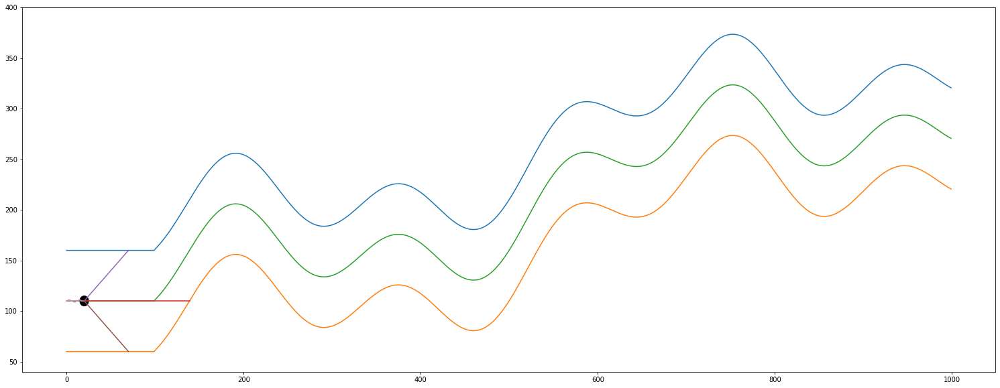

 --- plot --- 
------------------------------ IF i % 3 == 2 ------------------------------
# i =  20
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> down second
Sensor center =  119
Sensor from left wall =  52
Sensor from right wall =  50
most távolsagra van a felső faltól =  51.0
most távolsagra van az alsó faltól =  49.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  20
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
self.vertical_distance_from_middle =  -1.0
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  -1.0
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  21
			 len(self.sensor_left)   =  21
			 len(self.sensor_center) =  21
			 len(self.sensor_right)  =  21
			 self.x              

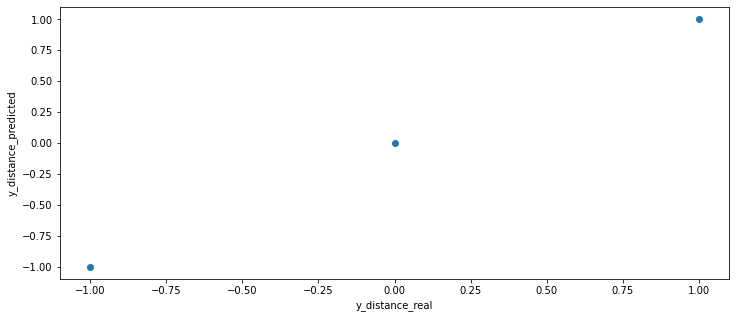

(29, 1)
(29, 1)


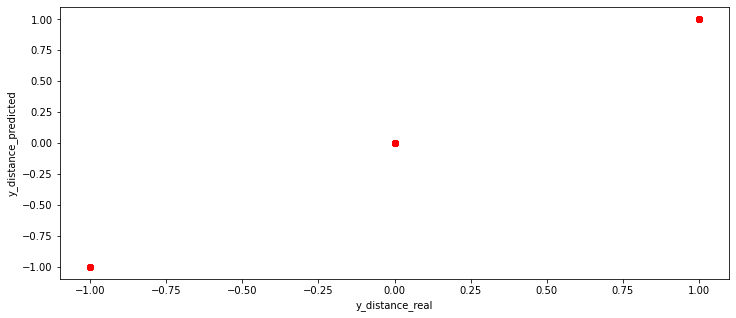

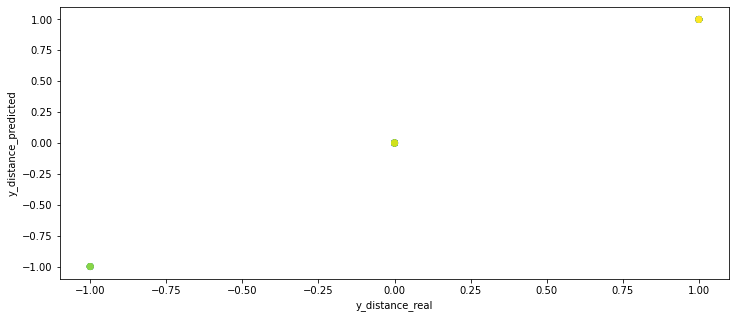

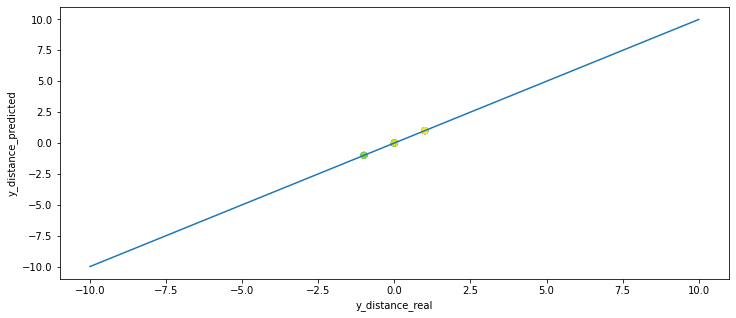

 --- plot predcition --- 
# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
111.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  112
Sensor from left wall =  50
Sensor from right wall =  52
most távolsagra van a felső faltól =  49.0
most távolsagra van az alsó faltól =  51.0
cccccccccccccccccccccccccccccc

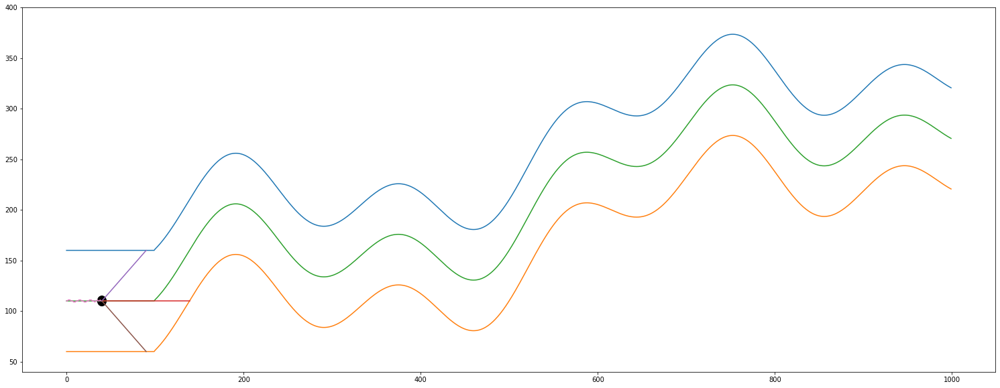

 --- plot --- 
------------------------------ IF i % 3 == 1 ------------------------------
# i =  40
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X_test =  [[ 51 100  51]]
actual predicted =  [[9.2148511e-15]]
actual self.y_distance[-1] =  0.0
len(self.y_distance_real)      =  7
len(self.y_distance_predicted) =  7


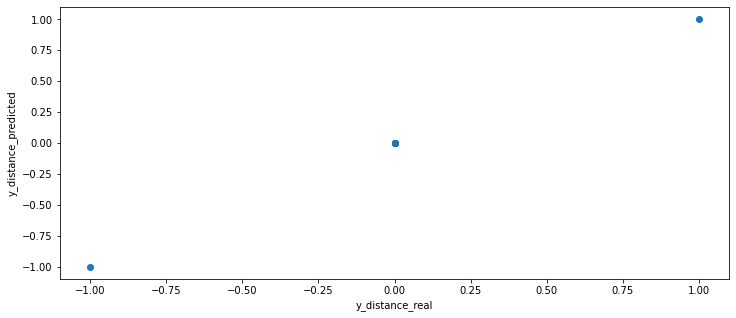

(41, 1)
(41, 1)


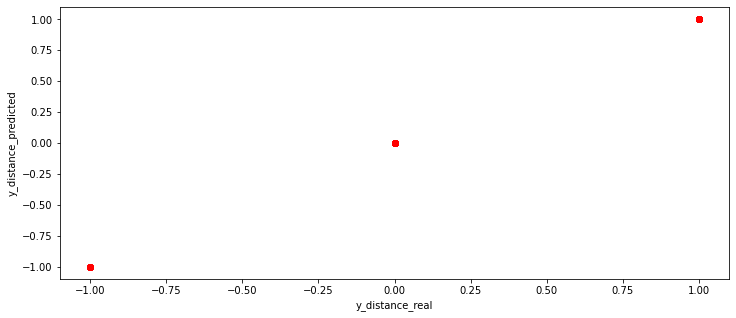

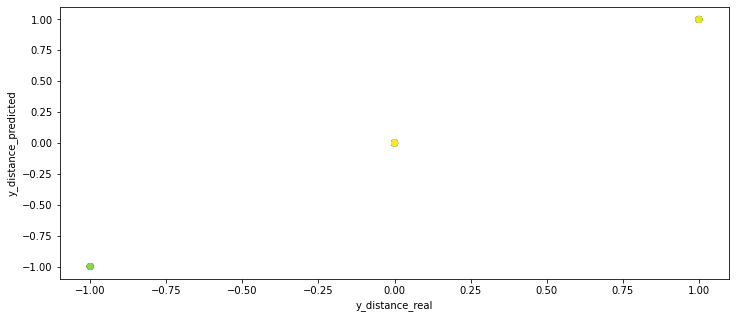

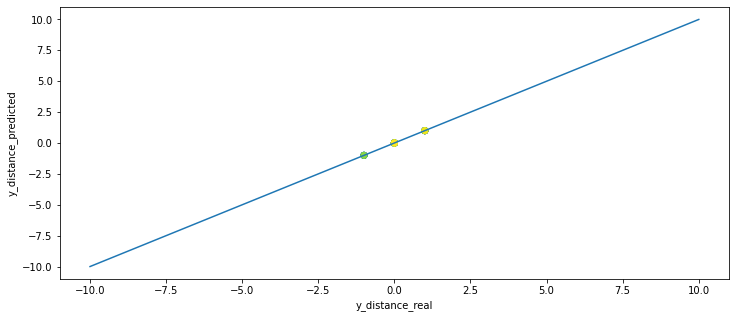

 --- plot predcition --- 
# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
110.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  99
Sensor from left wall =  51
Sensor from right wall =  51
most távolsagra van a felső faltól =  50.0
most távolsagra van az alsó faltól =  50.0
ccccccccccccccccccccccccccccccc

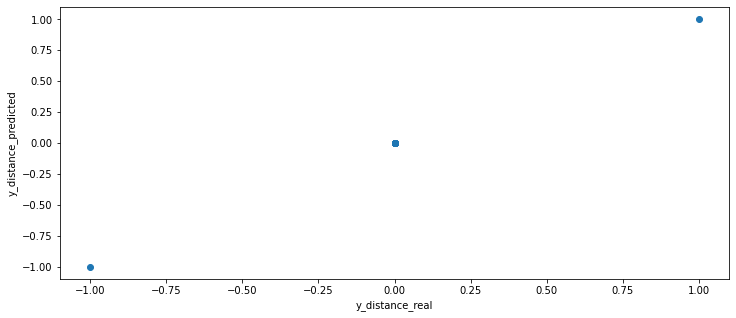

(53, 1)
(53, 1)


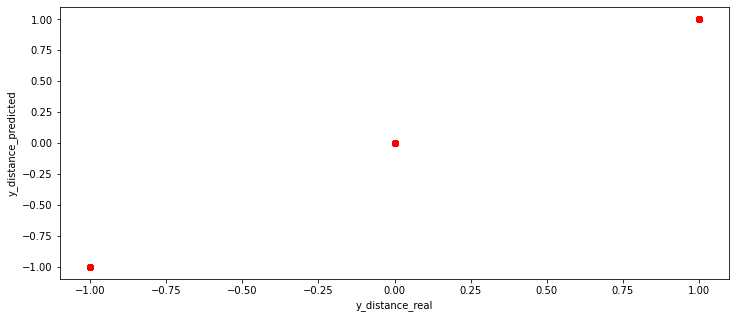

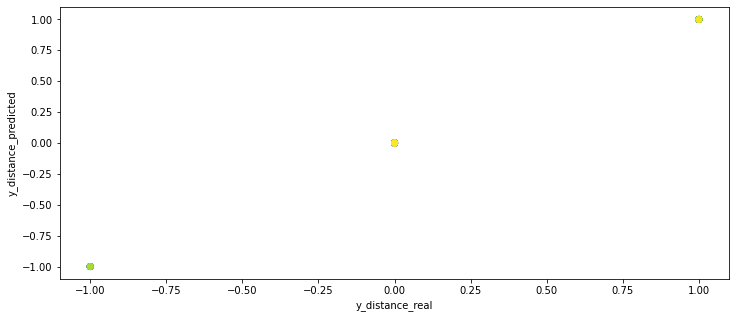

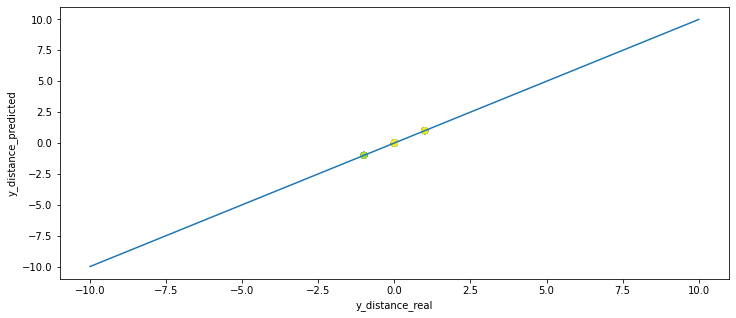

 --- plot predcition --- 
# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
110.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  87
Sensor from left wall =  51
Sensor from right wall =  51
most távolsagra van a felső faltól =  50.0
most távolsagra van az alsó faltól =  50.0
ccccccccccccccccccccccccccccccc

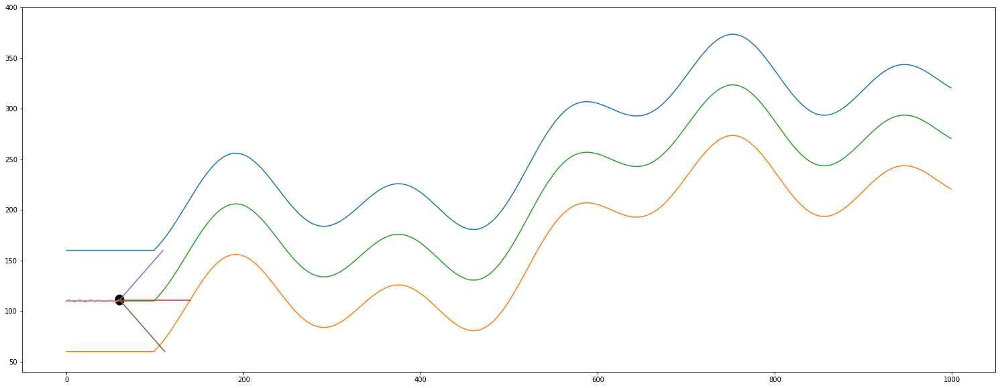

 --- plot --- 
------------------------------ IF i % 3 == 0 ------------------------------
# i =  60
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (61, 3)
y.shape =  (61, 1)
i       =  60
------------------------------ IF len(self.before) > 9 ------------------------------


# i =  60
  Ha már van elég before after adatunk
# 3. Tanulás itt kerül kiszámításra a lineáris regresszió minden egyes metrikára
# Linear Regression Learning --------------------------------------------------------------------------------------
		 # Linear Regression Training Results -------------------------------------------------------------------------
		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_left.coef_ =  [[ 1. -1.]]
		 regression_left.intercept_ =  [1.42108547e-14]
		 ------------------------------- valyon mennyire jó ennek a metrikána

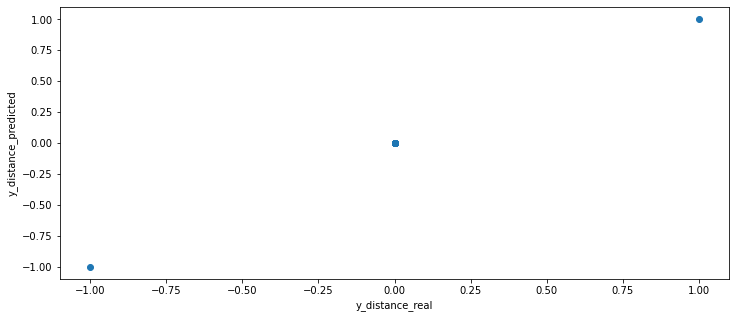

(65, 1)
(65, 1)


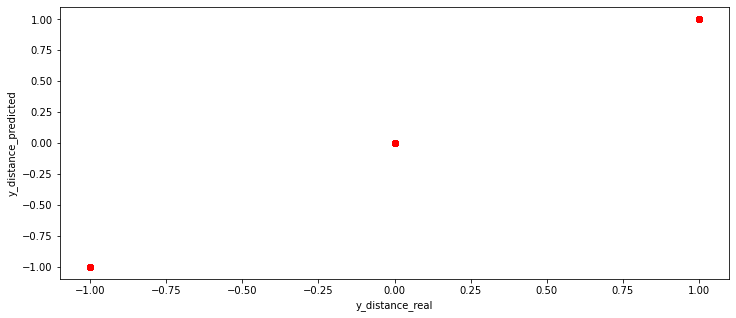

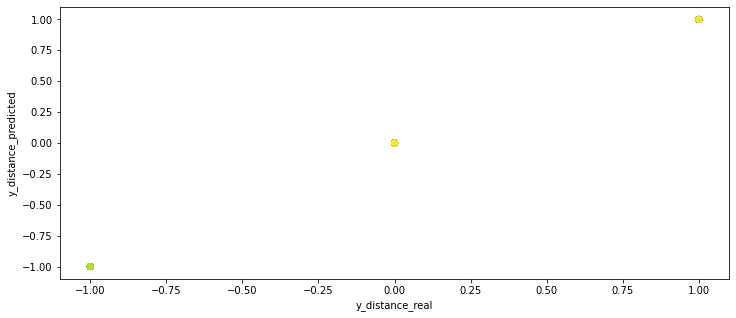

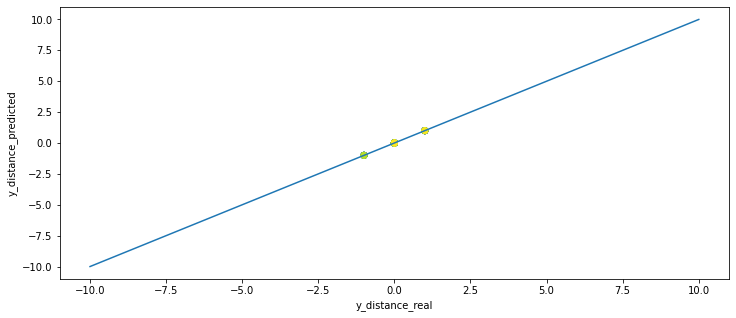

 --- plot predcition --- 
# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
110.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  75
Sensor from left wall =  51
Sensor from right wall =  51
most távolsagra van a felső faltól =  50.0
most távolsagra van az alsó faltól =  50.0
ccccccccccccccccccccccccccccccc

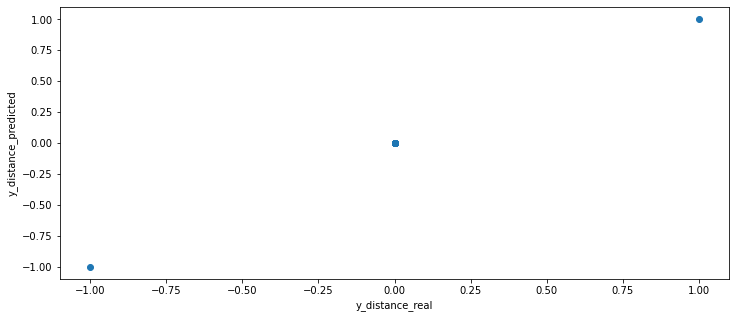

(77, 1)
(77, 1)


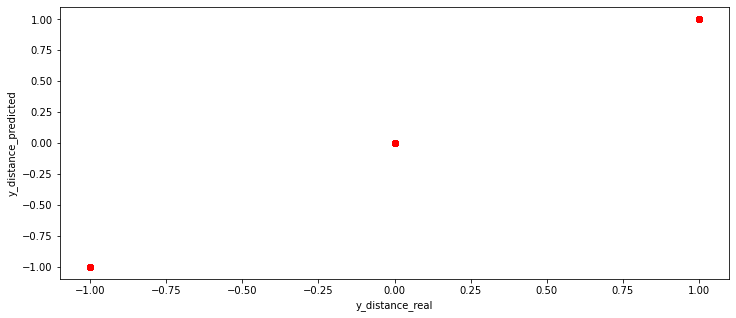

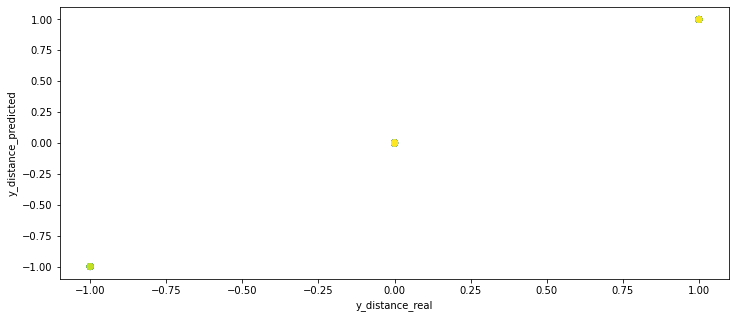

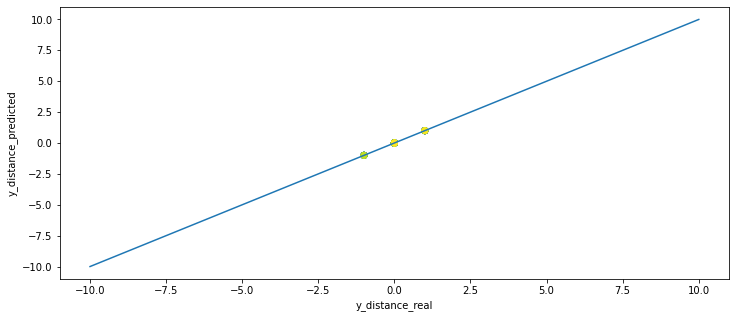

 --- plot predcition --- 
# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
110.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  63
Sensor from left wall =  51
Sensor from right wall =  51
most távolsagra van a felső faltól =  50.0
most távolsagra van az alsó faltól =  50.0
ccccccccccccccccccccccccccccccc

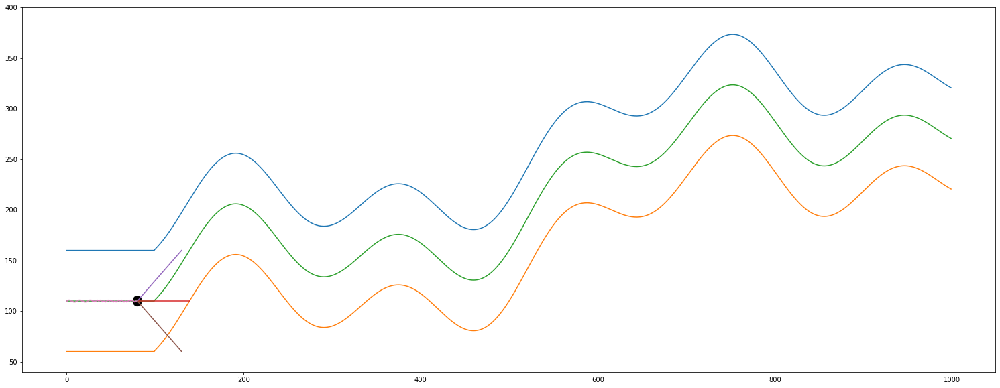

 --- plot --- 
------------------------------ IF i % 3 == 2 ------------------------------
# i =  80
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> down second
Sensor center =  59
Sensor from left wall =  52
Sensor from right wall =  50
most távolsagra van a felső faltól =  51.0
most távolsagra van az alsó faltól =  49.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  80
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
self.vertical_distance_from_middle =  -1.0
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  -1.0
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  81
			 len(self.sensor_left)   =  81
			 len(self.sensor_center) =  81
			 len(self.sensor_right)  =  81
			 self.x               

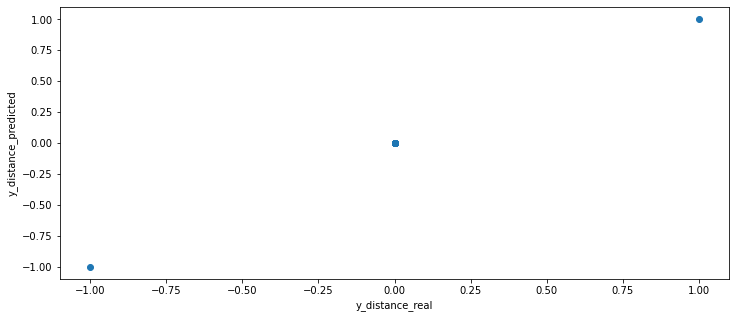

(89, 1)
(89, 1)


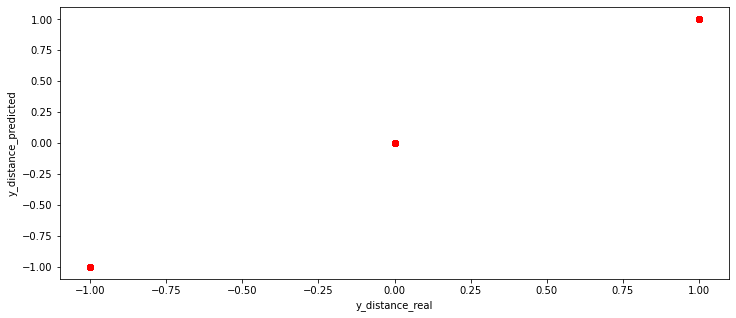

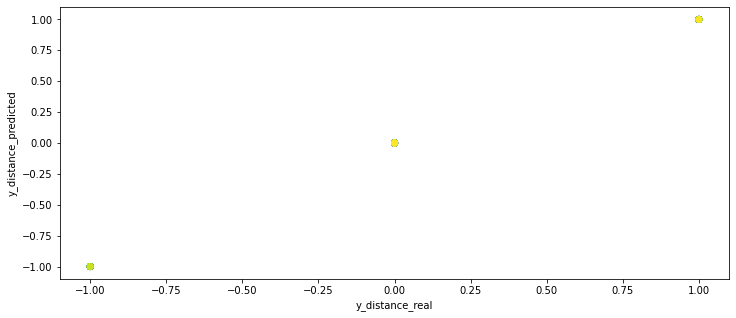

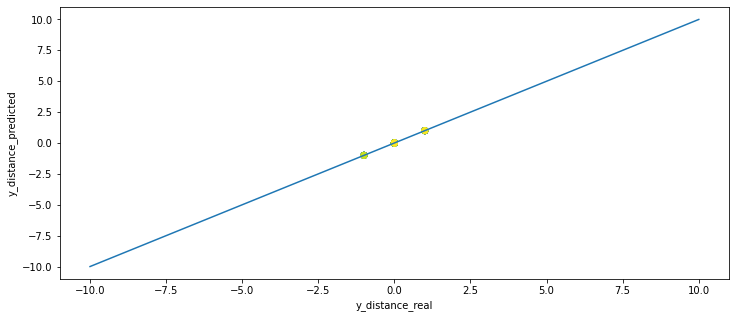

 --- plot predcition --- 
# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
110.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  51
Sensor from left wall =  51
Sensor from right wall =  51
most távolsagra van a felső faltól =  50.0
most távolsagra van az alsó faltól =  50.0
ccccccccccccccccccccccccccccccc

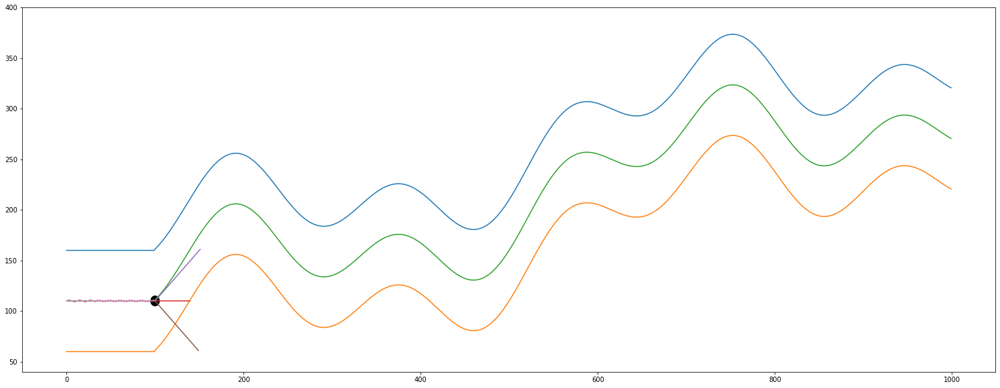

 --- plot --- 
------------------------------ IF i % 3 == 1 ------------------------------
# i =  100
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X_test =  [[52 40 50]]
actual predicted =  [[-1.]]
actual self.y_distance[-1] =  -1.1818514833213953
len(self.y_distance_real)      =  27
len(self.y_distance_predicted) =  27


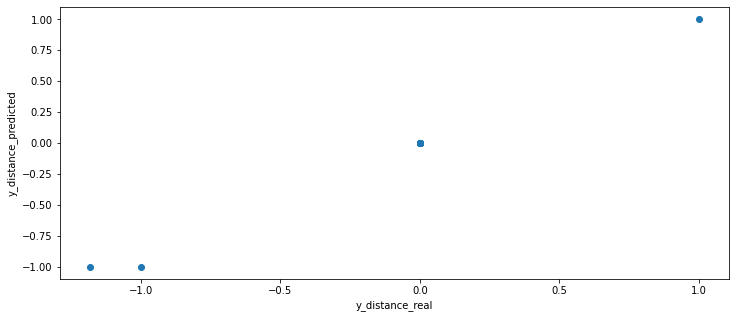

(101, 1)
(101, 1)


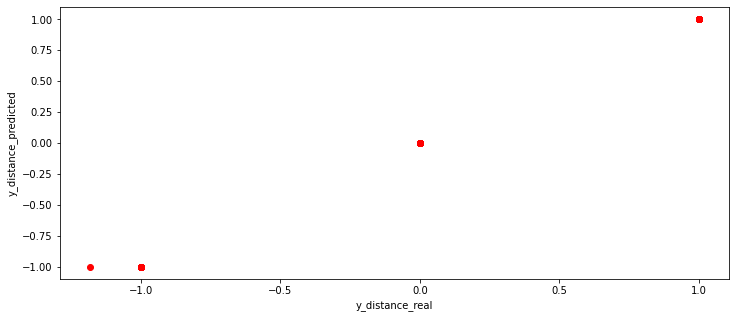

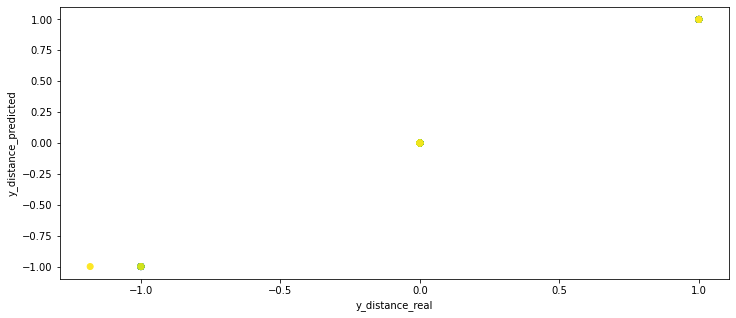

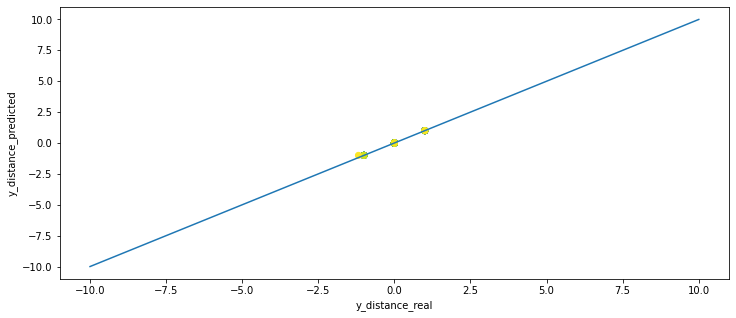

 --- plot predcition --- 
# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
110.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  39
Sensor from left wall =  53
Sensor from right wall =  49
most távolsagra van a felső faltól =  52.073810289961955
most távolsagra van az alsó faltól =  47.92618971003806
cccc

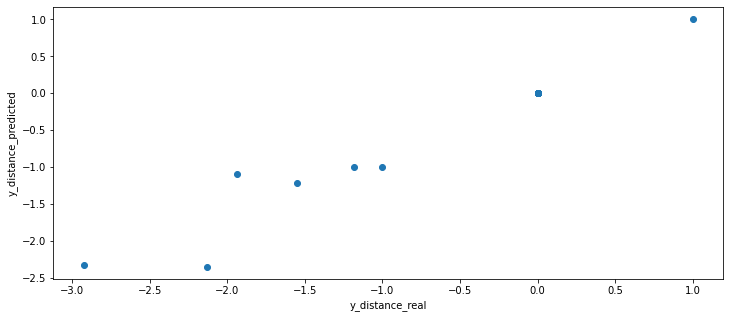

(113, 1)
(113, 1)


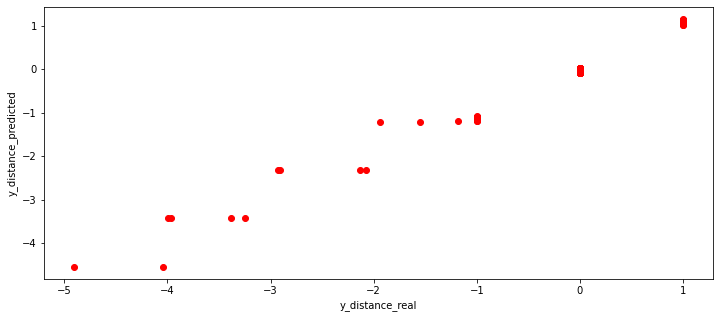

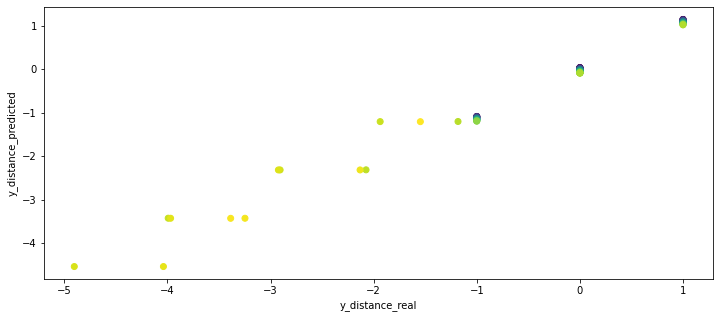

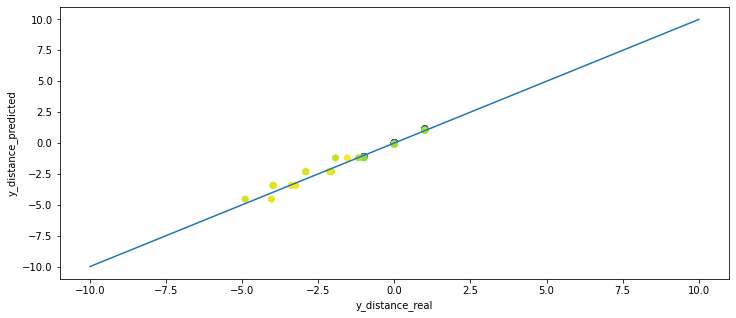

 --- plot predcition --- 
# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
122.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  36
Sensor from left wall =  53
Sensor from right wall =  49
most távolsagra van a felső faltól =  52.728924091668205
most távolsagra van az alsó faltól =  47.271075908331795
ccc

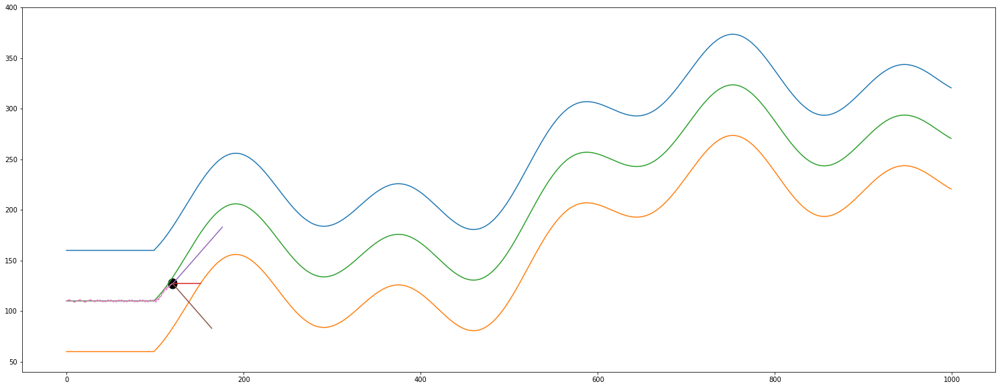

 --- plot --- 
------------------------------ IF i % 3 == 0 ------------------------------
# i =  120
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (121, 3)
y.shape =  (121, 1)
i       =  120
------------------------------ IF len(self.before) > 9 ------------------------------


# i =  120
  Ha már van elég before after adatunk
# 3. Tanulás itt kerül kiszámításra a lineáris regresszió minden egyes metrikára
# Linear Regression Learning --------------------------------------------------------------------------------------
		 # Linear Regression Training Results -------------------------------------------------------------------------
		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_left.coef_ =  [[ 1. -1.]]
		 regression_left.intercept_ =  [0.]
		 ------------------------------- valyon mennyire jó ennek a metrikának a bec

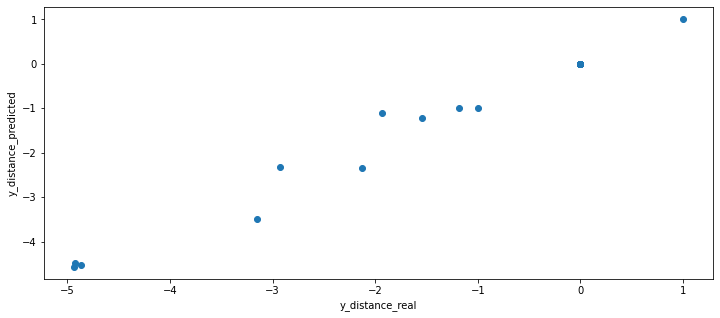

(125, 1)
(125, 1)


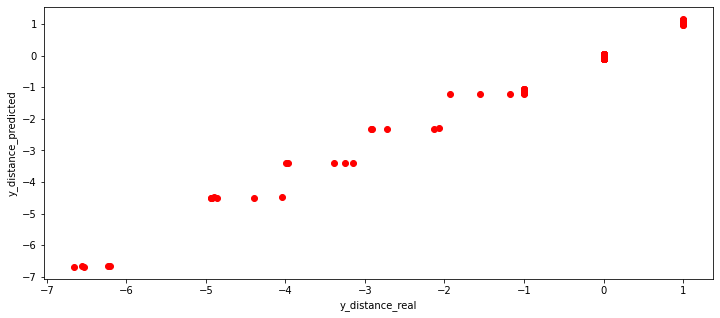

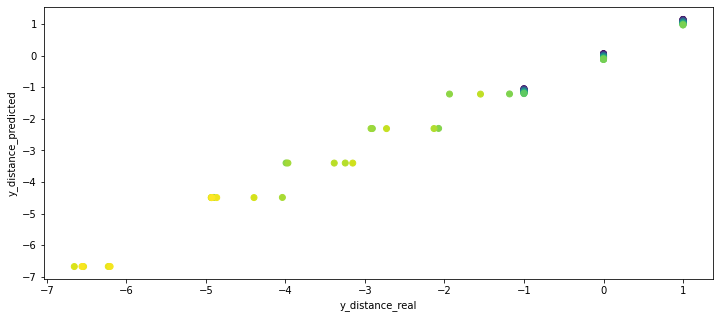

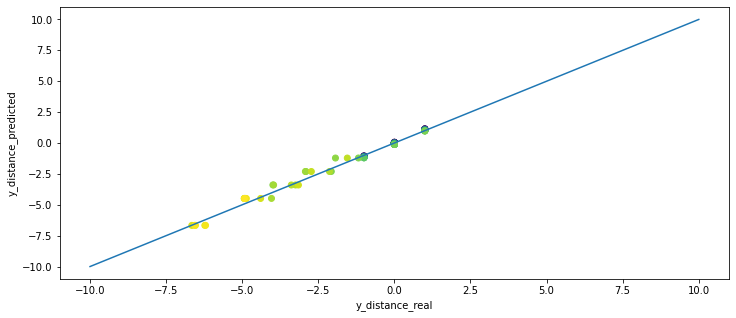

 --- plot predcition --- 
# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
134.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  33
Sensor from left wall =  57
Sensor from right wall =  45
most távolsagra van a felső faltól =  56.302711336892486
most távolsagra van az alsó faltól =  43.697288663107514
ccc

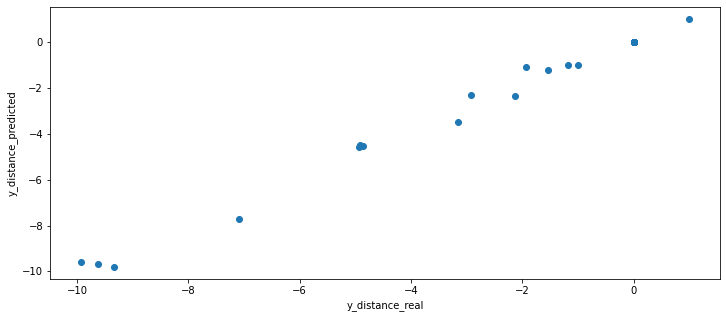

(137, 1)
(137, 1)


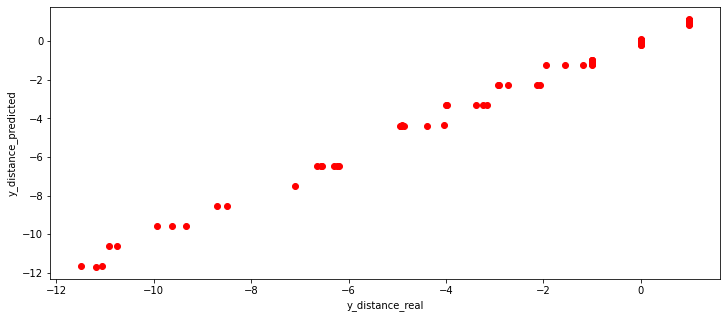

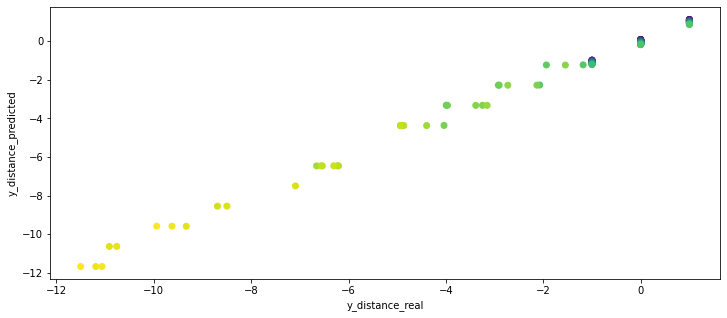

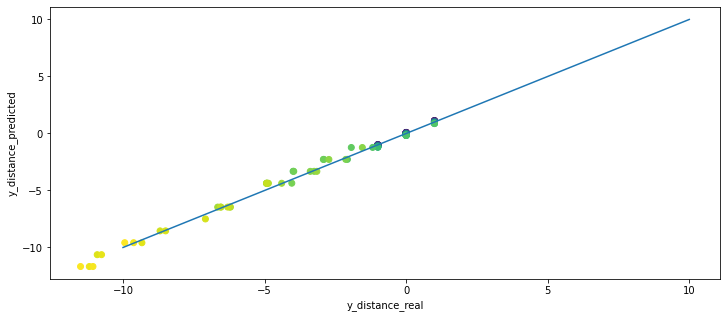

 --- plot predcition --- 
# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
146.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  33
Sensor from left wall =  62
Sensor from right wall =  40
most távolsagra van a felső faltól =  61.37660352763322
most távolsagra van az alsó faltól =  38.62339647236678
ccccc

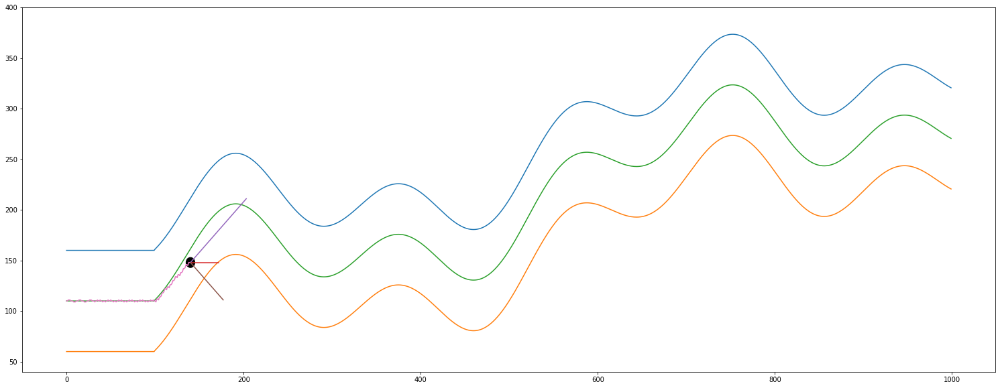

 --- plot --- 
------------------------------ IF i % 3 == 2 ------------------------------
# i =  140
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> down second
Sensor center =  31
Sensor from left wall =  65
Sensor from right wall =  37
most távolsagra van a felső faltól =  64.67393782694975
most távolsagra van az alsó faltól =  35.326062173050246
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  140
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
self.vertical_distance_from_middle =  -14.673937826949754
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  -14.673937826949754
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  141
			 len(self.sensor_left)   =  141
			 len(self.sensor_center) =  1

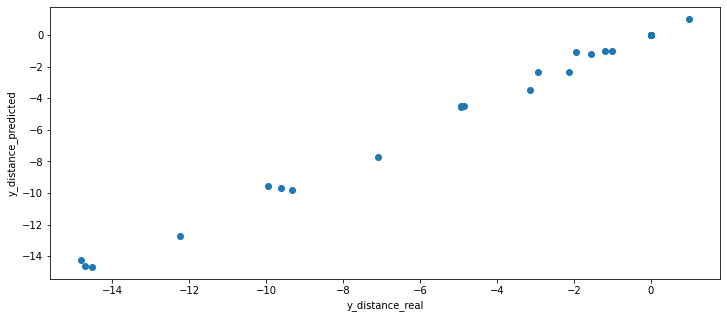

(149, 1)
(149, 1)


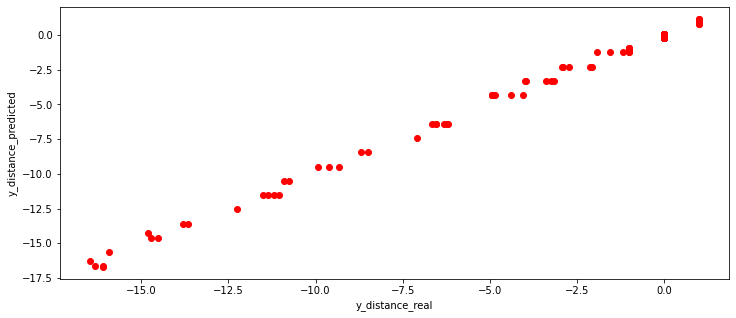

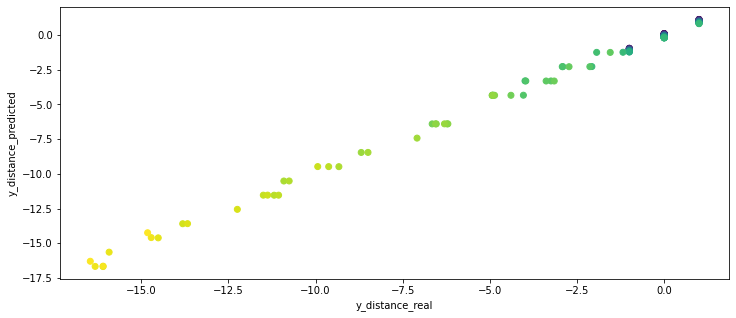

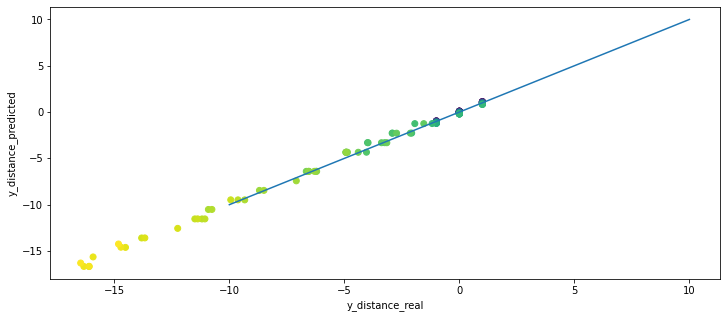

 --- plot predcition --- 
# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
158.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor from left wall =  67
Sensor from right wall =  35
most távolsagra van a felső faltól =  66.15979071109382
most távolsagra van az alsó faltól =  33.84020928890618
ccccccccccccccccccccccccc

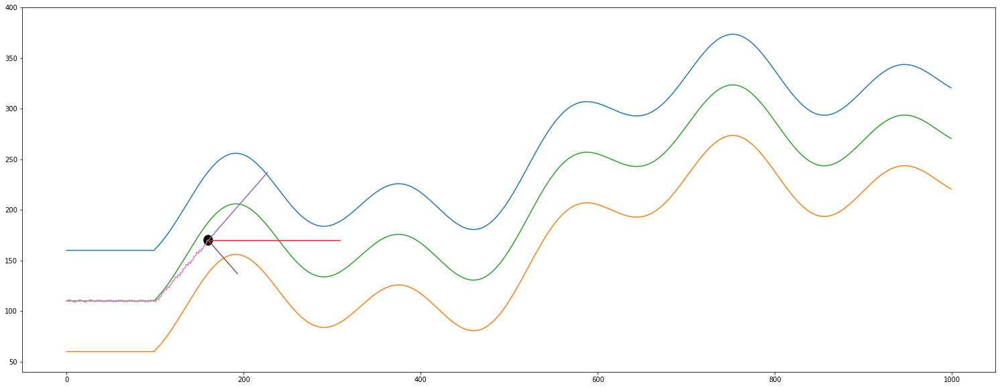

 --- plot --- 
------------------------------ IF i % 3 == 1 ------------------------------
# i =  160
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X_test =  [[ 68 150  34]]
actual predicted =  [[-17.39336507]]
actual self.y_distance[-1] =  -17.678047558086774
len(self.y_distance_real)      =  47
len(self.y_distance_predicted) =  47


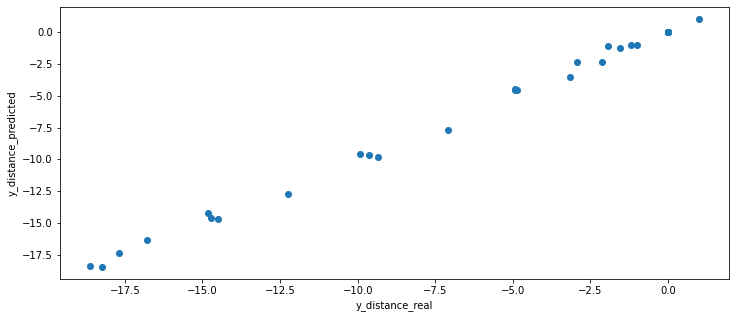

(161, 1)
(161, 1)


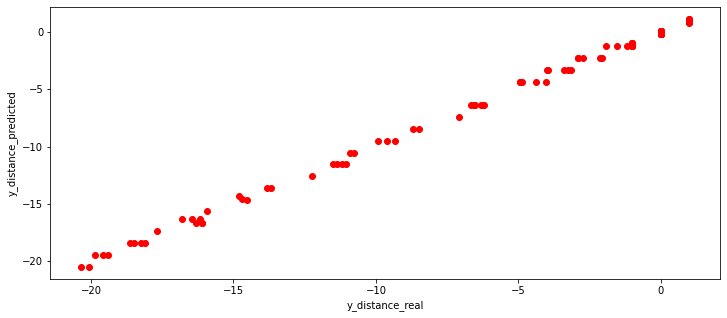

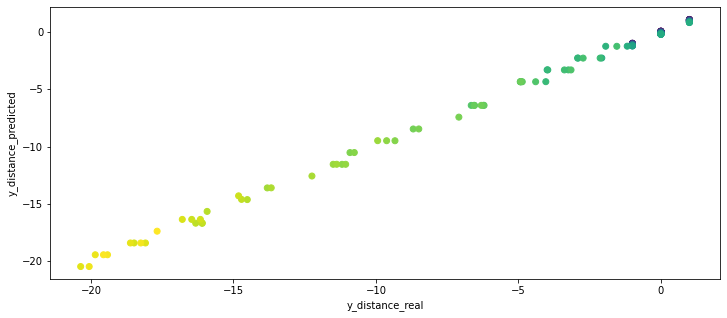

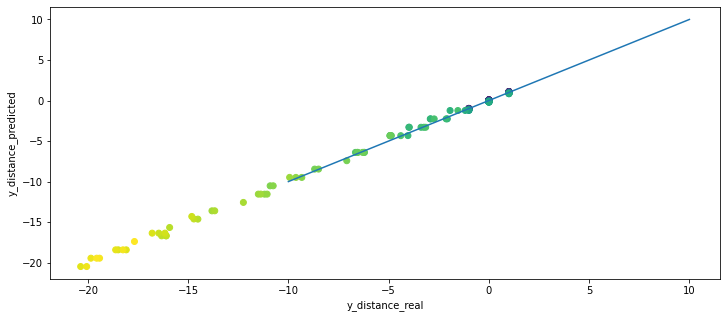

 --- plot predcition --- 
# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
170.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor from left wall =  69
Sensor from right wall =  33
most távolsagra van a felső faltól =  68.76902782313368
most távolsagra van az alsó faltól =  31.230972176866317
cccccccccccccccccccccccc

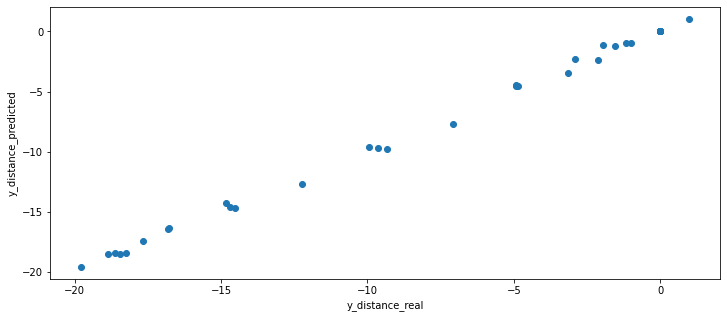

(173, 1)
(173, 1)


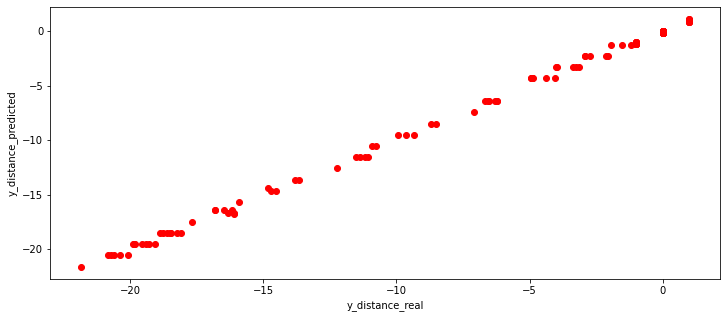

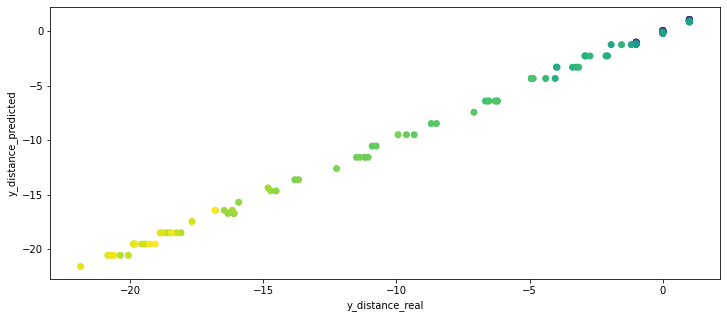

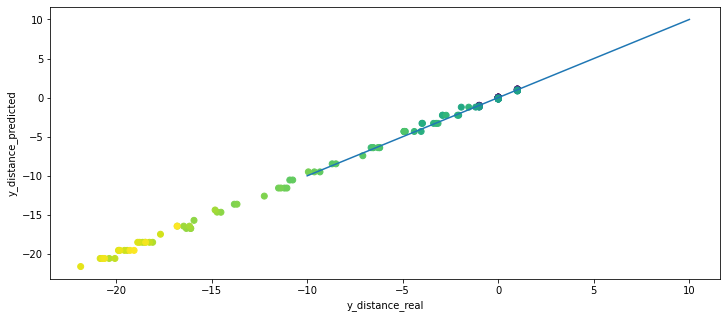

 --- plot predcition --- 
# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
182.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor from left wall =  68
Sensor from right wall =  34
most távolsagra van a felső faltól =  67.52530235919932
most távolsagra van az alsó faltól =  32.474697640800684
cccccccccccccccccccccccc

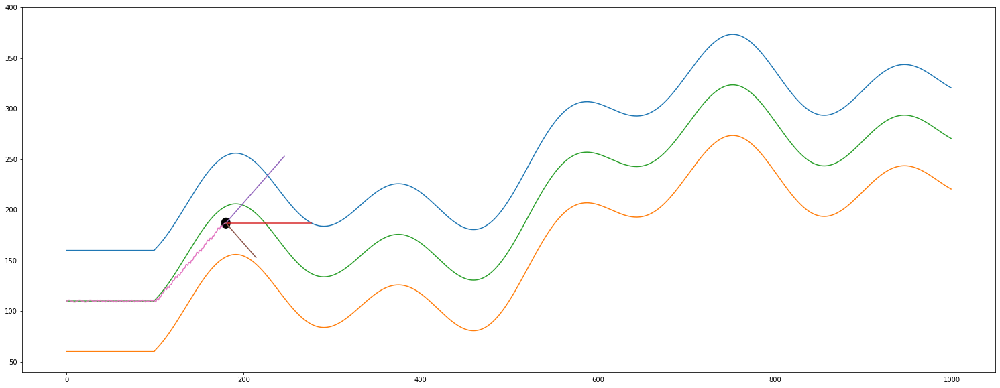

 --- plot --- 
------------------------------ IF i % 3 == 0 ------------------------------
# i =  180
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (181, 3)
y.shape =  (181, 1)
i       =  180
------------------------------ IF len(self.before) > 9 ------------------------------


# i =  180
  Ha már van elég before after adatunk
# 3. Tanulás itt kerül kiszámításra a lineáris regresszió minden egyes metrikára
# Linear Regression Learning --------------------------------------------------------------------------------------
		 # Linear Regression Training Results -------------------------------------------------------------------------
		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_left.coef_ =  [[ 1. -1.]]
		 regression_left.intercept_ =  [2.13162821e-14]
		 ------------------------------- valyon mennyire jó ennek a metr

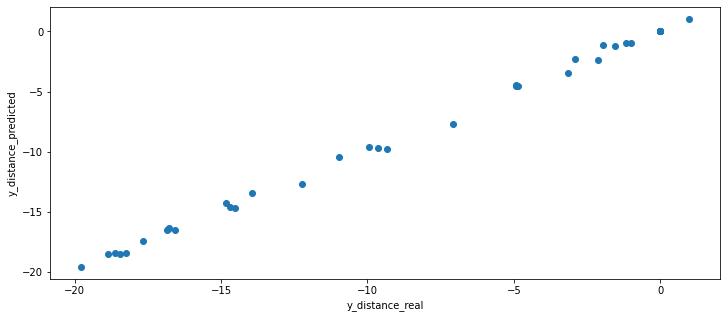

(185, 1)
(185, 1)


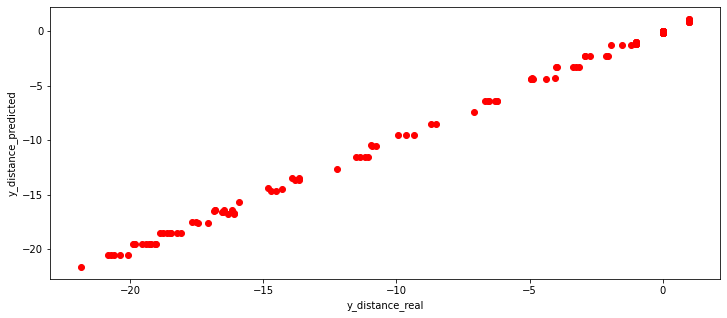

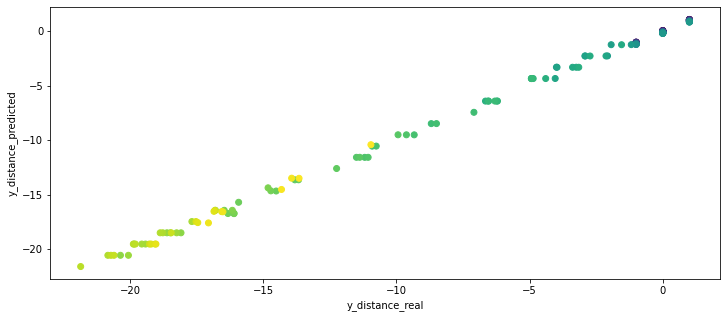

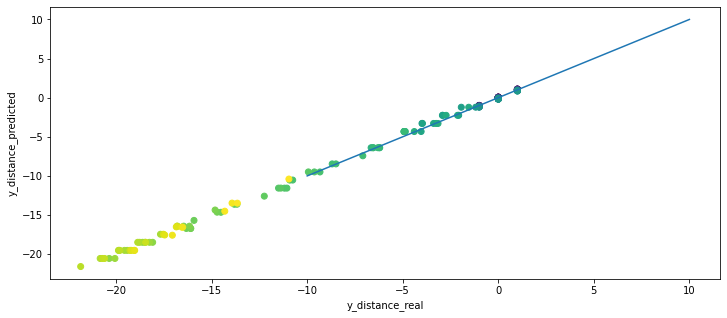

 --- plot predcition --- 
# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
194.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  81
Sensor from left wall =  62
Sensor from right wall =  40
most távolsagra van a felső faltól =  61.220524992253274
most távolsagra van az alsó faltól =  38.779475007746726
ccc

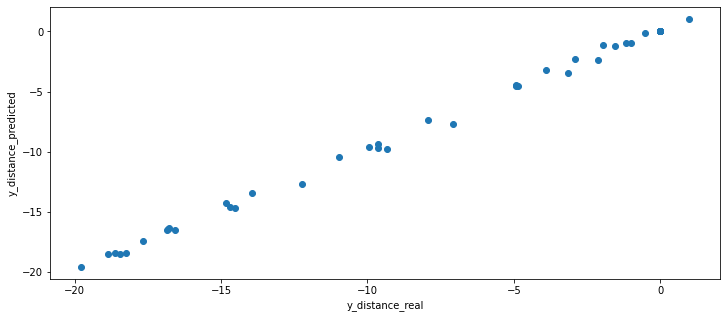

(197, 1)
(197, 1)


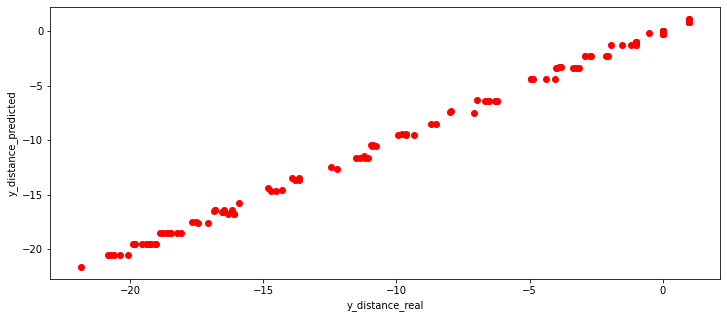

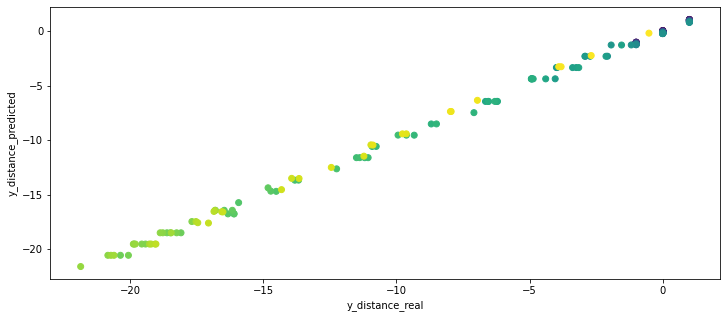

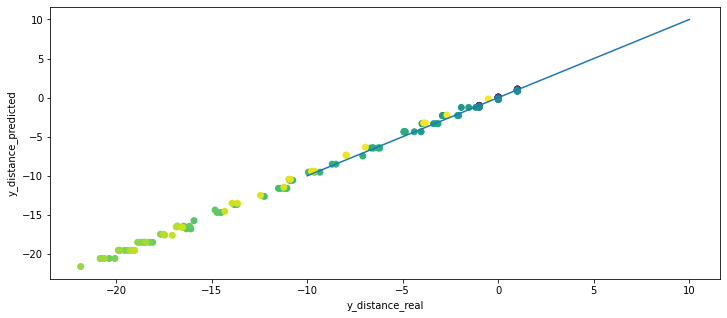

 --- plot predcition --- 
# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
205.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  57
Sensor from left wall =  51
Sensor from right wall =  51
most távolsagra van a felső faltól =  50.31209812663499
most távolsagra van az alsó faltól =  49.68790187336501
ccccc

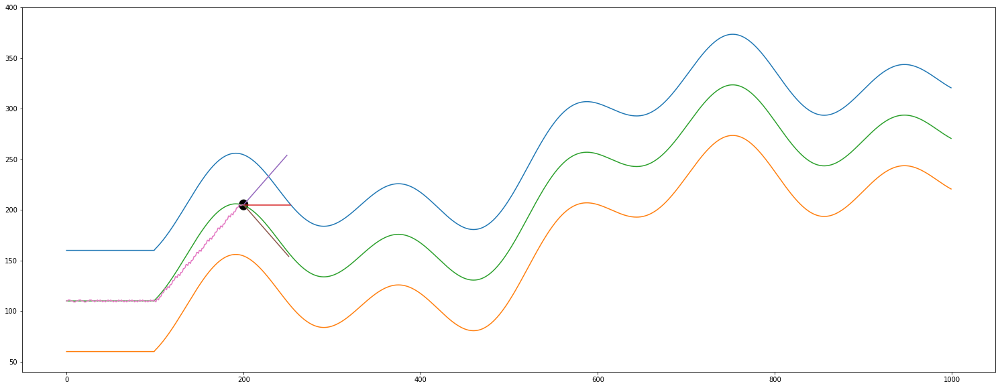

 --- plot --- 
------------------------------ IF i % 3 == 2 ------------------------------
# i =  200
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> down second
Sensor center =  55
Sensor from left wall =  51
Sensor from right wall =  51
most távolsagra van a felső faltól =  50.46779997358041
most távolsagra van az alsó faltól =  49.53220002641959
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  200
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
self.vertical_distance_from_middle =  -0.46779997358041214
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  -0.46779997358041214
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  201
			 len(self.sensor_left)   =  201
			 len(self.sensor_center) =  

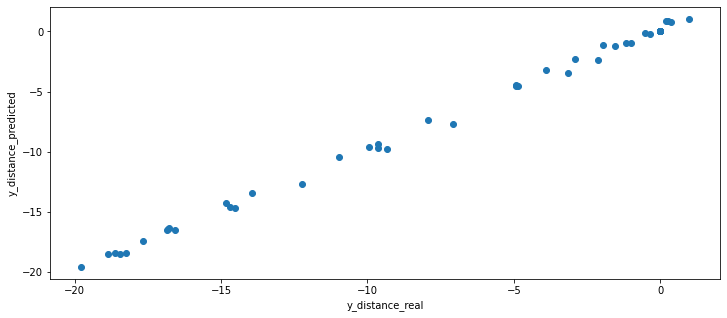

(209, 1)
(209, 1)


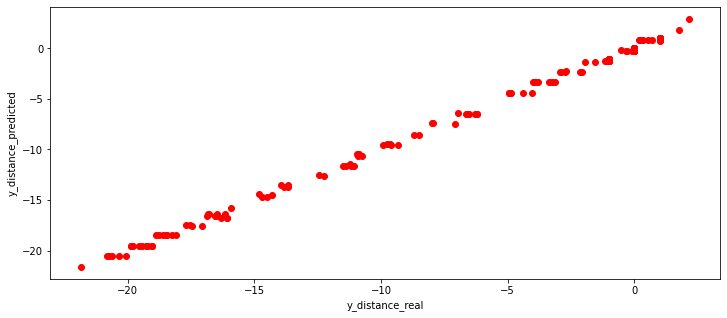

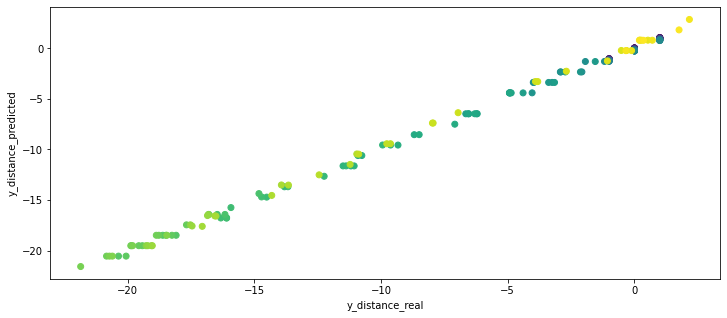

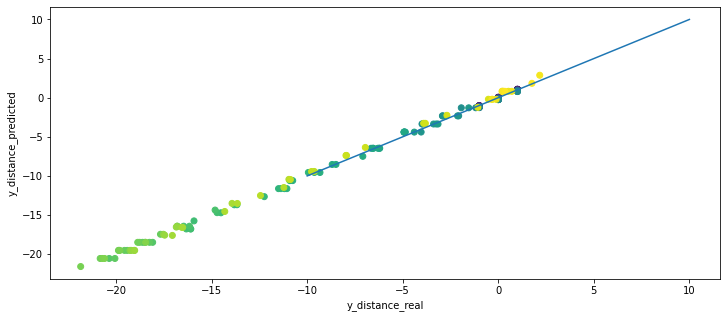

 --- plot predcition --- 
# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
201.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  49
Sensor from left wall =  50
Sensor from right wall =  52
most távolsagra van a felső faltól =  49.01456528690949
most távolsagra van az alsó faltól =  50.98543471309051
ccccc

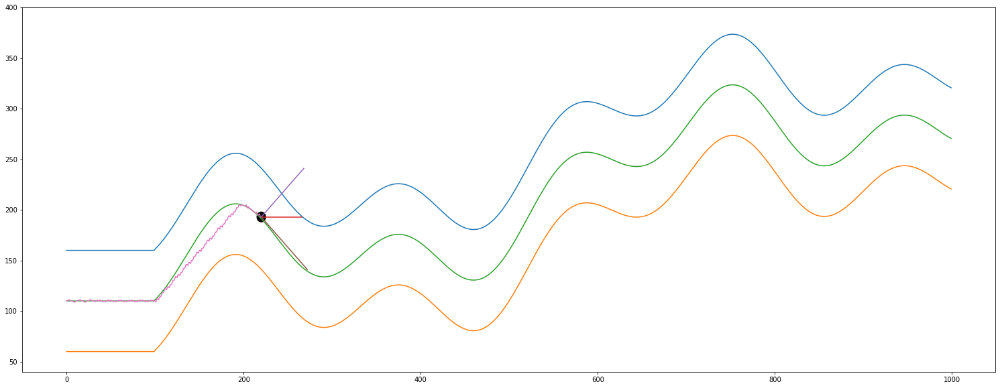

 --- plot --- 
------------------------------ IF i % 3 == 1 ------------------------------
# i =  220
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X_test =  [[49 47 53]]
actual predicted =  [[1.79213248]]
actual self.y_distance[-1] =  1.7792049110944959
len(self.y_distance_real)      =  67
len(self.y_distance_predicted) =  67


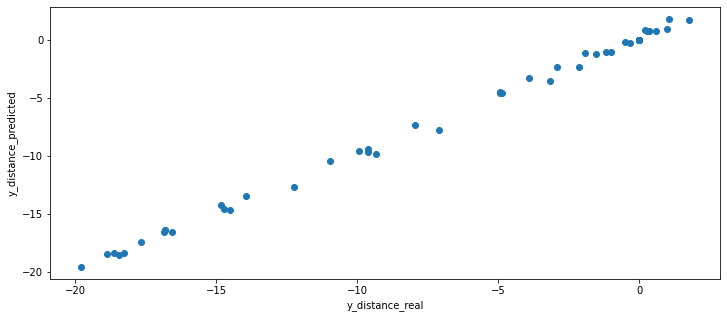

(221, 1)
(221, 1)


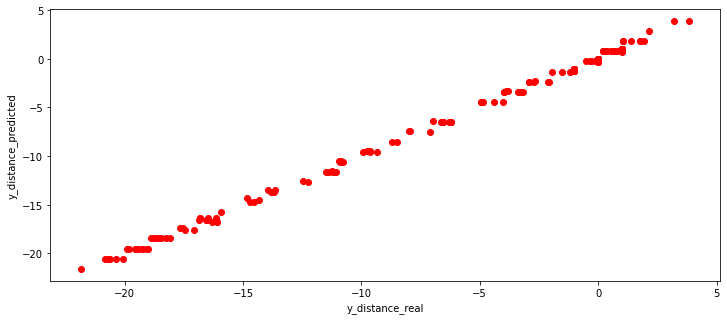

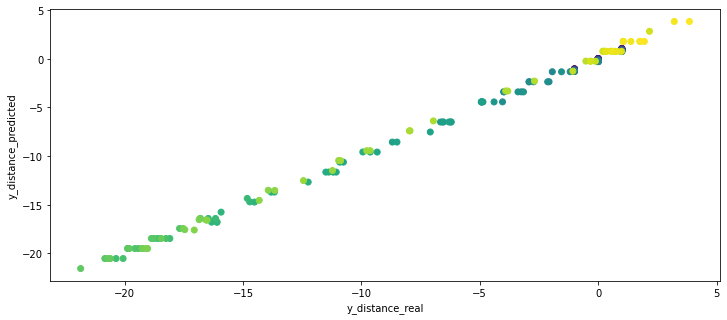

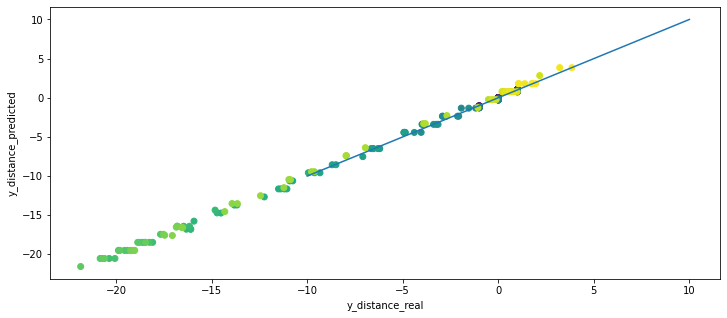

 --- plot predcition --- 
# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
193.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  46
Sensor from left wall =  48
Sensor from right wall =  54
most távolsagra van a felső faltól =  47.27375578672863
most távolsagra van az alsó faltól =  52.72624421327137
ccccc

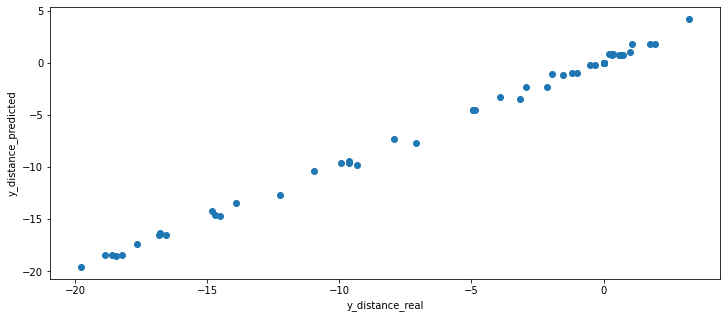

(233, 1)
(233, 1)


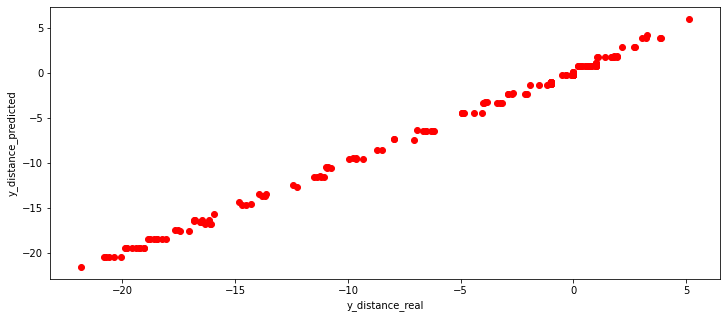

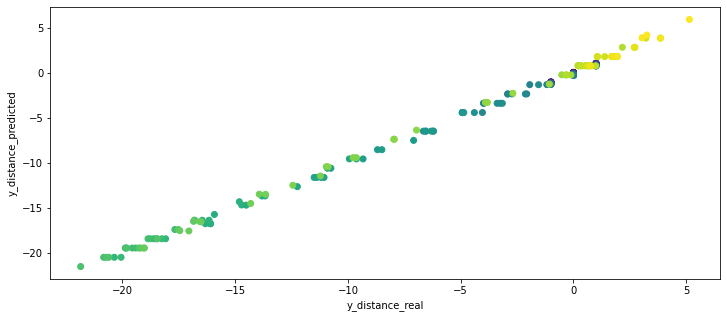

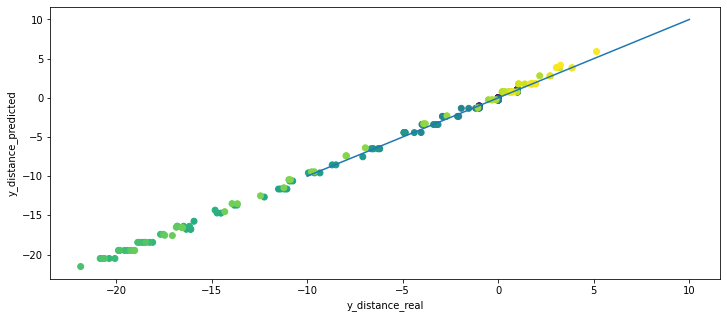

 --- plot predcition --- 
# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
182.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor from left wall =  46
Sensor from right wall =  56
most távolsagra van a felső faltól =  45.62735551254764
most távolsagra van az alsó faltól =  54.37264448745235
ccccccccccccccccccccccccc

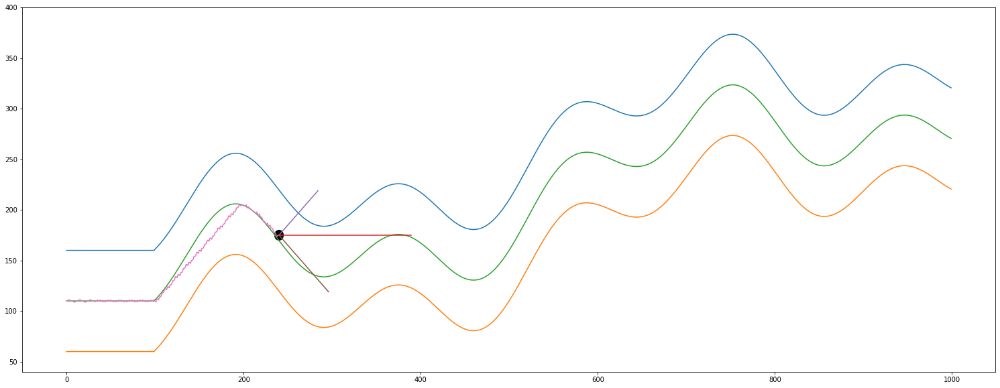

 --- plot --- 
------------------------------ IF i % 3 == 0 ------------------------------
# i =  240
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (241, 3)
y.shape =  (241, 1)
i       =  240
------------------------------ IF len(self.before) > 9 ------------------------------


# i =  240
  Ha már van elég before after adatunk
# 3. Tanulás itt kerül kiszámításra a lineáris regresszió minden egyes metrikára
# Linear Regression Learning --------------------------------------------------------------------------------------
		 # Linear Regression Training Results -------------------------------------------------------------------------
		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_left.coef_ =  [[ 1. -1.]]
		 regression_left.intercept_ =  [2.13162821e-14]
		 ------------------------------- valyon mennyire jó ennek a metr

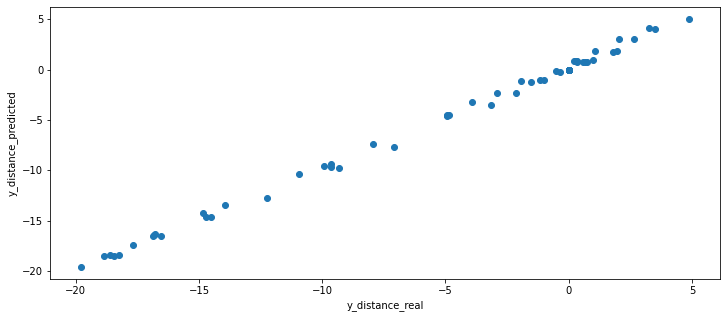

(245, 1)
(245, 1)


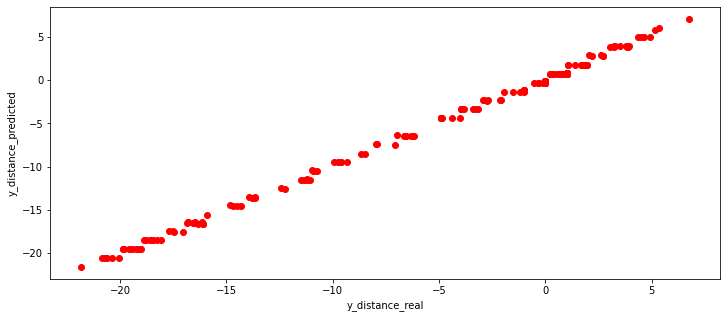

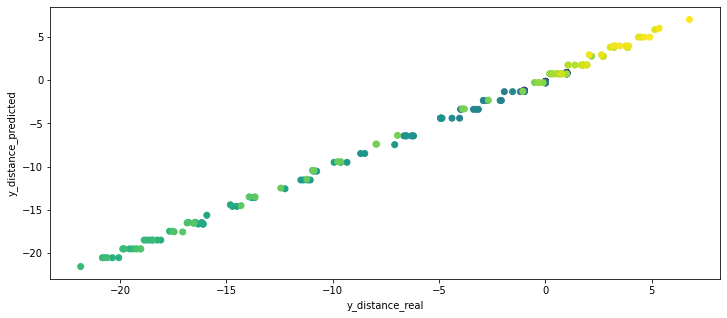

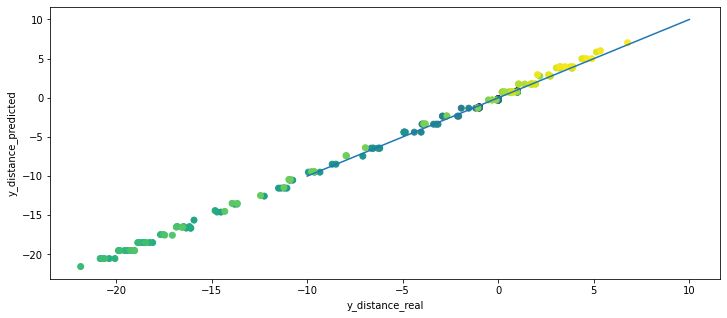

 --- plot predcition --- 
# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
170.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor from left wall =  44
Sensor from right wall =  58
most távolsagra van a felső faltól =  43.97373317698907
most távolsagra van az alsó faltól =  56.02626682301093
ccccccccccccccccccccccccc

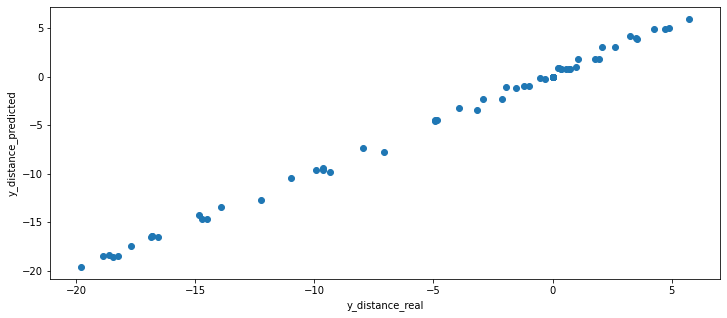

(257, 1)
(257, 1)


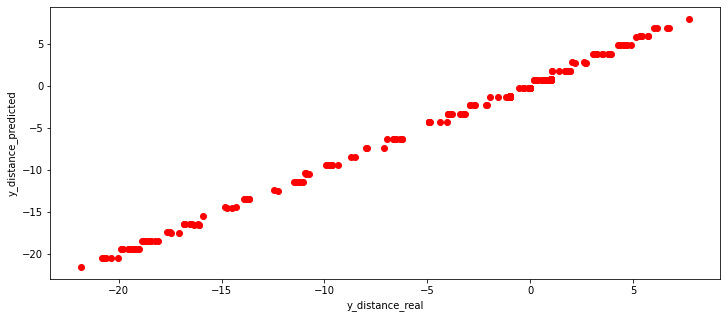

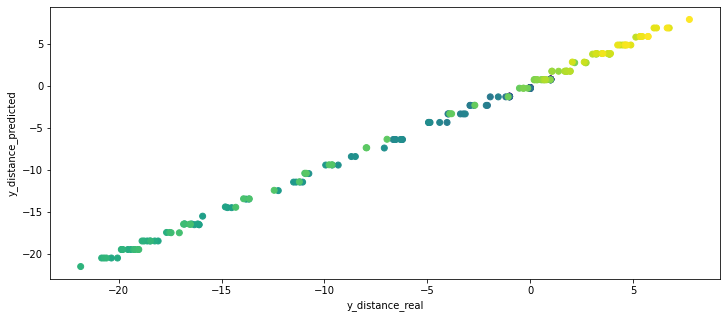

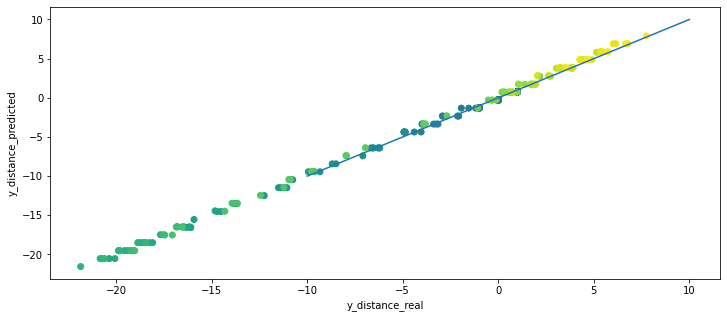

 --- plot predcition --- 
# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
158.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor from left wall =  44
Sensor from right wall =  58
most távolsagra van a felső faltól =  43.28530683255414
most távolsagra van az alsó faltól =  56.71469316744586
ccccccccccccccccccccccccc

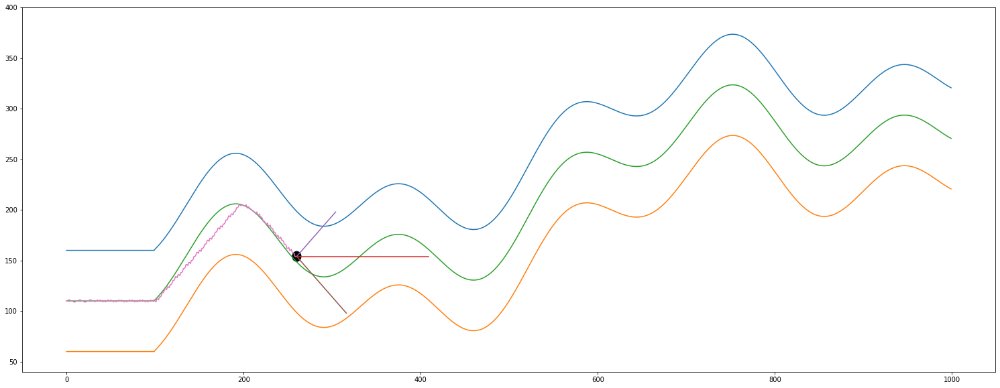

 --- plot --- 
------------------------------ IF i % 3 == 2 ------------------------------
# i =  260
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> down second
Sensor from left wall =  46
Sensor from right wall =  56
most távolsagra van a felső faltól =  45.477907985265404
most távolsagra van az alsó faltól =  54.52209201473461
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  260
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
self.vertical_distance_from_middle =  4.522092014734596
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  4.522092014734596
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  261
			 len(self.sensor_left)   =  261
			 len(self.sensor_center) =  261
			 len(self.sensor_r

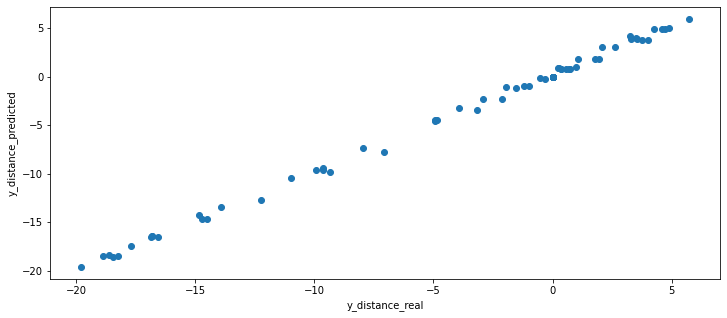

(269, 1)
(269, 1)


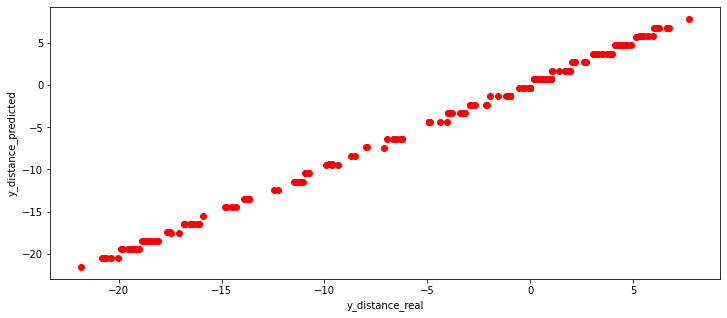

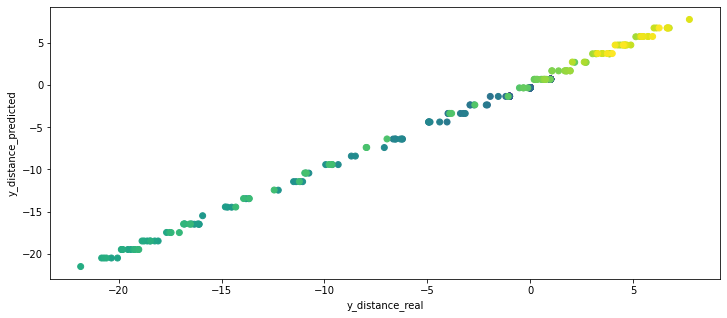

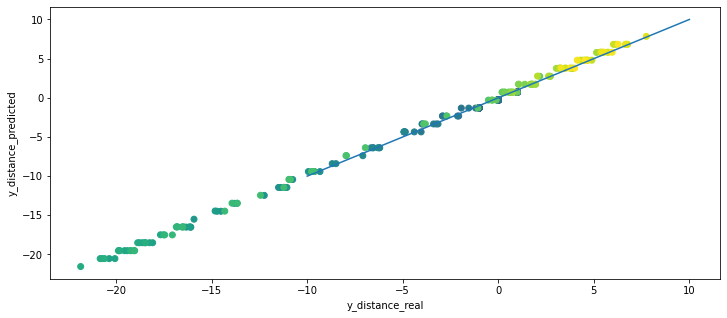

 --- plot predcition --- 
# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
146.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor from left wall =  46
Sensor from right wall =  56
most távolsagra van a felső faltól =  45.311466102785914
most távolsagra van az alsó faltól =  54.6885338972141
ccccccccccccccccccccccccc

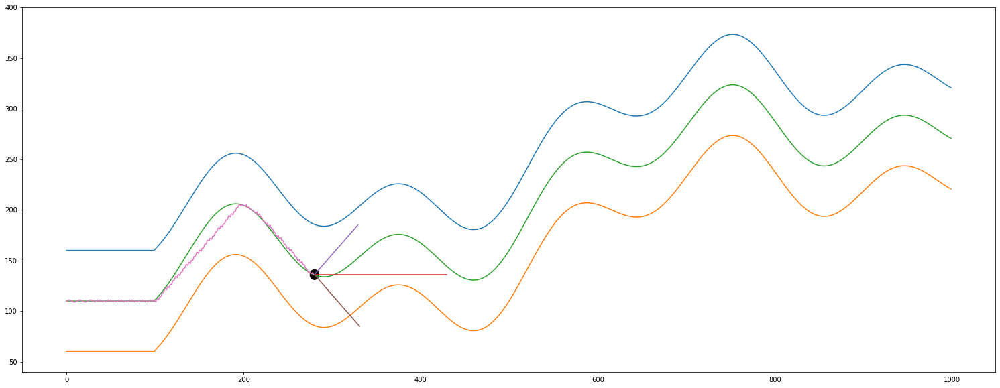

 --- plot --- 
------------------------------ IF i % 3 == 1 ------------------------------
# i =  280
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X_test =  [[ 50 150  52]]
actual predicted =  [[0.7267962]]
actual self.y_distance[-1] =  0.35429860747535713
len(self.y_distance_real)      =  87
len(self.y_distance_predicted) =  87


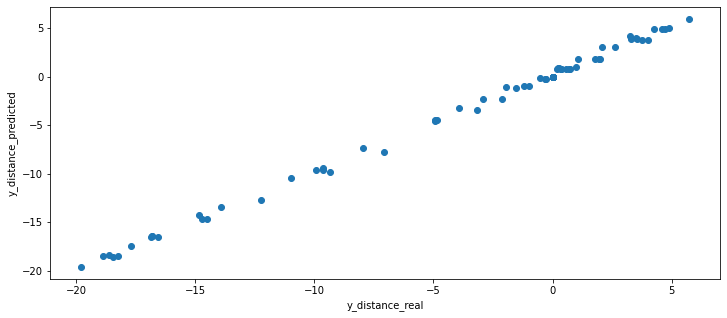

(281, 1)
(281, 1)


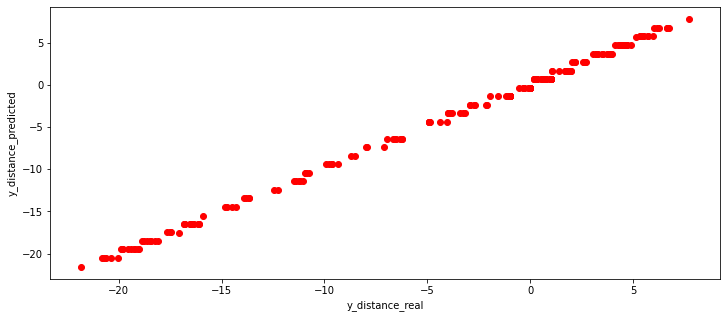

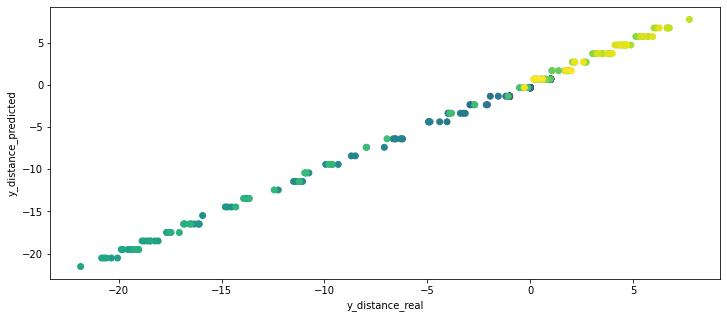

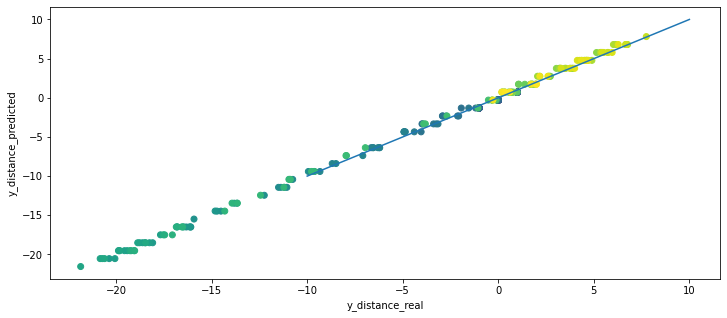

 --- plot predcition --- 
# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
136.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor from left wall =  50
Sensor from right wall =  52
most távolsagra van a felső faltól =  49.31769354702362
most távolsagra van az alsó faltól =  50.68230645297638
ccccccccccccccccccccccccc

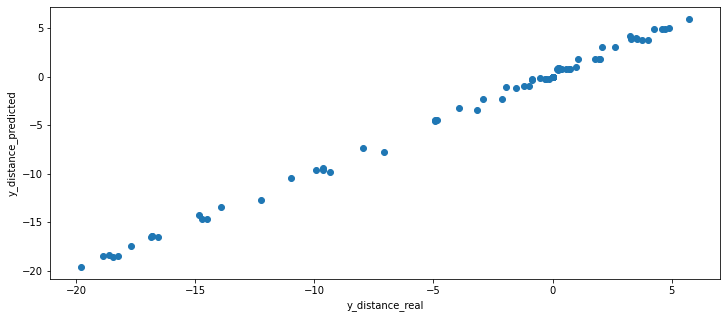

(293, 1)
(293, 1)


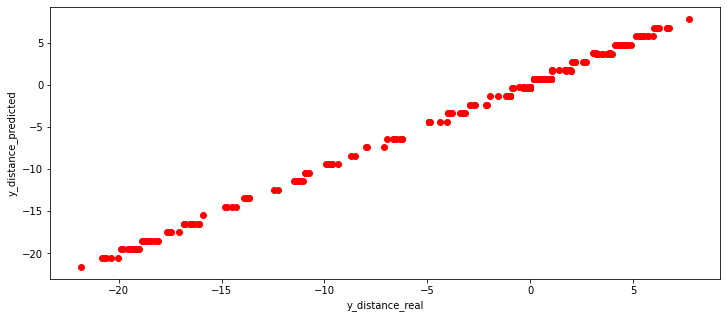

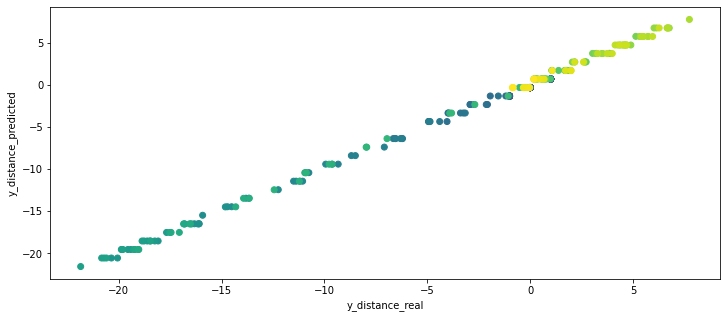

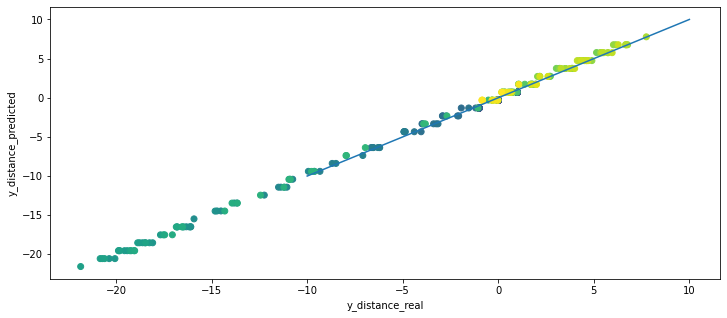

 --- plot predcition --- 
# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
133.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor from left wall =  51
Sensor from right wall =  51
most távolsagra van a felső faltól =  50.901797174595
most távolsagra van az alsó faltól =  49.098202825405
ccccccccccccccccccccccccccccc

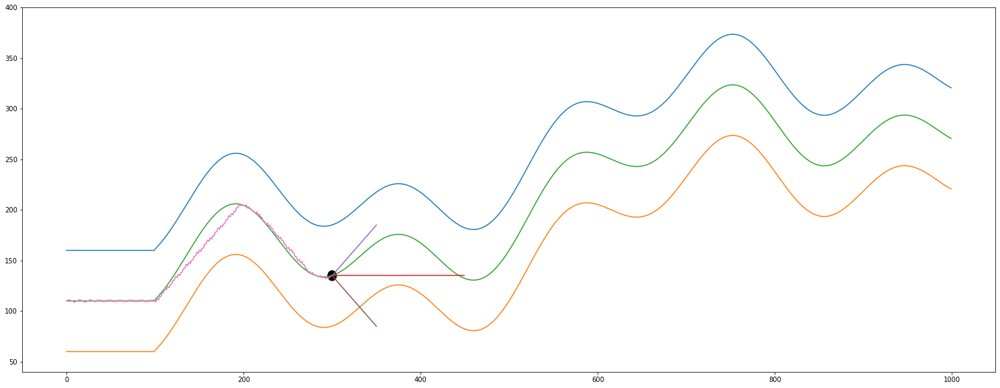

 --- plot --- 
------------------------------ IF i % 3 == 0 ------------------------------
# i =  300
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (301, 3)
y.shape =  (301, 1)
i       =  300
------------------------------ IF len(self.before) > 9 ------------------------------


# i =  300
  Ha már van elég before after adatunk
# 3. Tanulás itt kerül kiszámításra a lineáris regresszió minden egyes metrikára
# Linear Regression Learning --------------------------------------------------------------------------------------
		 # Linear Regression Training Results -------------------------------------------------------------------------
		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_left.coef_ =  [[ 1. -1.]]
		 regression_left.intercept_ =  [2.13162821e-14]
		 ------------------------------- valyon mennyire jó ennek a metr

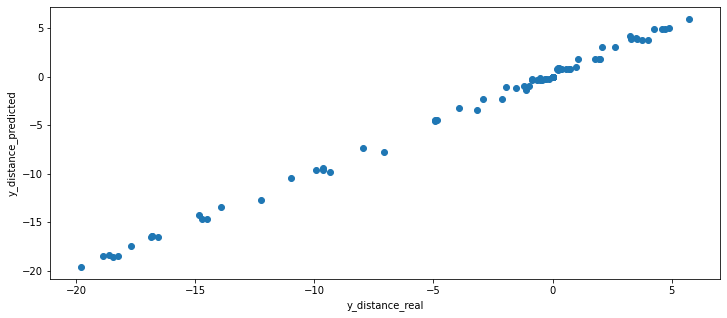

(305, 1)
(305, 1)


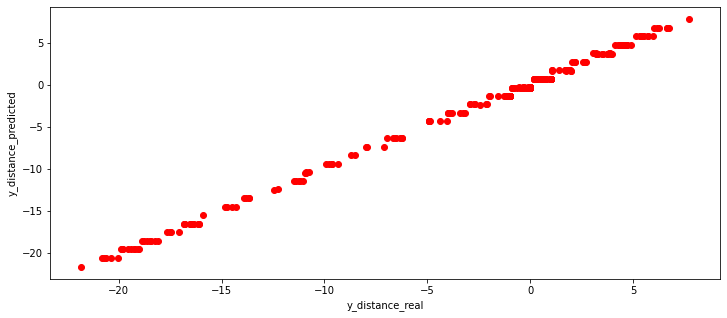

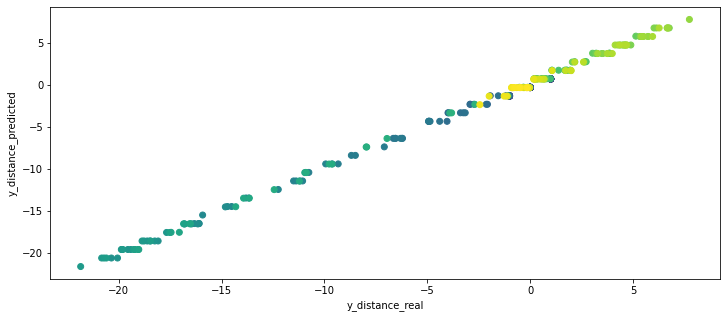

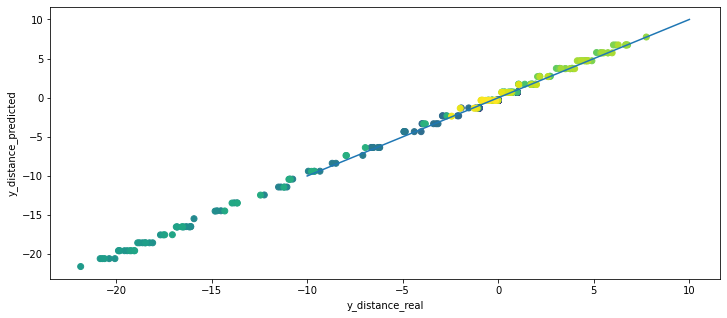

 --- plot predcition --- 
# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
136.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor from left wall =  51
Sensor from right wall =  51
most távolsagra van a felső faltól =  50.915980511779765
most távolsagra van az alsó faltól =  49.08401948822022
cccccccccccccccccccccccc

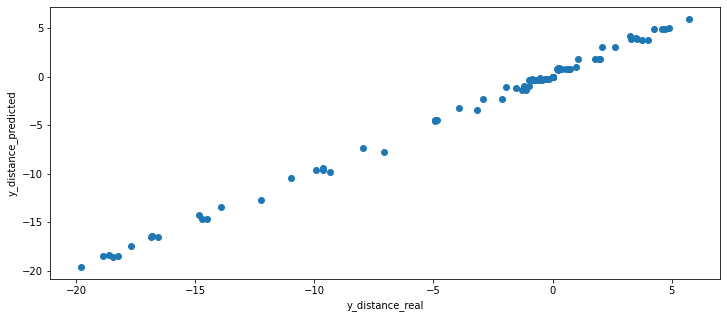

(317, 1)
(317, 1)


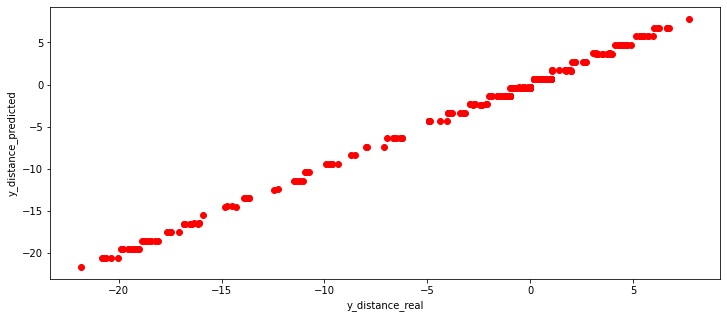

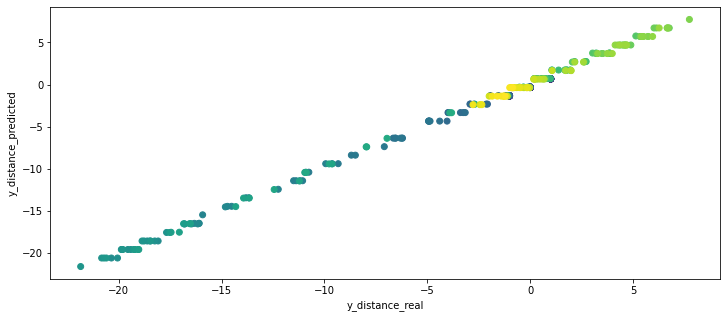

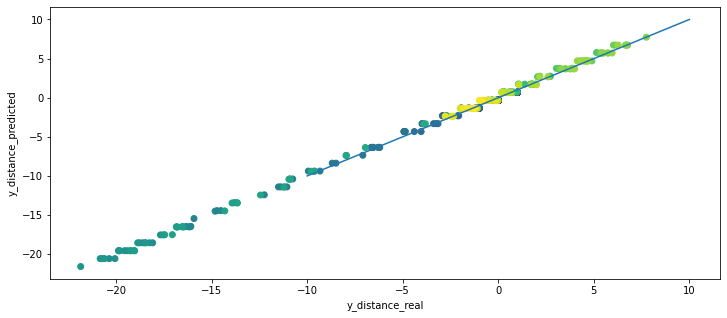

 --- plot predcition --- 
# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
142.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor from left wall =  52
Sensor from right wall =  50
most távolsagra van a felső faltól =  51.506760838506125
most távolsagra van az alsó faltól =  48.49323916149386
cccccccccccccccccccccccc

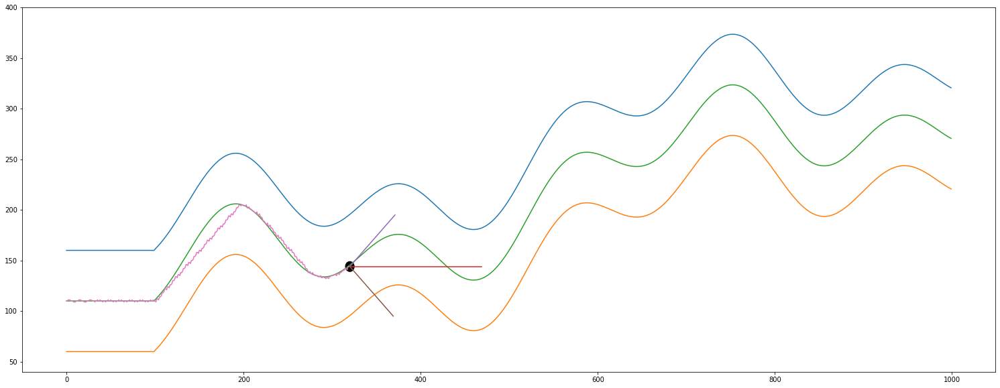

 --- plot --- 
------------------------------ IF i % 3 == 2 ------------------------------
# i =  320
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> down second
Sensor from left wall =  53
Sensor from right wall =  49
most távolsagra van a felső faltól =  52.5573567632774
most távolsagra van az alsó faltól =  47.4426432367226
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  320
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
self.vertical_distance_from_middle =  -2.5573567632773972
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  -2.5573567632773972
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  321
			 len(self.sensor_left)   =  321
			 len(self.sensor_center) =  321
			 len(self.sensor_

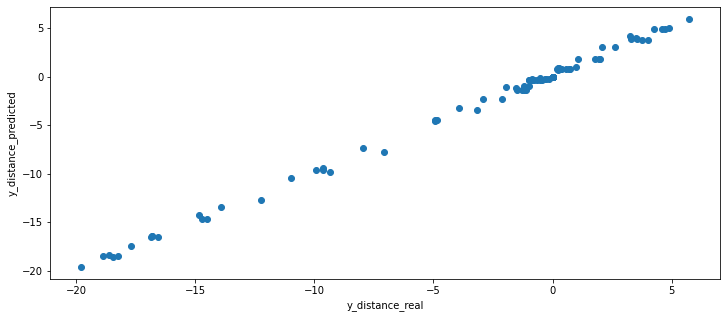

(329, 1)
(329, 1)


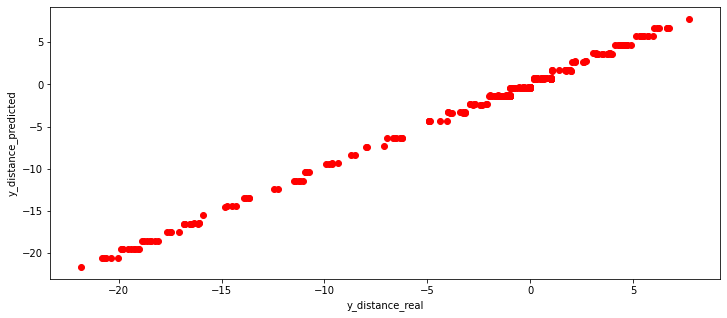

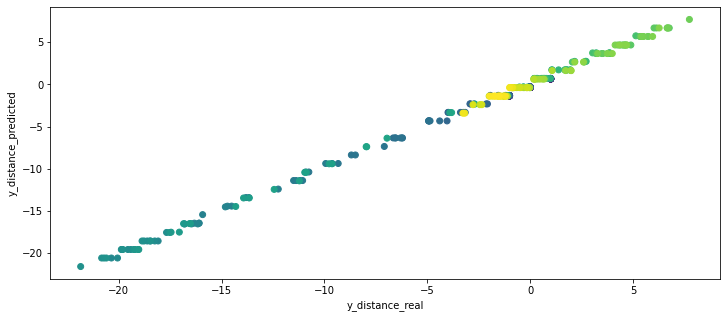

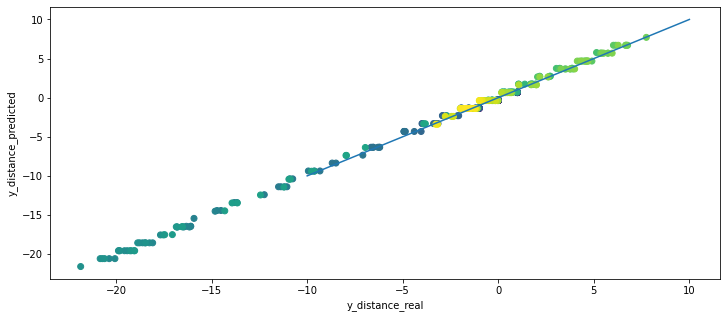

 --- plot predcition --- 
# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
150.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor from left wall =  53
Sensor from right wall =  49
most távolsagra van a felső faltól =  52.266139414233294
most távolsagra van az alsó faltól =  47.733860585766706
ccccccccccccccccccccccc

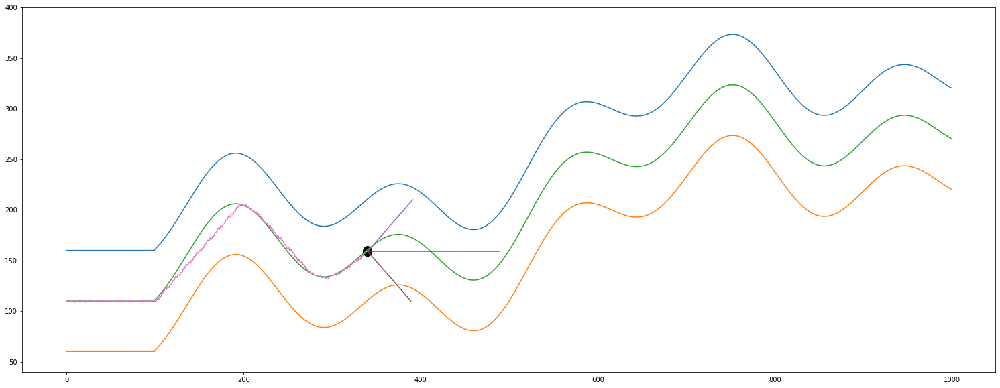

 --- plot --- 
------------------------------ IF i % 3 == 1 ------------------------------
# i =  340
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X_test =  [[ 52 150  50]]
actual predicted =  [[-1.39363066]]
actual self.y_distance[-1] =  -1.7296584319062447
len(self.y_distance_real)      =  107
len(self.y_distance_predicted) =  107


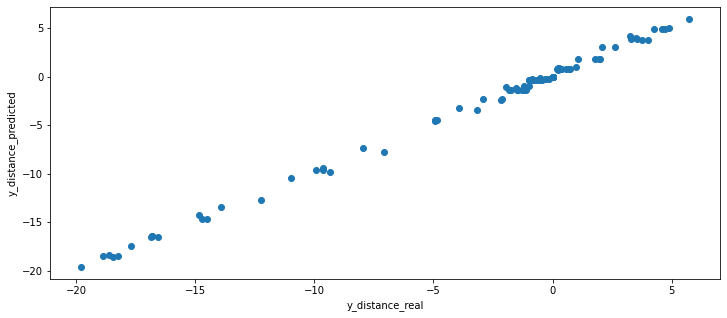

(341, 1)
(341, 1)


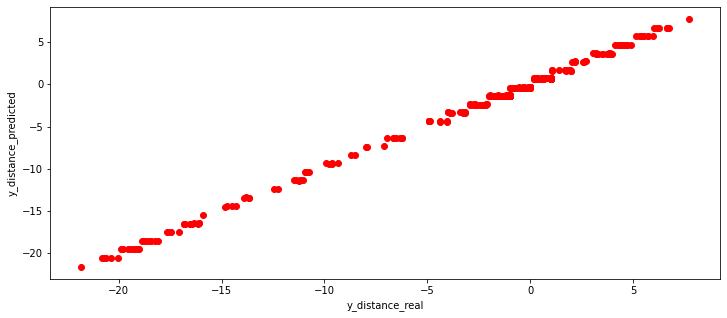

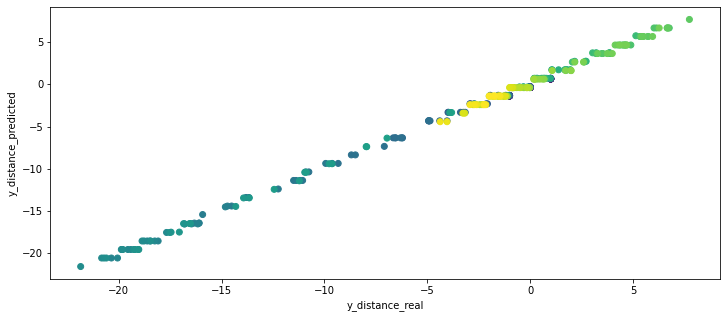

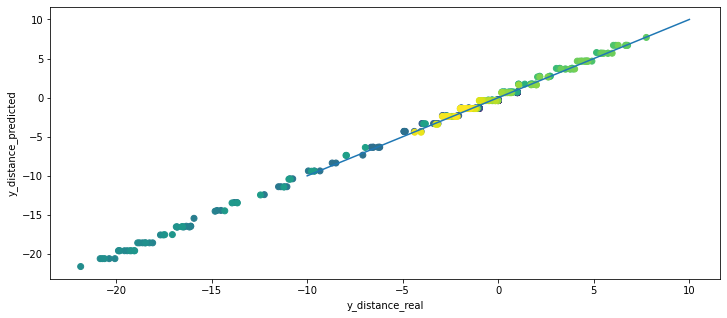

 --- plot predcition --- 
# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
159.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor from left wall =  53
Sensor from right wall =  49
most távolsagra van a felső faltól =  52.46986732330754
most távolsagra van az alsó faltól =  47.53013267669246
ccccccccccccccccccccccccc

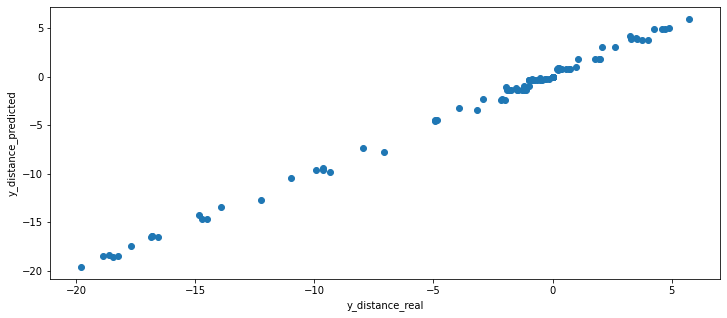

(353, 1)
(353, 1)


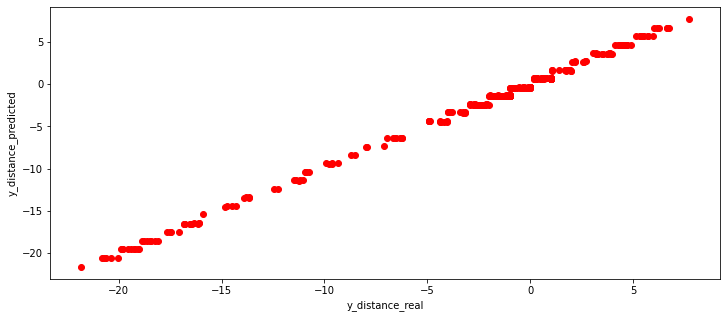

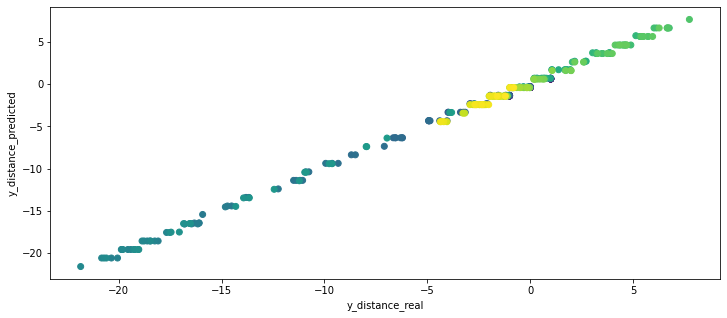

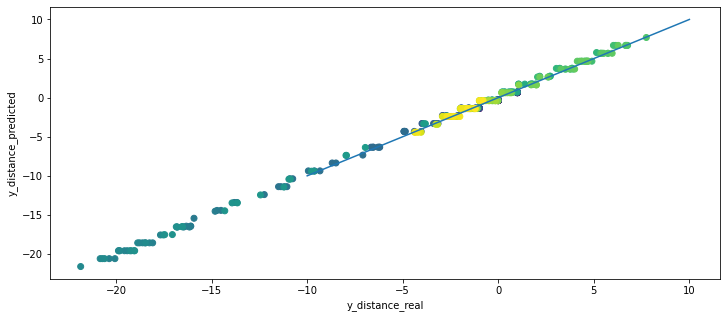

 --- plot predcition --- 
# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
168.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor from left wall =  52
Sensor from right wall =  50
most távolsagra van a felső faltól =  51.36490927968126
most távolsagra van az alsó faltól =  48.63509072031874
ccccccccccccccccccccccccc

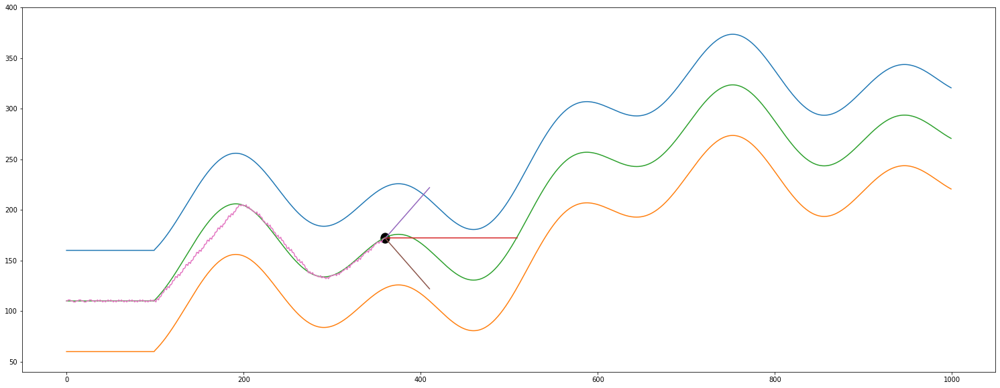

 --- plot --- 
------------------------------ IF i % 3 == 0 ------------------------------
# i =  360
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (361, 3)
y.shape =  (361, 1)
i       =  360
------------------------------ IF len(self.before) > 9 ------------------------------


# i =  360
  Ha már van elég before after adatunk
# 3. Tanulás itt kerül kiszámításra a lineáris regresszió minden egyes metrikára
# Linear Regression Learning --------------------------------------------------------------------------------------
		 # Linear Regression Training Results -------------------------------------------------------------------------
		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_left.coef_ =  [[ 1. -1.]]
		 regression_left.intercept_ =  [-2.13162821e-14]
		 ------------------------------- valyon mennyire jó ennek a met

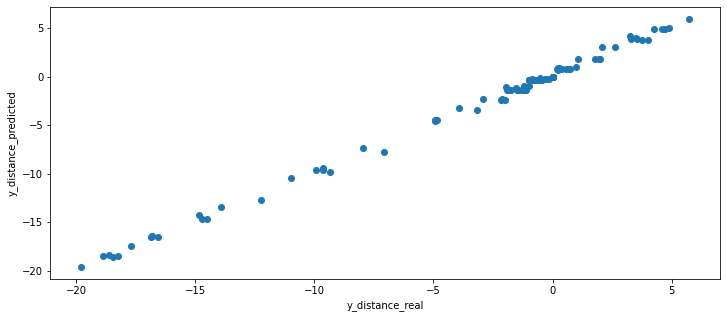

(365, 1)
(365, 1)


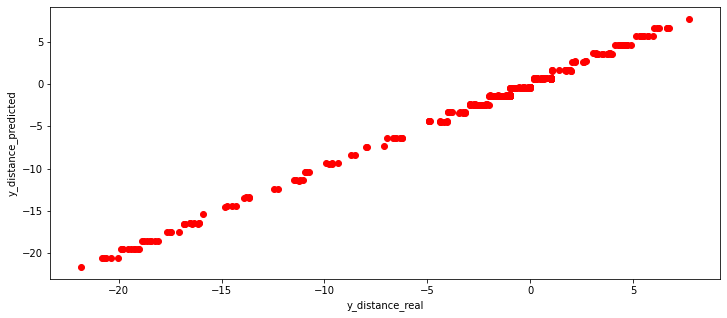

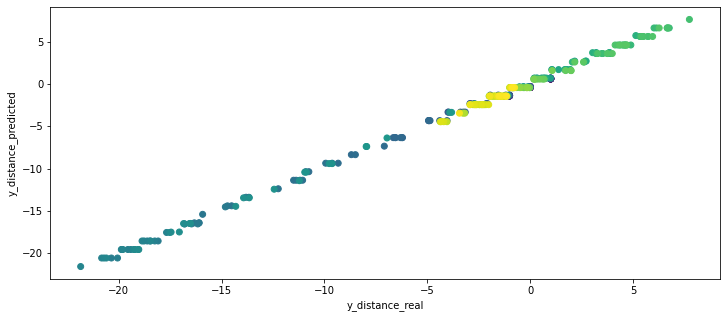

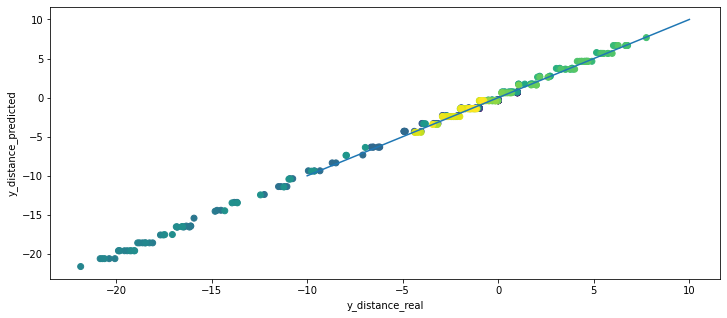

 --- plot predcition --- 
# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
173.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor from left wall =  52
Sensor from right wall =  50
most távolsagra van a felső faltól =  51.46045461835135
most távolsagra van az alsó faltól =  48.53954538164865
ccccccccccccccccccccccccc

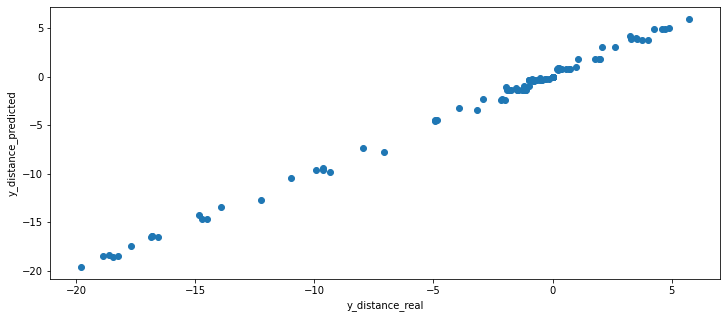

(377, 1)
(377, 1)


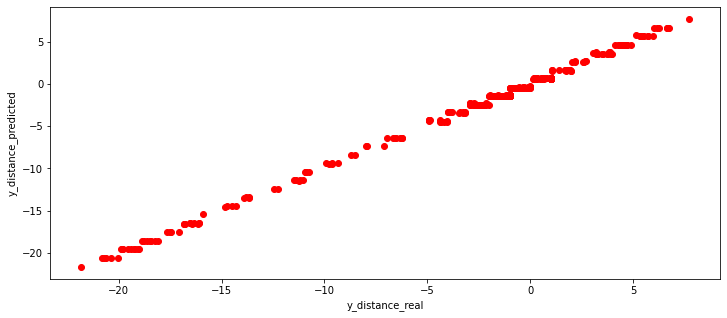

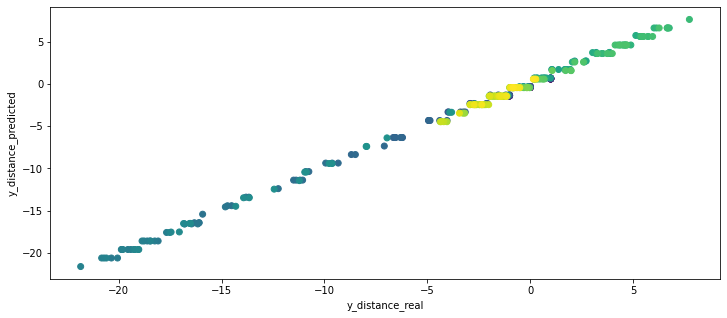

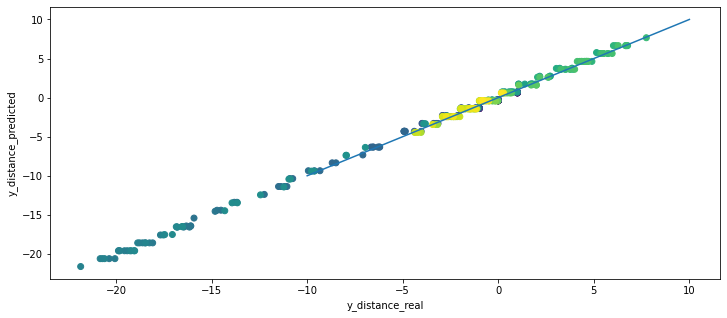

 --- plot predcition --- 
# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
175.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor from left wall =  51
Sensor from right wall =  51
most távolsagra van a felső faltól =  50.776283555498765
most távolsagra van az alsó faltól =  49.223716444501235
ccccccccccccccccccccccc

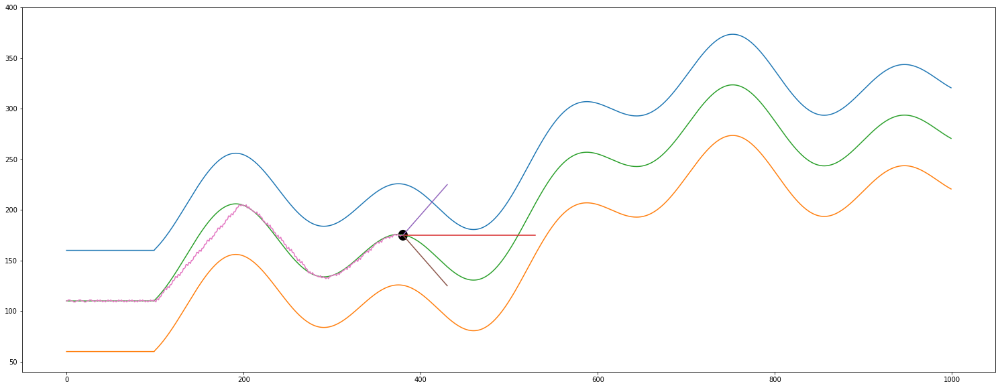

 --- plot --- 
------------------------------ IF i % 3 == 2 ------------------------------
# i =  380
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> down second
Sensor from left wall =  52
Sensor from right wall =  50
most távolsagra van a felső faltól =  51.46292259886536
most távolsagra van az alsó faltól =  48.53707740113464
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  380
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
self.vertical_distance_from_middle =  -1.4629225988653616
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  -1.4629225988653616
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  381
			 len(self.sensor_left)   =  381
			 len(self.sensor_center) =  381
			 len(self.senso

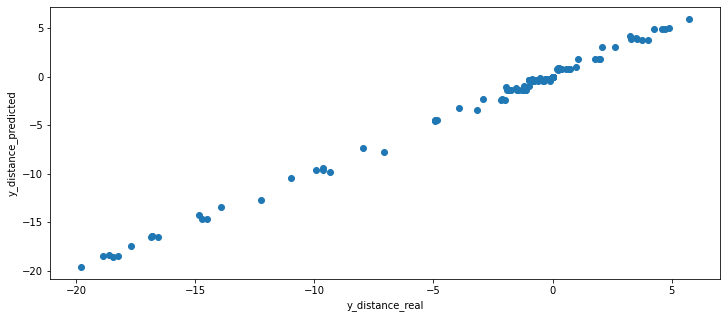

(389, 1)
(389, 1)


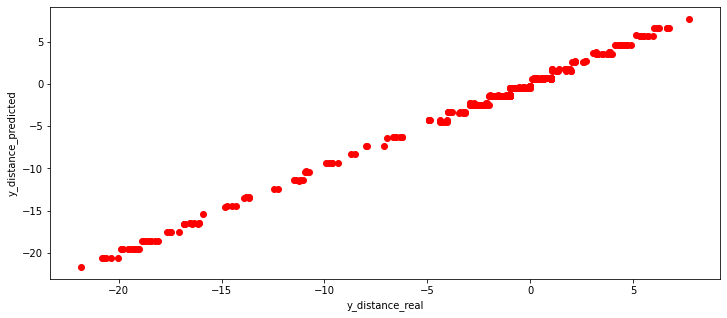

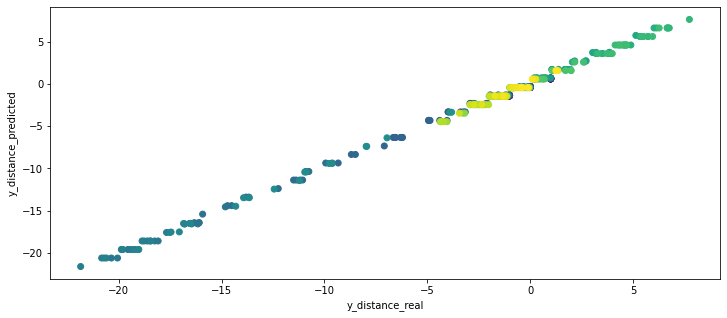

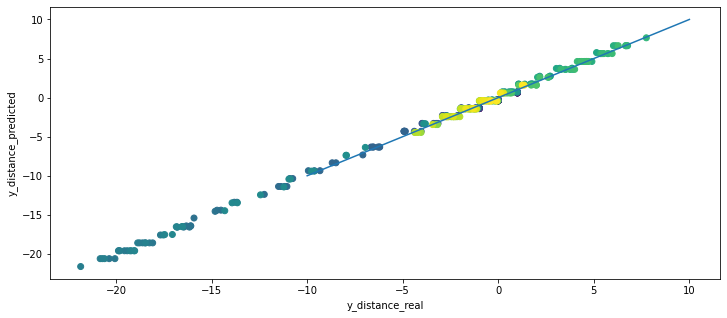

 --- plot predcition --- 
# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
173.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor from left wall =  51
Sensor from right wall =  51
most távolsagra van a felső faltól =  50.0090527157557
most távolsagra van az alsó faltól =  49.9909472842443
ccccccccccccccccccccccccccc

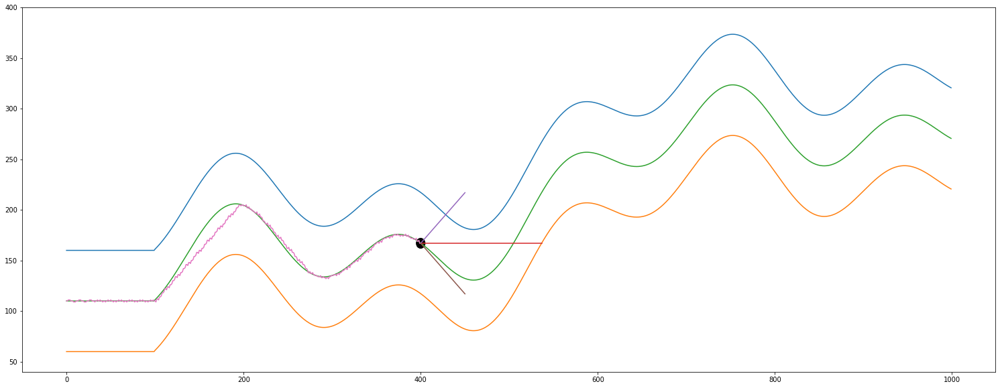

 --- plot --- 
------------------------------ IF i % 3 == 1 ------------------------------
# i =  400
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X_test =  [[ 51 138  51]]
actual predicted =  [[-0.40994672]]
actual self.y_distance[-1] =  -0.2413972639751023
len(self.y_distance_real)      =  127
len(self.y_distance_predicted) =  127


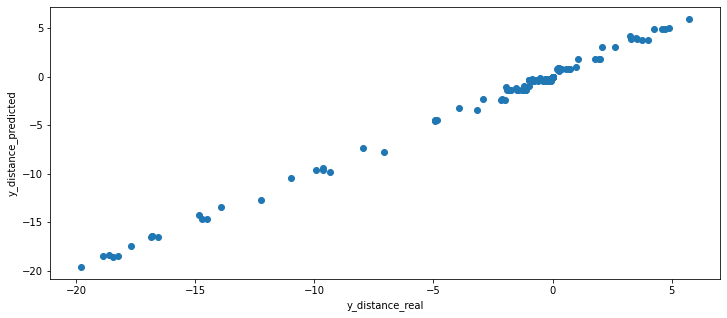

(401, 1)
(401, 1)


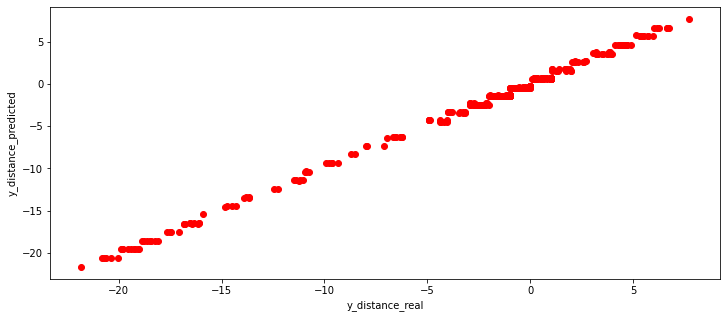

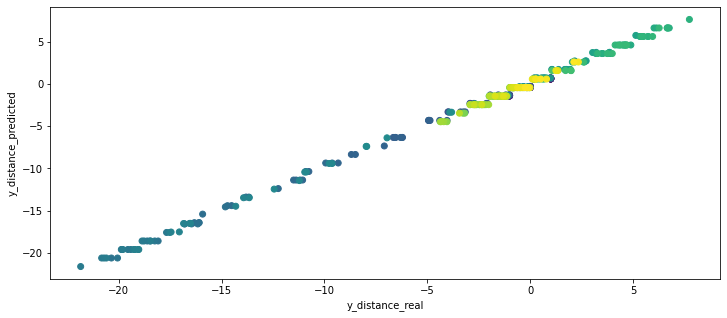

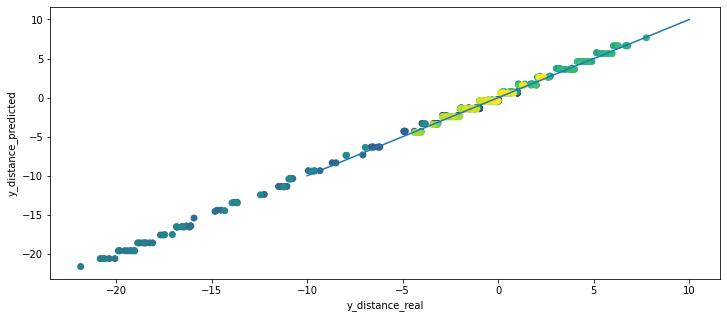

 --- plot predcition --- 
# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
167.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  137
Sensor from left wall =  50
Sensor from right wall =  52
most távolsagra van a felső faltól =  49.59004987479568
most távolsagra van az alsó faltól =  50.40995012520432
cccc

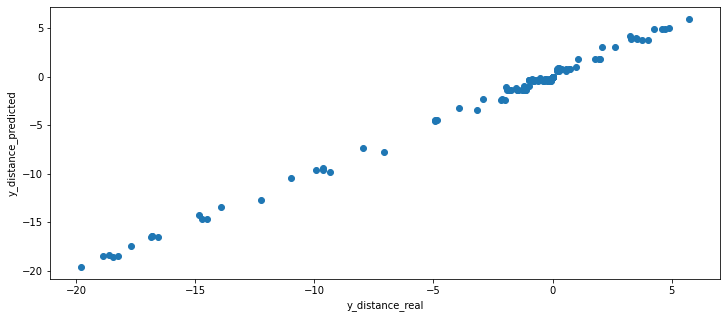

(413, 1)
(413, 1)


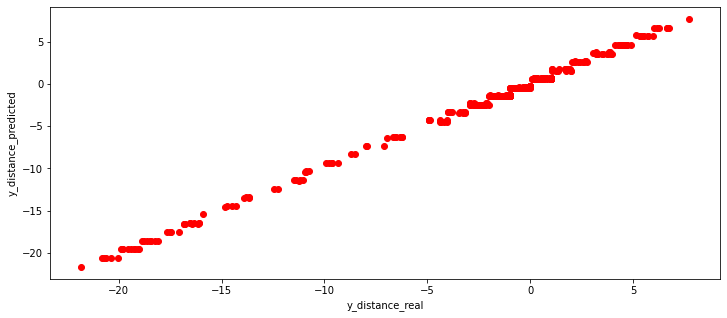

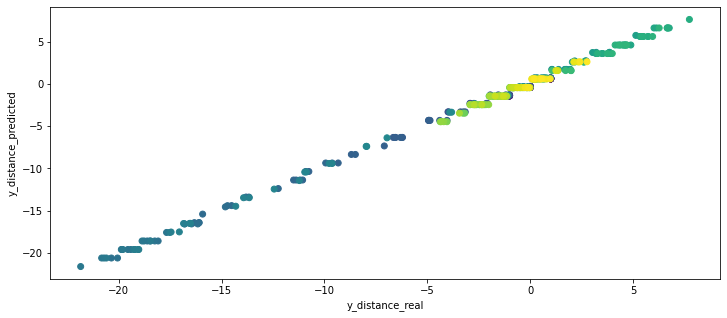

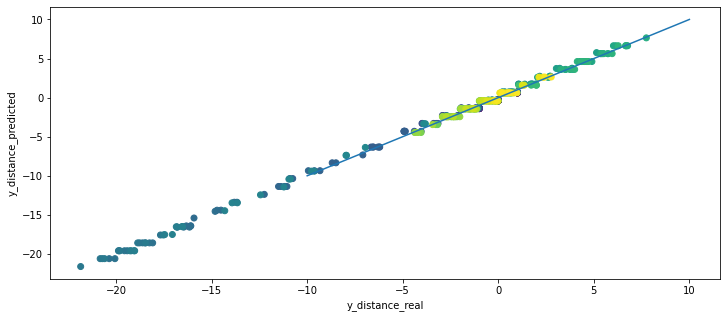

 --- plot predcition --- 
# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
159.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  119
Sensor from left wall =  49
Sensor from right wall =  53
most távolsagra van a felső faltól =  48.62513316467982
most távolsagra van az alsó faltól =  51.37486683532018
cccc

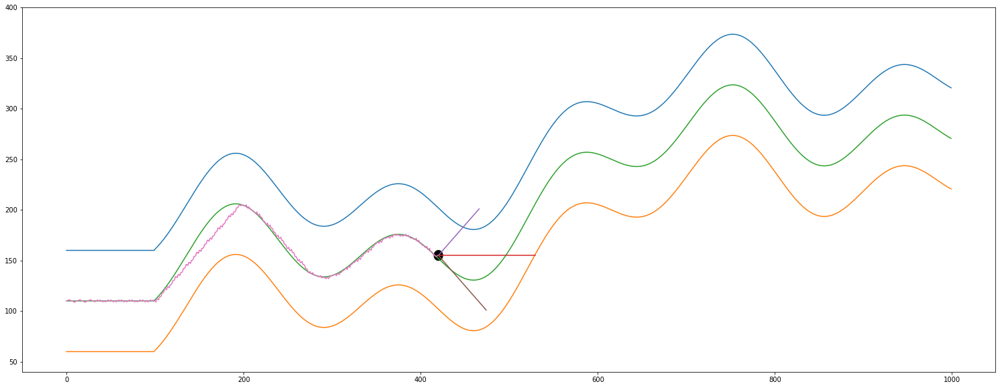

 --- plot --- 
------------------------------ IF i % 3 == 0 ------------------------------
# i =  420
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (421, 3)
y.shape =  (421, 1)
i       =  420
------------------------------ IF len(self.before) > 9 ------------------------------


# i =  420
  Ha már van elég before after adatunk
# 3. Tanulás itt kerül kiszámításra a lineáris regresszió minden egyes metrikára
# Linear Regression Learning --------------------------------------------------------------------------------------
		 # Linear Regression Training Results -------------------------------------------------------------------------
		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_left.coef_ =  [[ 1. -1.]]
		 regression_left.intercept_ =  [-1.42108547e-14]
		 ------------------------------- valyon mennyire jó ennek a met

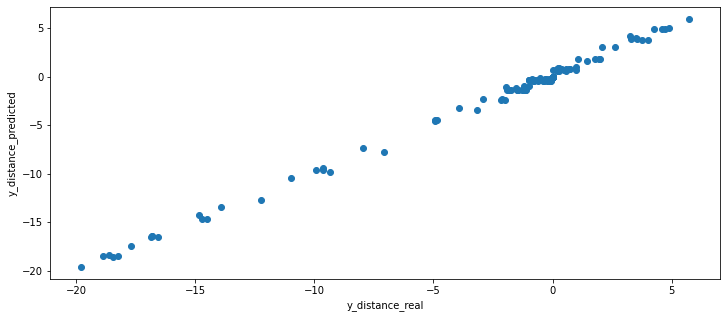

(425, 1)
(425, 1)


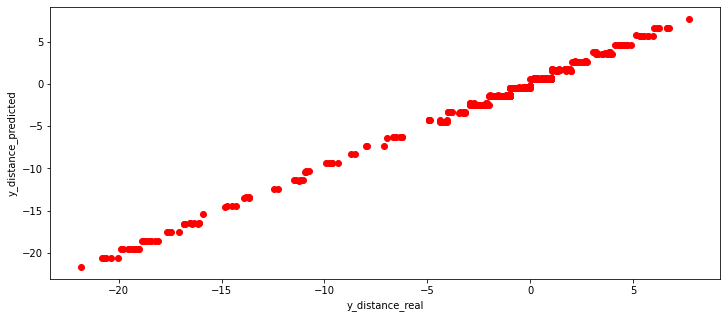

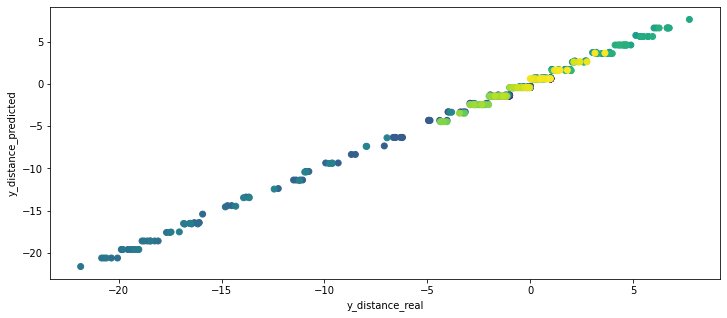

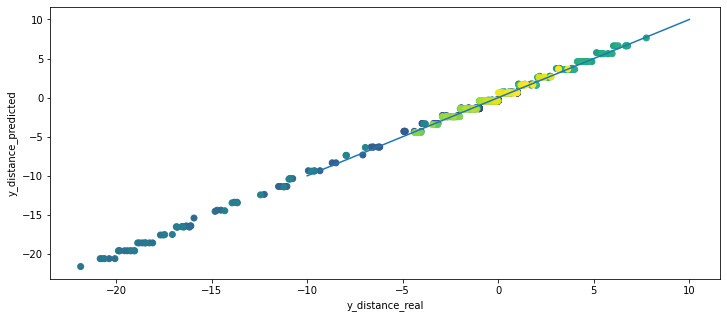

 --- plot predcition --- 
# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
150.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  102
Sensor from left wall =  48
Sensor from right wall =  54
most távolsagra van a felső faltól =  47.72620406542933
most távolsagra van az alsó faltól =  52.273795934570686
ccc

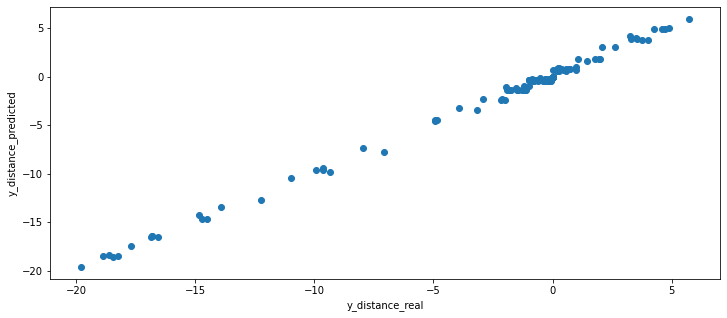

(437, 1)
(437, 1)


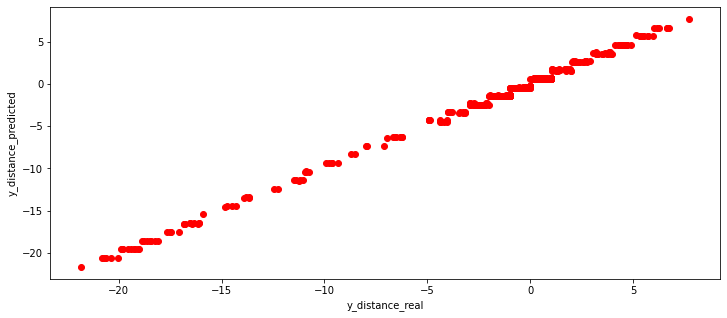

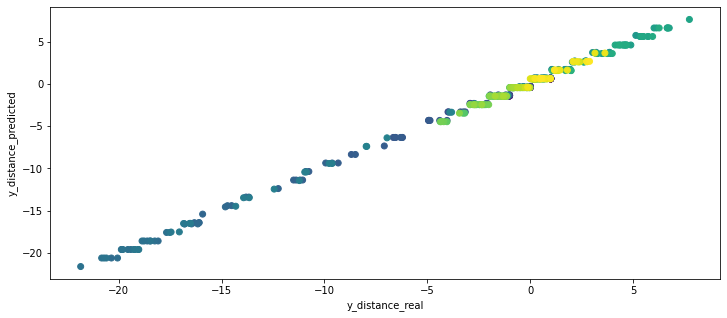

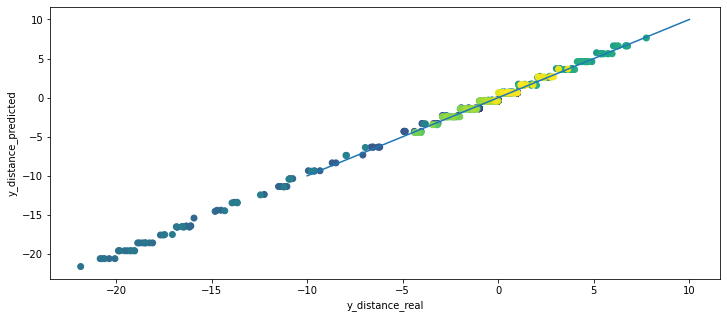

 --- plot predcition --- 
# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
140.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  84
Sensor from left wall =  49
Sensor from right wall =  53
most távolsagra van a felső faltól =  48.760723847278115
most távolsagra van az alsó faltól =  51.239276152721885
ccc

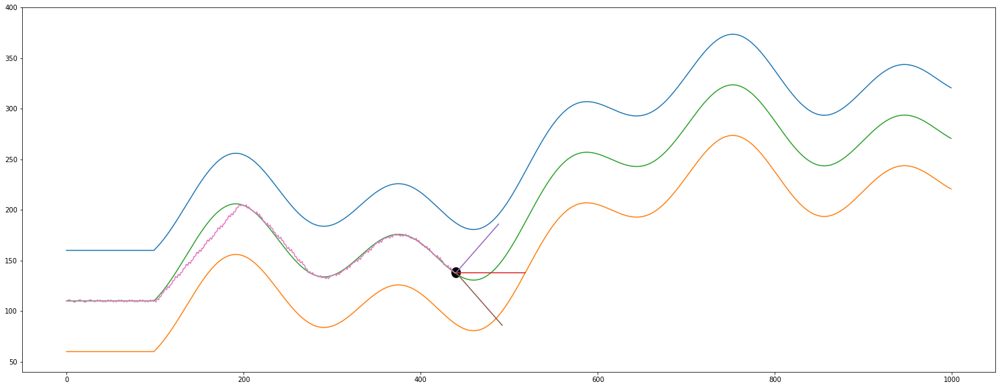

 --- plot --- 
------------------------------ IF i % 3 == 2 ------------------------------
# i =  440
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> down second
Sensor center =  79
Sensor from left wall =  50
Sensor from right wall =  52
most távolsagra van a felső faltól =  49.88475363854815
most távolsagra van az alsó faltól =  50.11524636145187
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  440
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
self.vertical_distance_from_middle =  0.11524636145185241
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  0.11524636145185241
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  441
			 len(self.sensor_left)   =  441
			 len(self.sensor_center) =  44

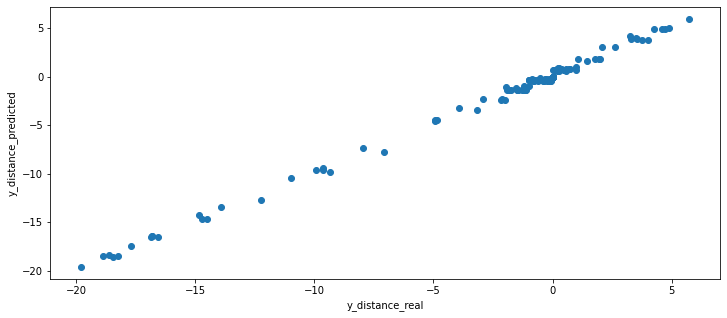

(449, 1)
(449, 1)


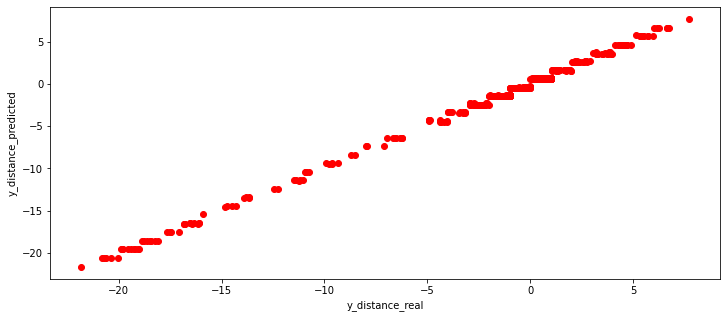

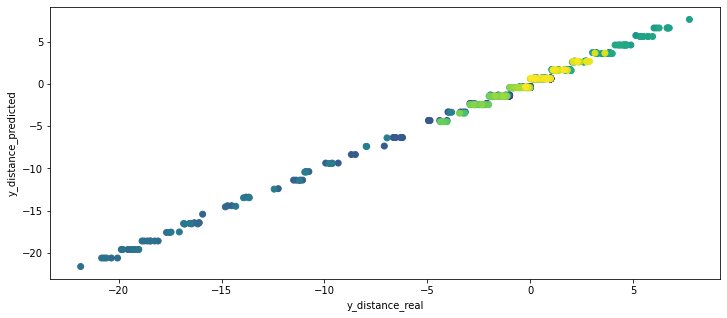

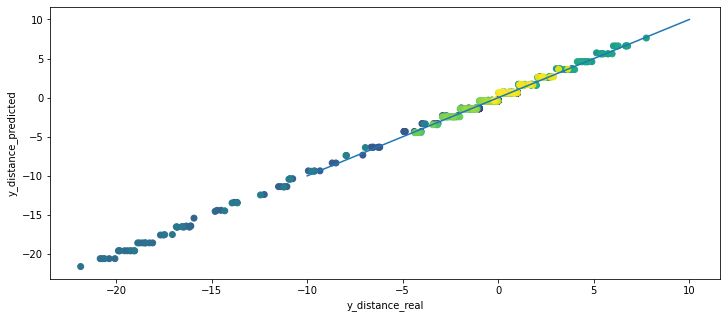

 --- plot predcition --- 
# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
133.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  67
Sensor from left wall =  50
Sensor from right wall =  52
most távolsagra van a felső faltól =  49.558759851533296
most távolsagra van az alsó faltól =  50.44124014846669
cccc

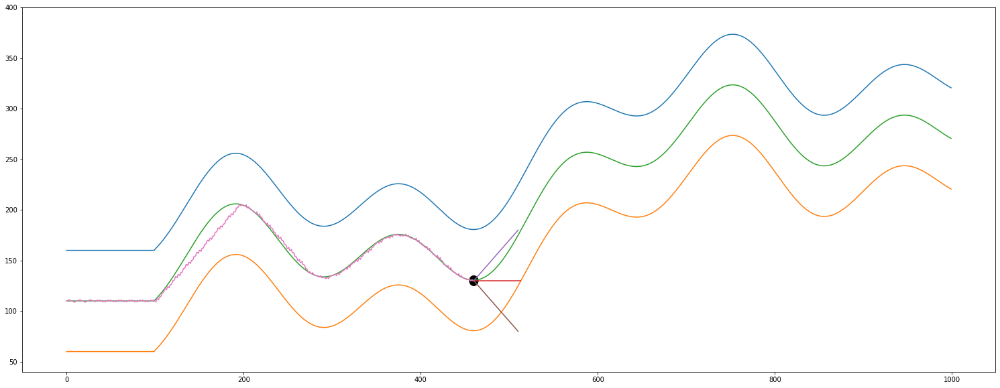

 --- plot --- 
------------------------------ IF i % 3 == 1 ------------------------------
# i =  460
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X_test =  [[51 54 51]]
actual predicted =  [[-0.34029414]]
actual self.y_distance[-1] =  -0.5947253230052638
len(self.y_distance_real)      =  147
len(self.y_distance_predicted) =  147


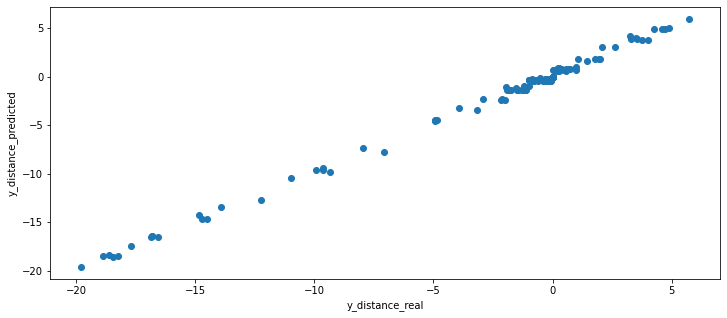

(461, 1)
(461, 1)


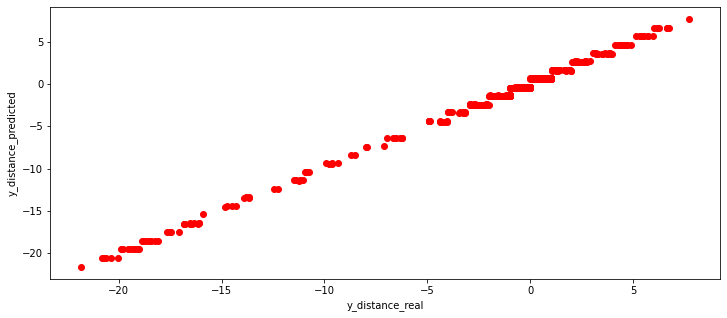

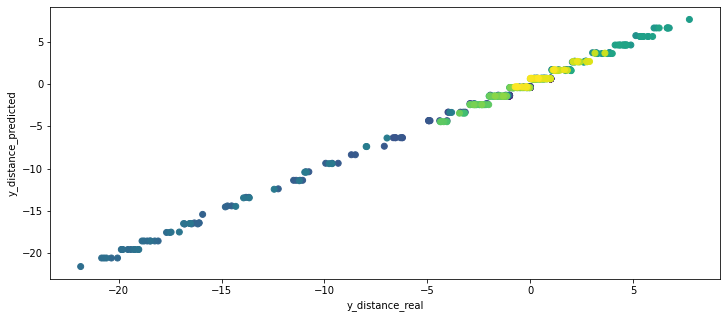

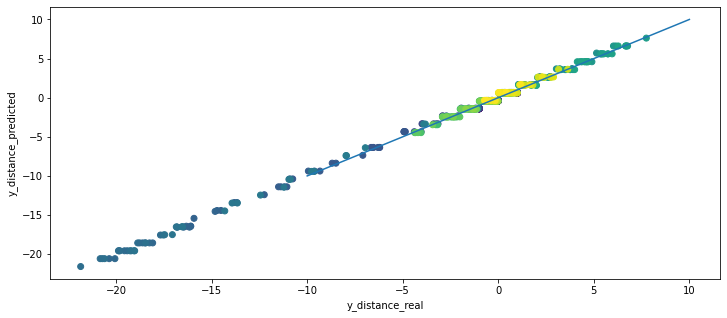

 --- plot predcition --- 
# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
130.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  53
Sensor from left wall =  51
Sensor from right wall =  51
most távolsagra van a felső faltól =  50.62379169316216
most távolsagra van az alsó faltól =  49.37620830683784
ccccc

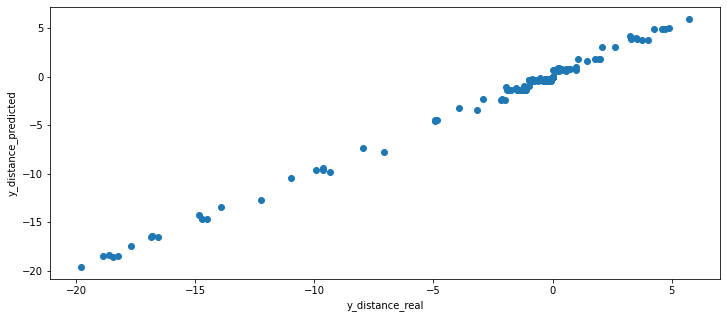

(473, 1)
(473, 1)


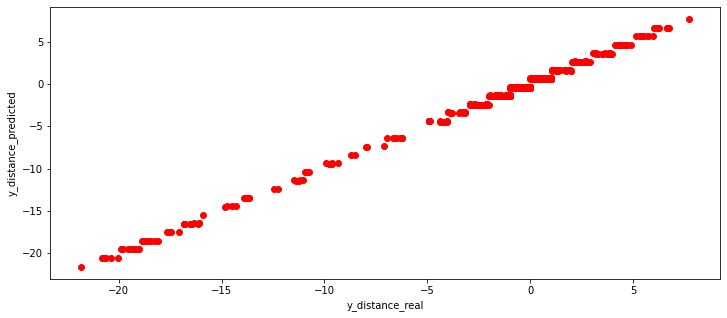

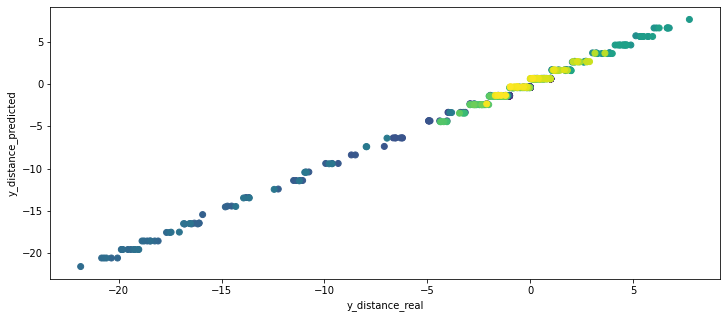

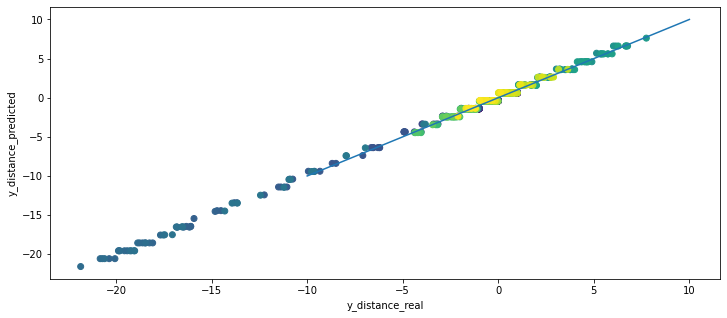

 --- plot predcition --- 
# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
132.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  43
Sensor from left wall =  52
Sensor from right wall =  50
most távolsagra van a felső faltól =  51.89295276488667
most távolsagra van az alsó faltól =  48.10704723511333
ccccc

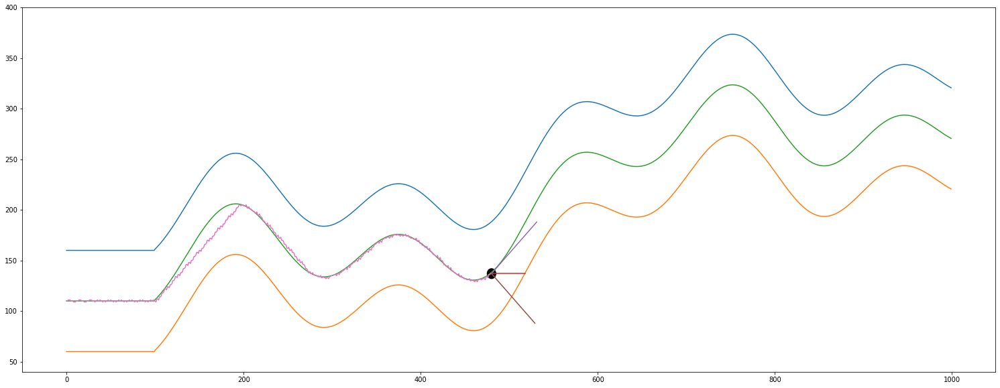

 --- plot --- 
------------------------------ IF i % 3 == 0 ------------------------------
# i =  480
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (481, 3)
y.shape =  (481, 1)
i       =  480
------------------------------ IF len(self.before) > 9 ------------------------------


# i =  480
  Ha már van elég before after adatunk
# 3. Tanulás itt kerül kiszámításra a lineáris regresszió minden egyes metrikára
# Linear Regression Learning --------------------------------------------------------------------------------------
		 # Linear Regression Training Results -------------------------------------------------------------------------
		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_left.coef_ =  [[ 1. -1.]]
		 regression_left.intercept_ =  [-4.97379915e-14]
		 ------------------------------- valyon mennyire jó ennek a met

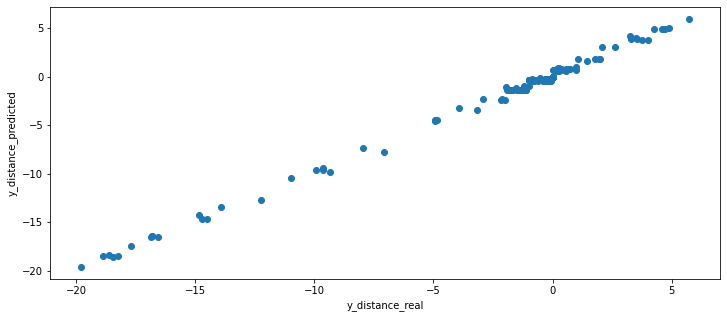

(485, 1)
(485, 1)


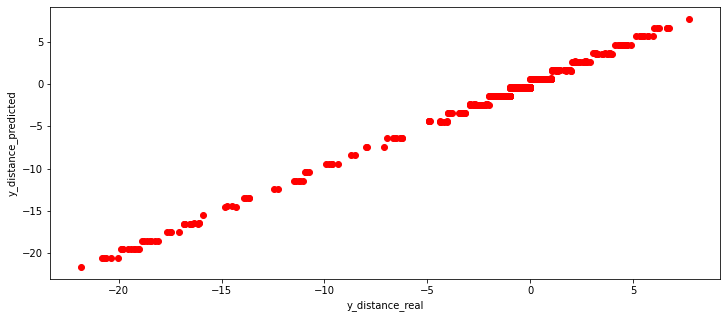

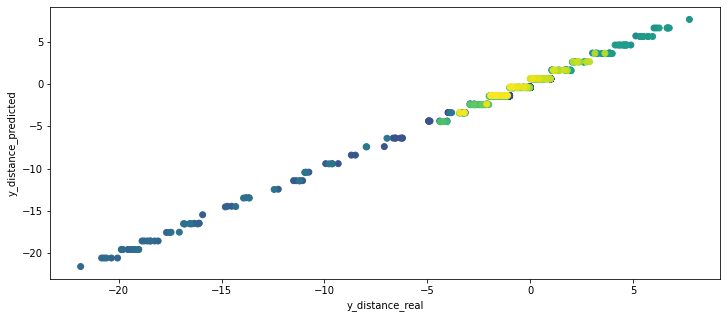

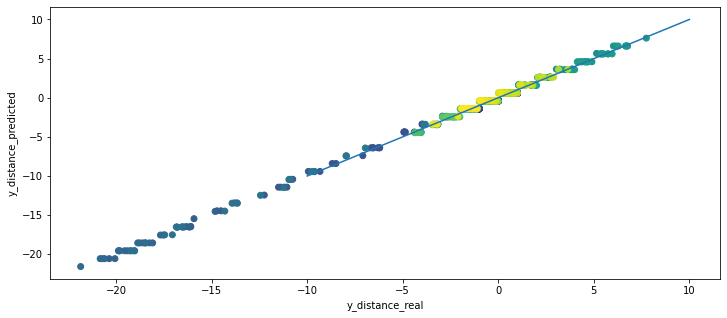

 --- plot predcition --- 
# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
140.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  36
Sensor from left wall =  53
Sensor from right wall =  49
most távolsagra van a felső faltól =  52.58461620173719
most távolsagra van az alsó faltól =  47.41538379826281
ccccc

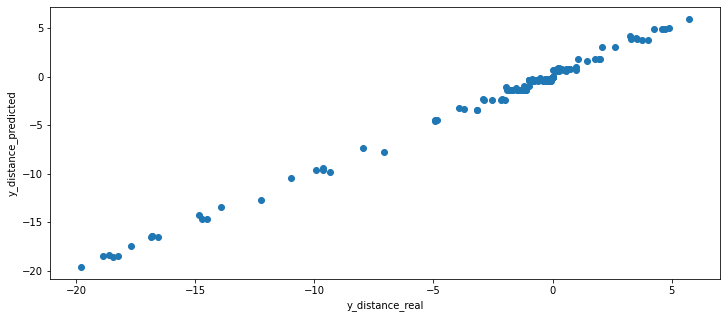

(497, 1)
(497, 1)


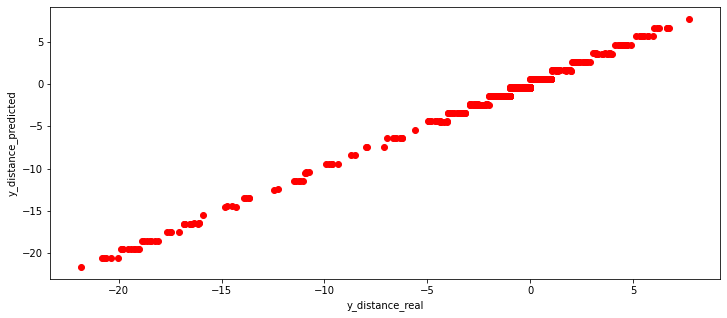

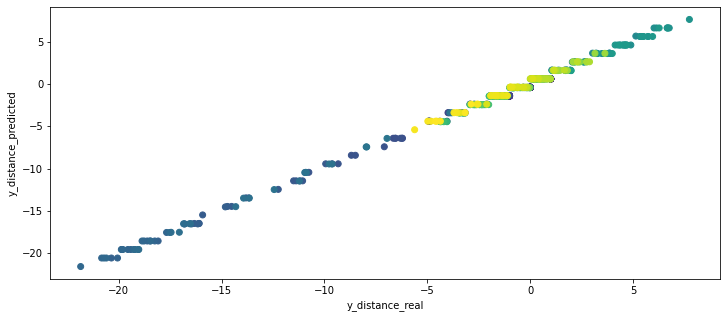

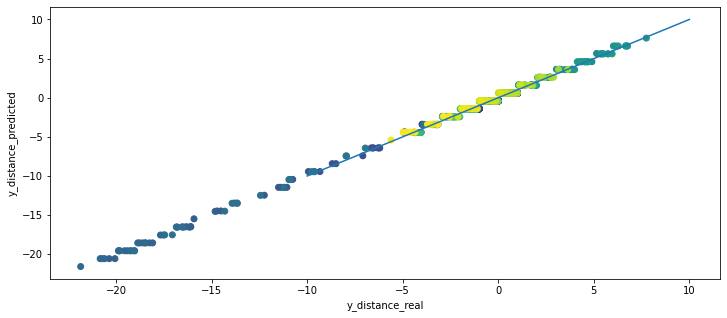

 --- plot predcition --- 
# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
152.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  31
Sensor from left wall =  55
Sensor from right wall =  47
most távolsagra van a felső faltól =  54.15748215479553
most távolsagra van az alsó faltól =  45.84251784520447
ccccc

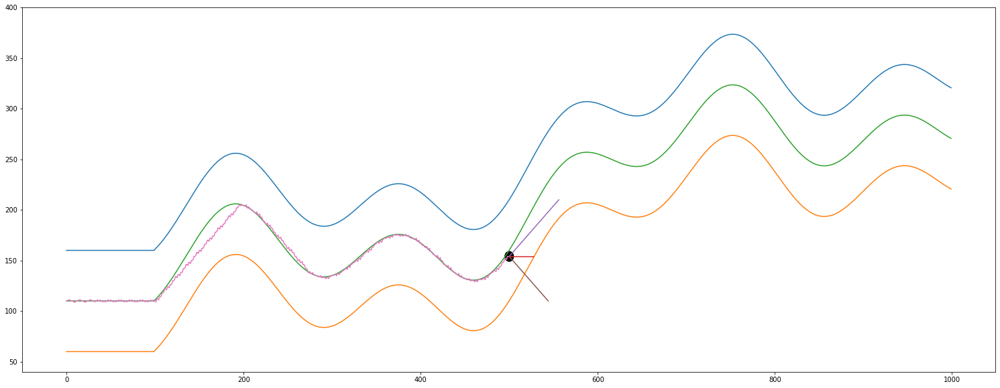

 --- plot --- 
------------------------------ IF i % 3 == 2 ------------------------------
# i =  500
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> down second
Sensor center =  29
Sensor from left wall =  58
Sensor from right wall =  44
most távolsagra van a felső faltól =  57.1827339375173
most távolsagra van az alsó faltól =  42.8172660624827
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  500
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
self.vertical_distance_from_middle =  -7.182733937517298
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  -7.182733937517298
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  501
			 len(self.sensor_left)   =  501
			 len(self.sensor_center) =  501
		

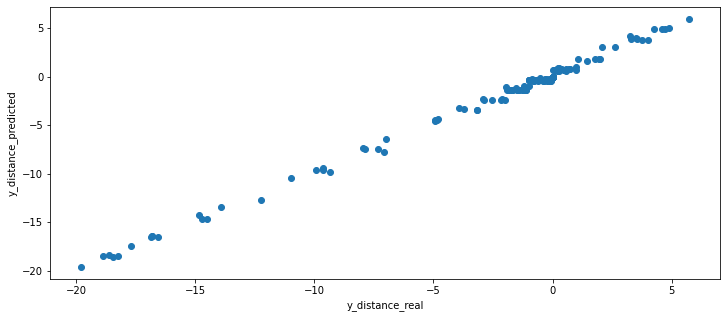

(509, 1)
(509, 1)


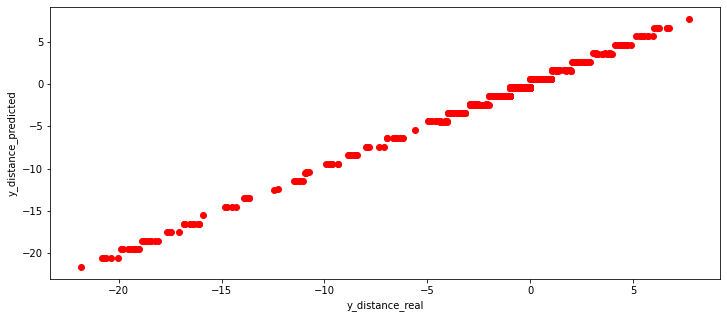

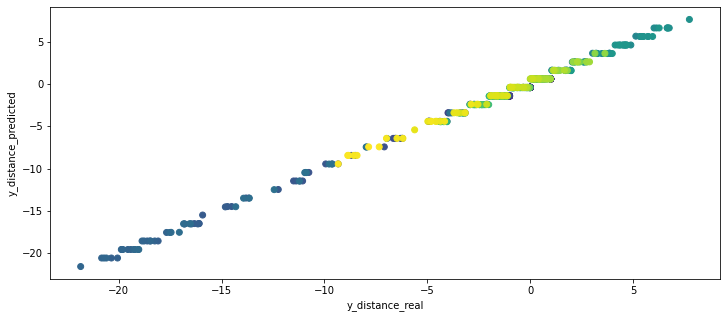

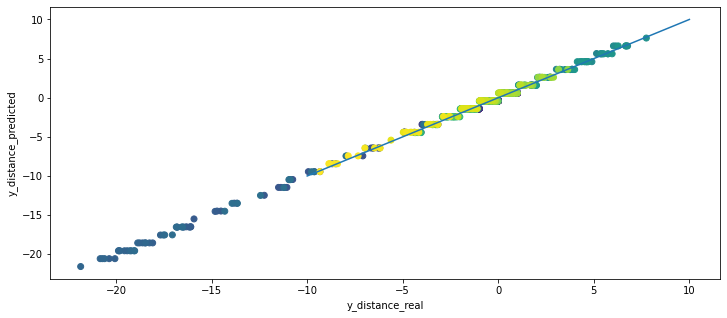

 --- plot predcition --- 
# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
164.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  27
Sensor from left wall =  60
Sensor from right wall =  42
most távolsagra van a felső faltól =  59.38775534243672
most távolsagra van az alsó faltól =  40.61224465756328
ccccc

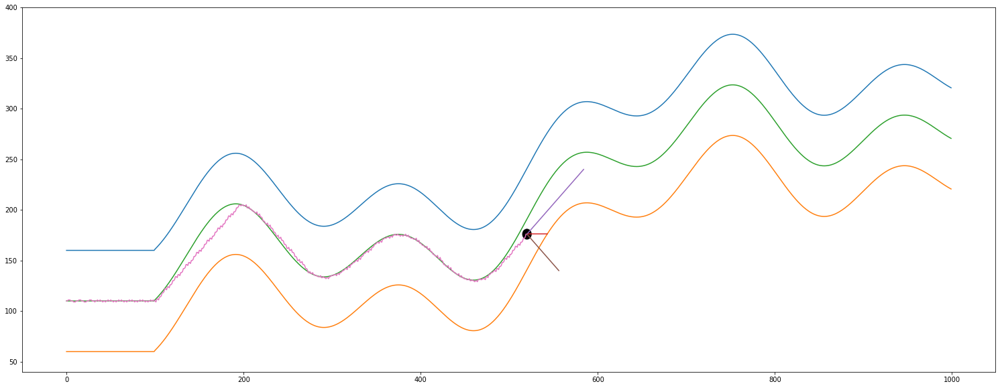

 --- plot --- 
------------------------------ IF i % 3 == 1 ------------------------------
# i =  520
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X_test =  [[65 24 37]]
actual predicted =  [[-14.48097626]]
actual self.y_distance[-1] =  -14.9288795112586
len(self.y_distance_real)      =  167
len(self.y_distance_predicted) =  167


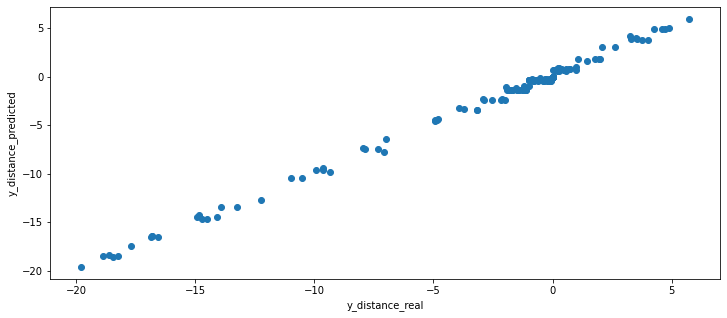

(521, 1)
(521, 1)


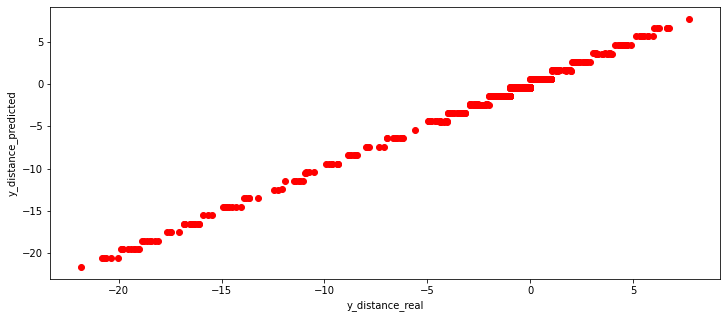

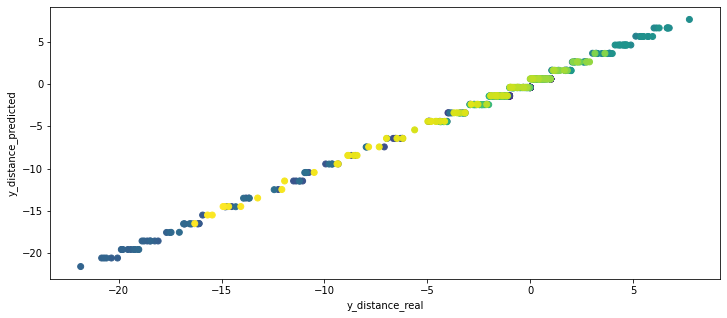

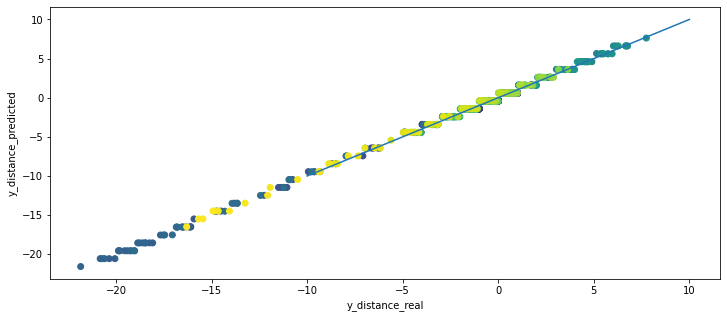

 --- plot predcition --- 
# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
176.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  23
Sensor from left wall =  67
Sensor from right wall =  35
most távolsagra van a felső faltól =  66.55239134168505
most távolsagra van az alsó faltól =  33.44760865831495
ccccc

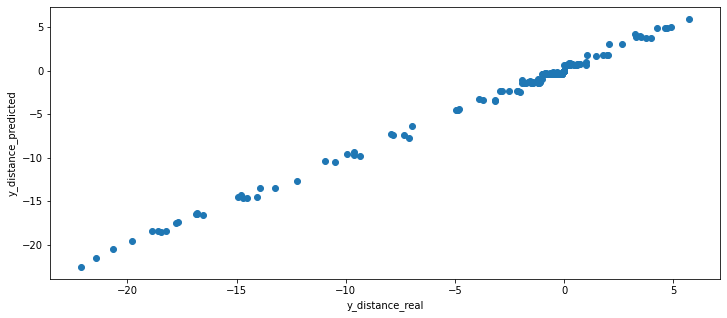

(533, 1)
(533, 1)


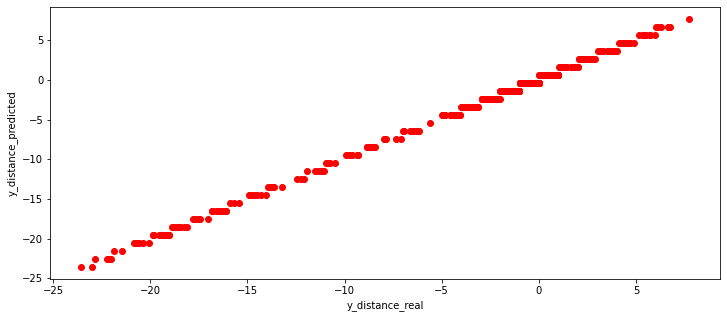

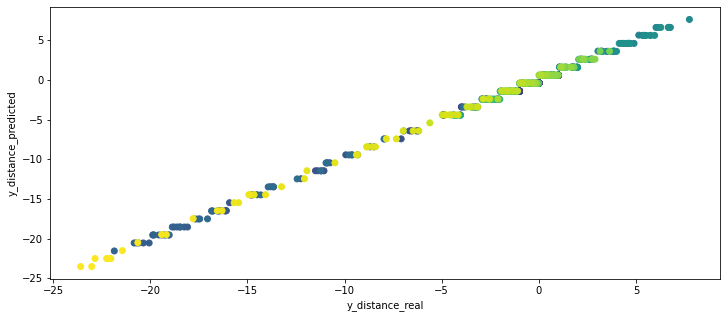

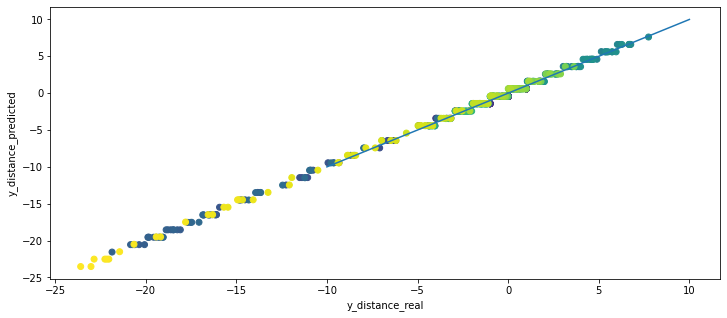

 --- plot predcition --- 
# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
188.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  21
Sensor from left wall =  74
Sensor from right wall =  28
most távolsagra van a felső faltól =  73.6896745462791
most távolsagra van az alsó faltól =  26.310325453720907
ccccc

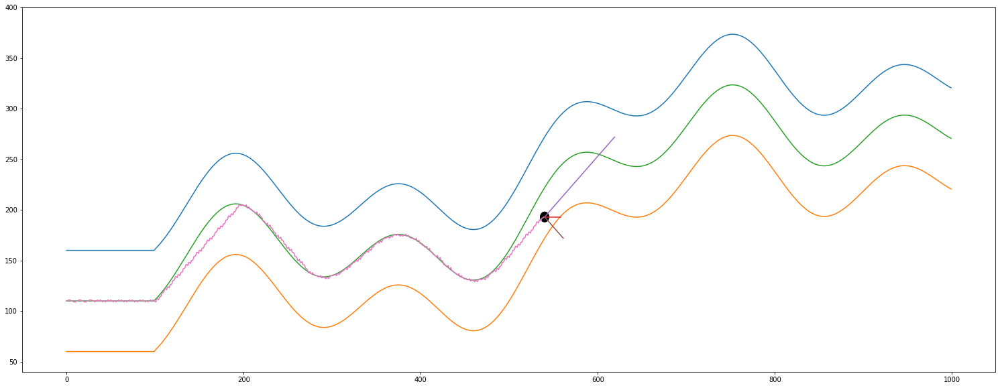

 --- plot --- 
------------------------------ IF i % 3 == 0 ------------------------------
# i =  540
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (541, 3)
y.shape =  (541, 1)
i       =  540
------------------------------ IF len(self.before) > 9 ------------------------------


# i =  540
  Ha már van elég before after adatunk
# 3. Tanulás itt kerül kiszámításra a lineáris regresszió minden egyes metrikára
# Linear Regression Learning --------------------------------------------------------------------------------------
		 # Linear Regression Training Results -------------------------------------------------------------------------
		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_left.coef_ =  [[ 1. -1.]]
		 regression_left.intercept_ =  [2.13162821e-14]
		 ------------------------------- valyon mennyire jó ennek a metr

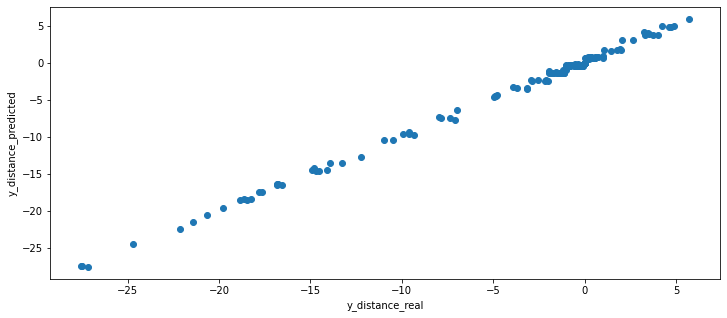

(545, 1)
(545, 1)


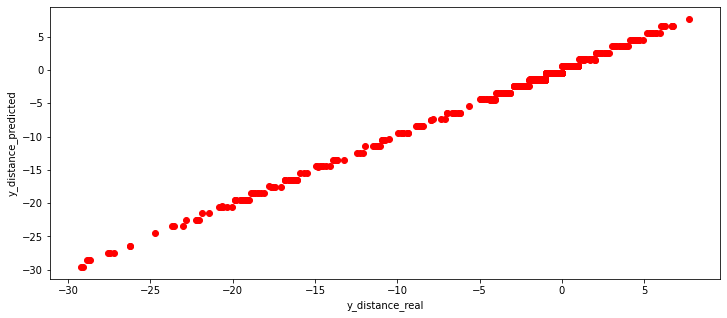

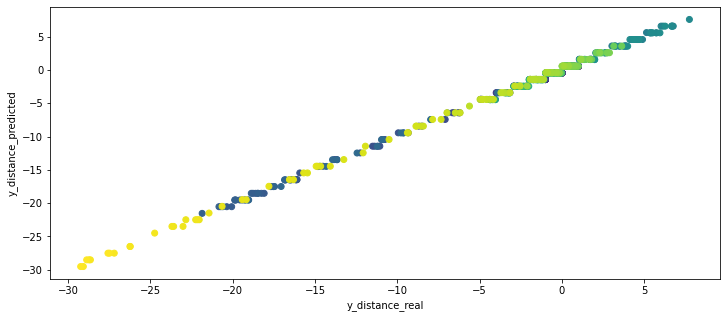

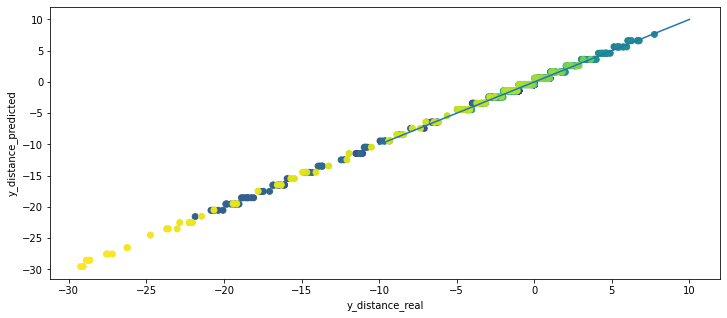

 --- plot predcition --- 
# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
200.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  23
Sensor from left wall =  79
Sensor from right wall =  23
most távolsagra van a felső faltól =  78.89620862557285
most távolsagra van az alsó faltól =  21.103791374427175
cccc

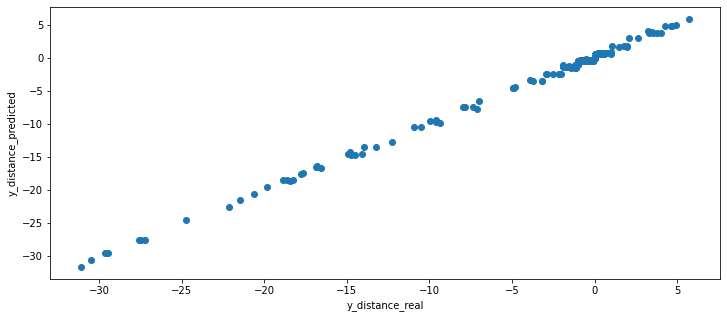

(557, 1)
(557, 1)


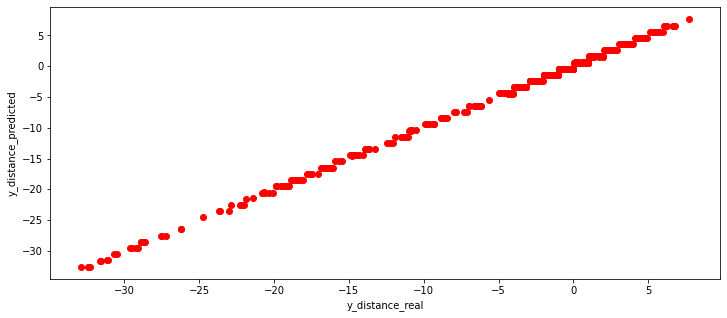

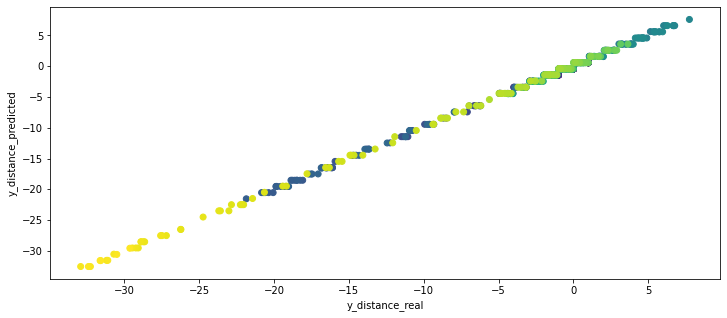

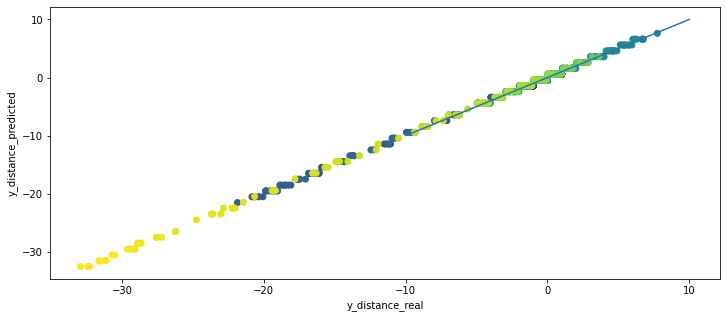

 --- plot predcition --- 
# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
212.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  126
Sensor from left wall =  81
Sensor from right wall =  21
most távolsagra van a felső faltól =  80.61367447491602
most távolsagra van az alsó faltól =  19.386325525083947
ccc

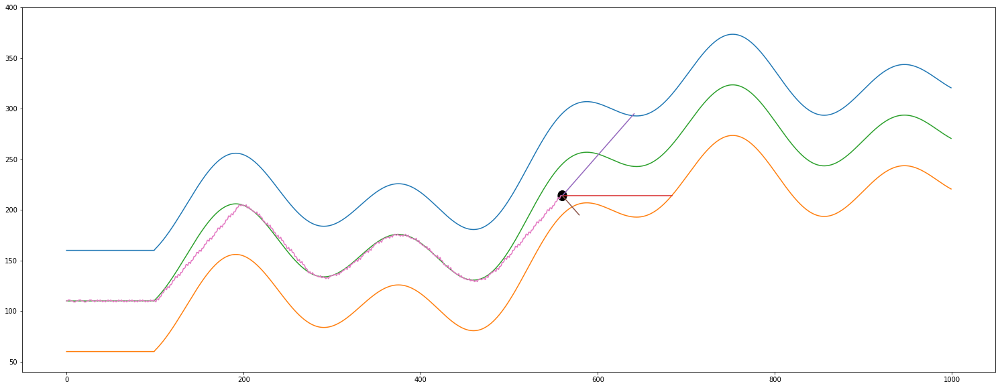

 --- plot --- 
------------------------------ IF i % 3 == 2 ------------------------------
# i =  560
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> down second
Sensor center =  124
Sensor from left wall =  83
Sensor from right wall =  19
most távolsagra van a felső faltól =  82.36770790234834
most távolsagra van az alsó faltól =  17.63229209765163
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  560
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
self.vertical_distance_from_middle =  -32.36770790234834
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  -32.36770790234834
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  561
			 len(self.sensor_left)   =  561
			 len(self.sensor_center) =  561

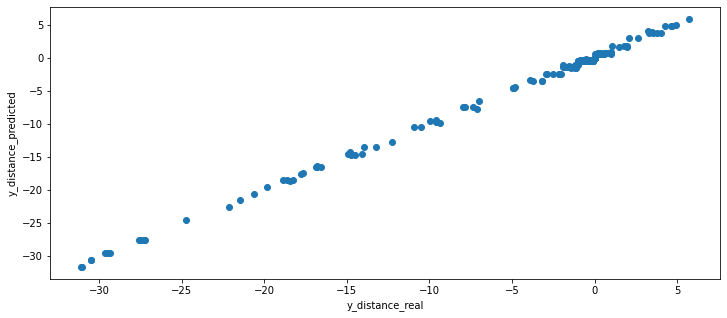

(569, 1)
(569, 1)


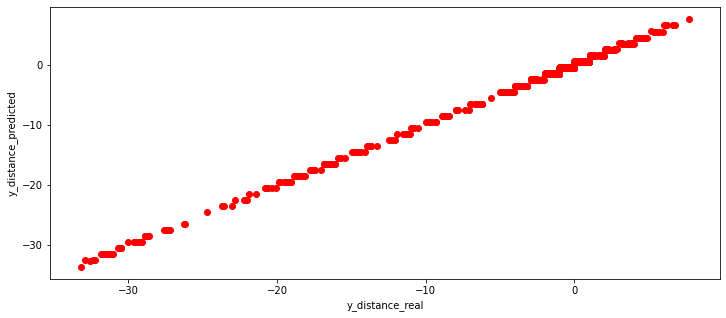

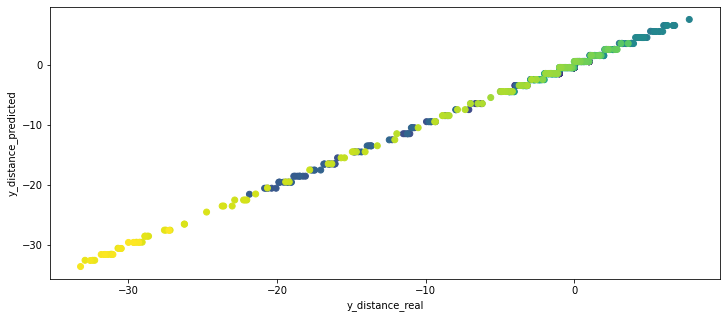

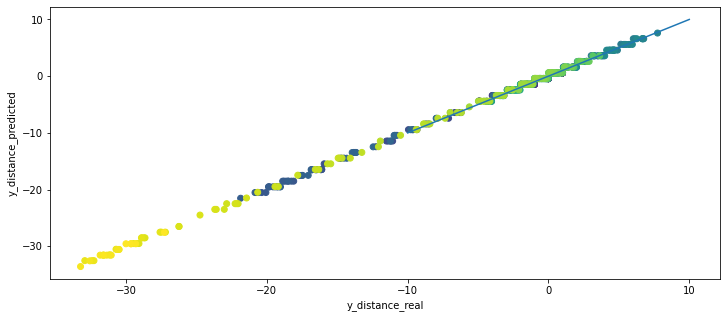

 --- plot predcition --- 
# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
224.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  125
Sensor from left wall =  78
Sensor from right wall =  24
most távolsagra van a felső faltól =  77.86034463046775
most távolsagra van az alsó faltól =  22.13965536953225
cccc

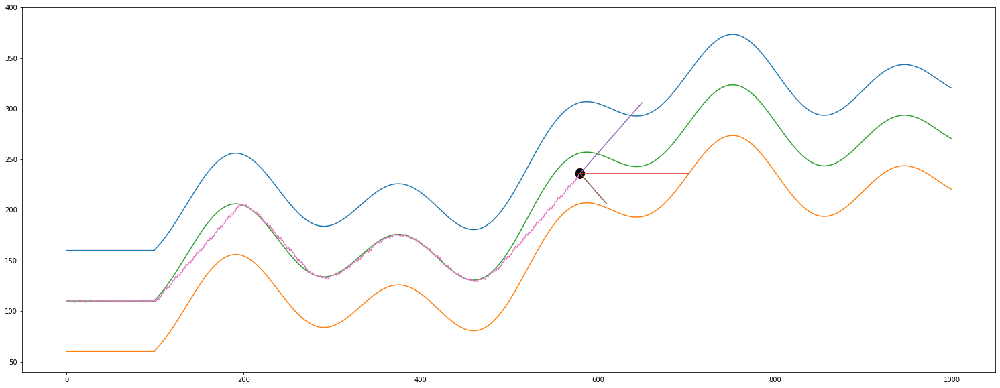

 --- plot --- 
------------------------------ IF i % 3 == 1 ------------------------------
# i =  580
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X_test =  [[ 71 124  31]]
actual predicted =  [[-20.51477321]]
actual self.y_distance[-1] =  -20.16911779645295
len(self.y_distance_real)      =  187
len(self.y_distance_predicted) =  187


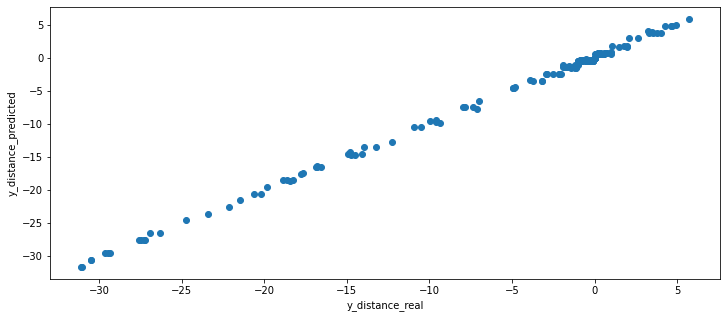

(581, 1)
(581, 1)


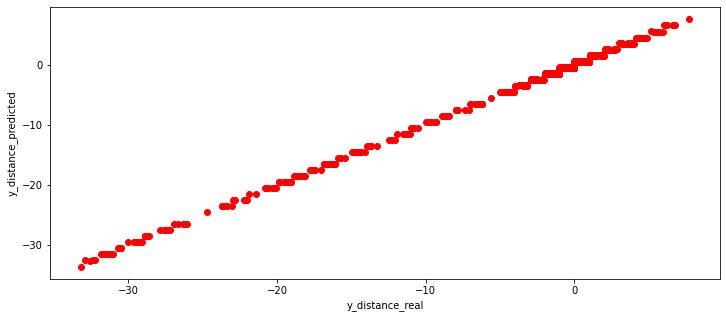

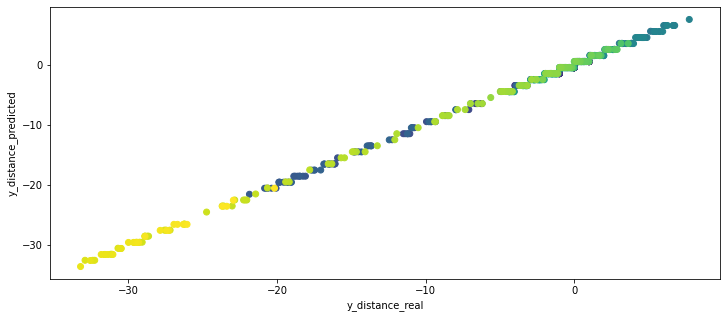

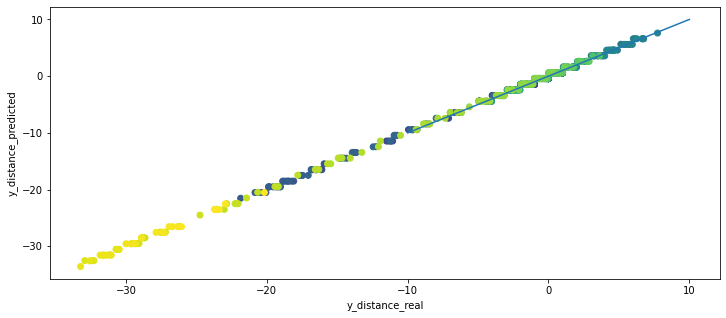

 --- plot predcition --- 
# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
236.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  123
Sensor from left wall =  71
Sensor from right wall =  31
most távolsagra van a felső faltól =  70.37107862999528
most távolsagra van az alsó faltól =  29.62892137000469
cccc

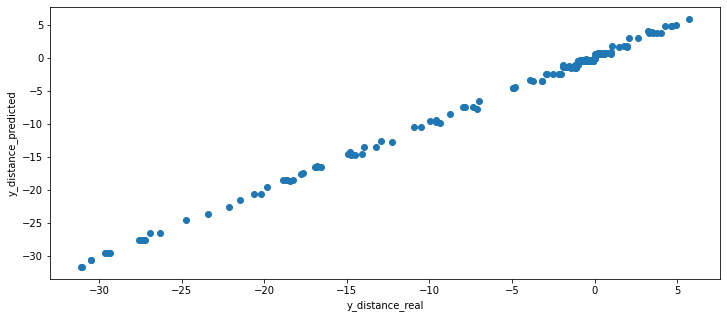

(593, 1)
(593, 1)


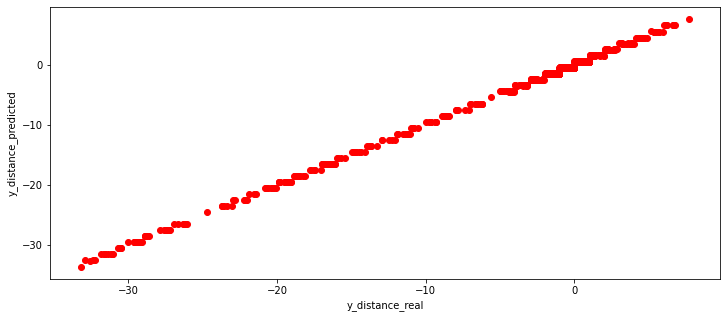

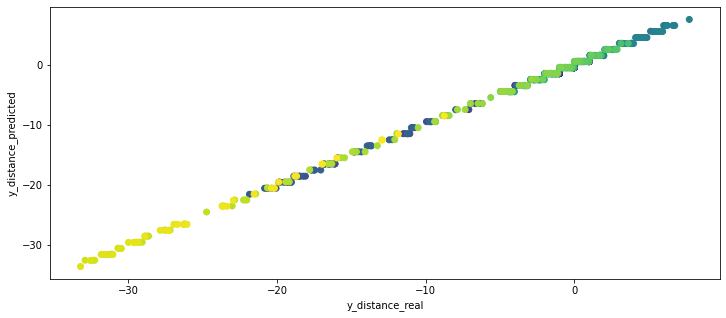

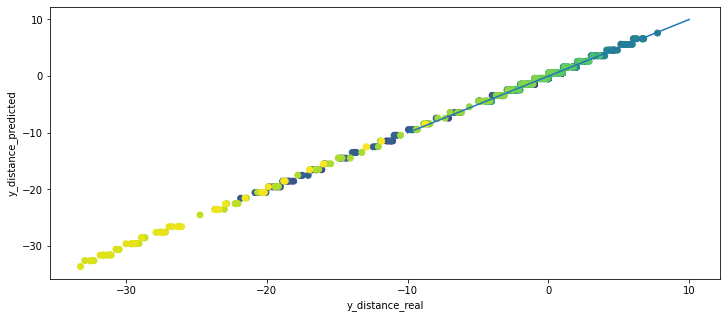

 --- plot predcition --- 
# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
248.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  121
Sensor from left wall =  59
Sensor from right wall =  43
most távolsagra van a felső faltól =  58.6239814459982
most távolsagra van az alsó faltól =  41.3760185540018
cccccc

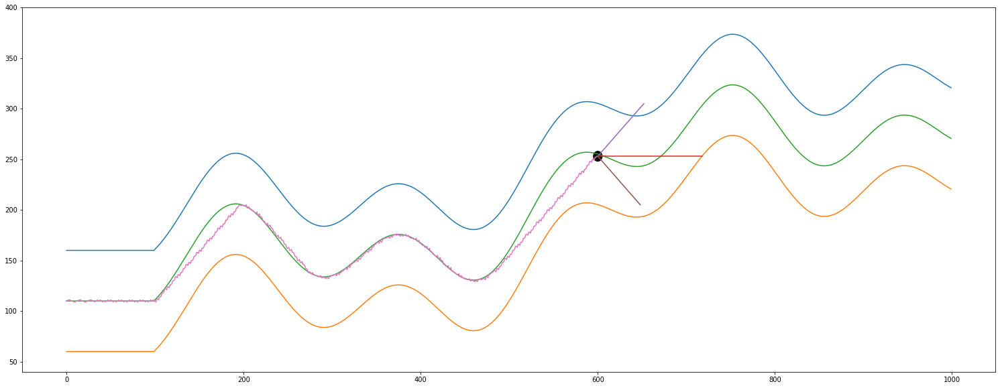

 --- plot --- 
------------------------------ IF i % 3 == 0 ------------------------------
# i =  600
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (601, 3)
y.shape =  (601, 1)
i       =  600
------------------------------ IF len(self.before) > 9 ------------------------------


# i =  600
  Ha már van elég before after adatunk
# 3. Tanulás itt kerül kiszámításra a lineáris regresszió minden egyes metrikára
# Linear Regression Learning --------------------------------------------------------------------------------------
		 # Linear Regression Training Results -------------------------------------------------------------------------
		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_left.coef_ =  [[ 1. -1.]]
		 regression_left.intercept_ =  [-1.42108547e-14]
		 ------------------------------- valyon mennyire jó ennek a met

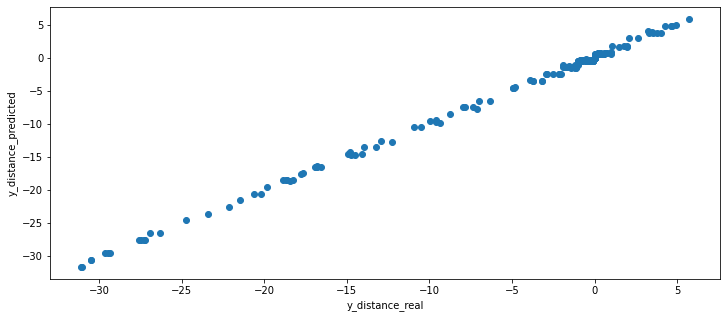

(605, 1)
(605, 1)


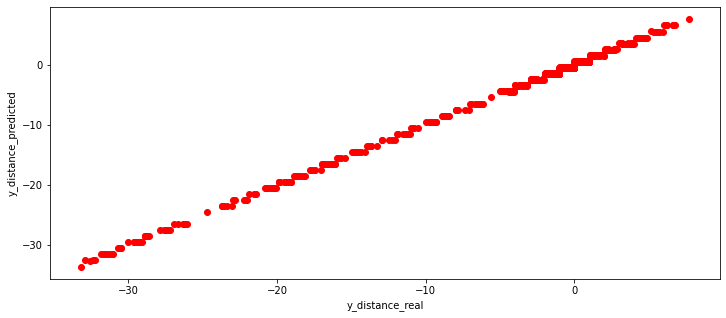

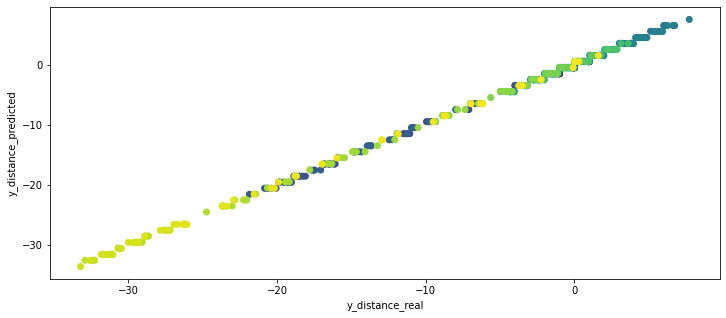

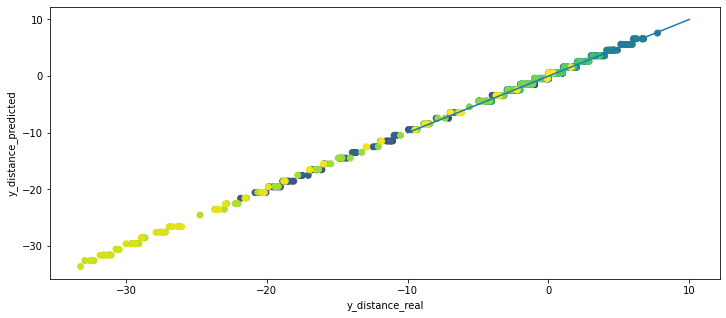

 --- plot predcition --- 
# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
254.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  115
Sensor from left wall =  50
Sensor from right wall =  52
most távolsagra van a felső faltól =  49.74980419744304
most távolsagra van az alsó faltól =  50.25019580255699
cccc

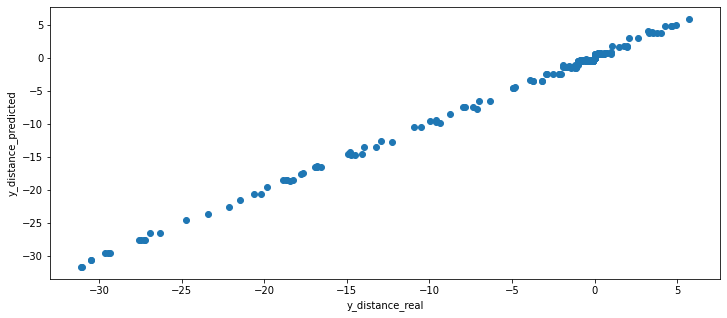

(617, 1)
(617, 1)


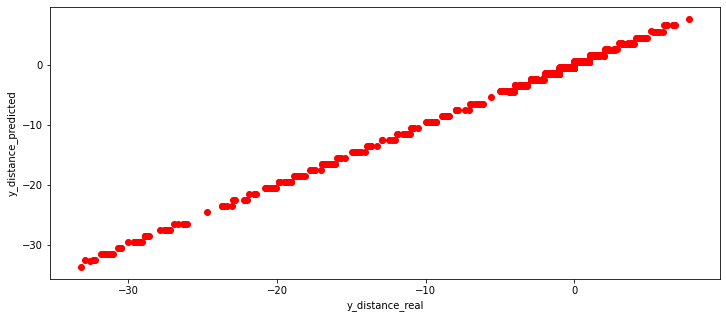

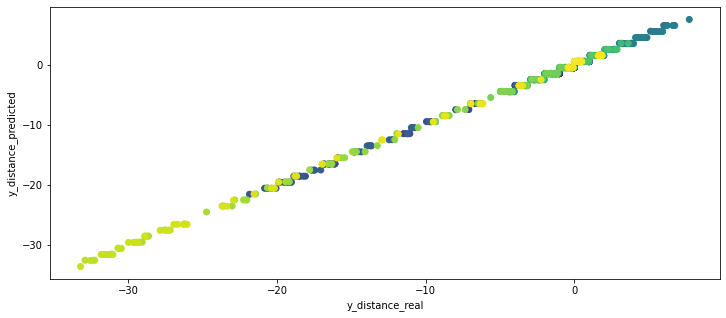

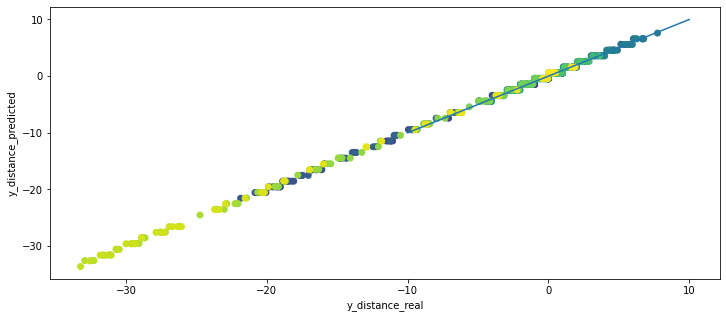

 --- plot predcition --- 
# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
250.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  99
Sensor from left wall =  50
Sensor from right wall =  52
most távolsagra van a felső faltól =  49.33867724069188
most távolsagra van az alsó faltól =  50.66132275930812
ccccc

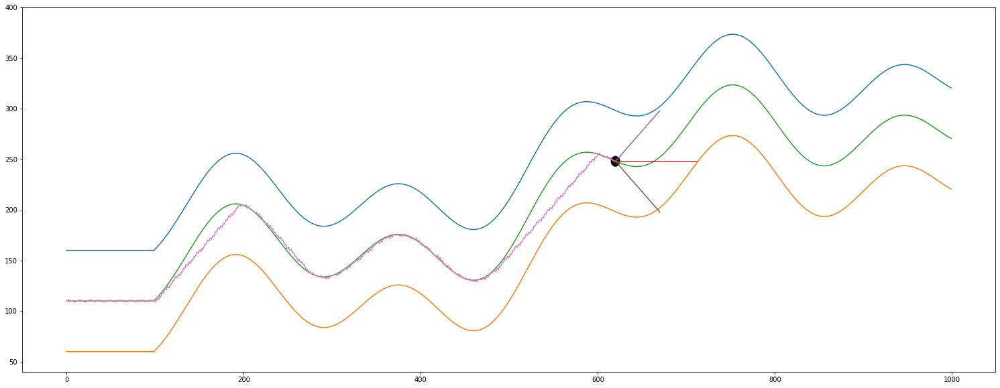

 --- plot --- 
------------------------------ IF i % 3 == 2 ------------------------------
# i =  620
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> down second
Sensor center =  94
Sensor from left wall =  52
Sensor from right wall =  50
most távolsagra van a felső faltól =  51.20479057381601
most távolsagra van az alsó faltól =  48.79520942618396
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  620
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
self.vertical_distance_from_middle =  -1.2047905738160125
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  -1.2047905738160125
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  621
			 len(self.sensor_left)   =  621
			 len(self.sensor_center) =  62

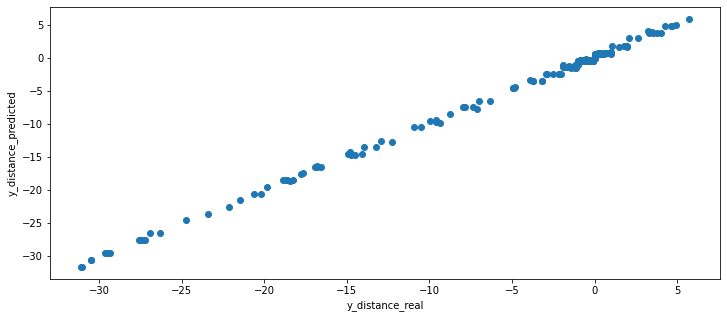

(629, 1)
(629, 1)


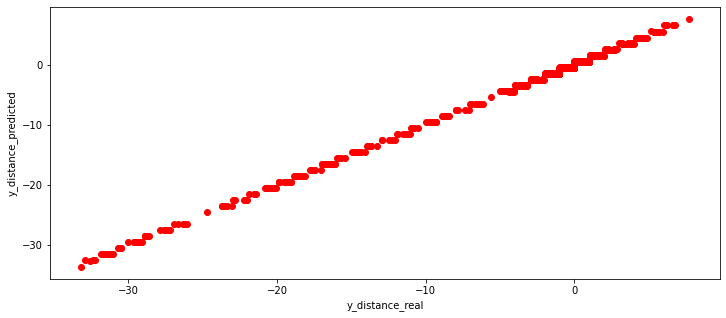

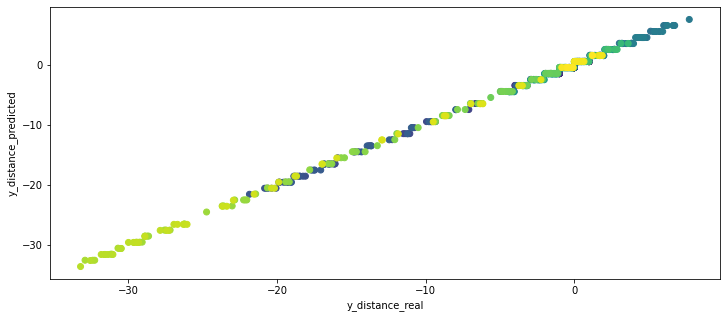

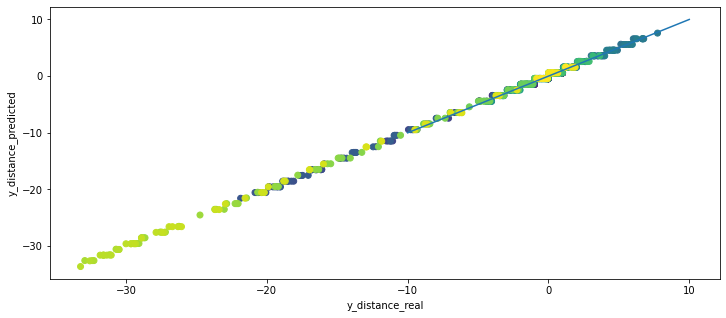

 --- plot predcition --- 
# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
245.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  83
Sensor from left wall =  51
Sensor from right wall =  51
most távolsagra van a felső faltól =  50.174968012766215
most távolsagra van az alsó faltól =  49.825031987233785
ccc

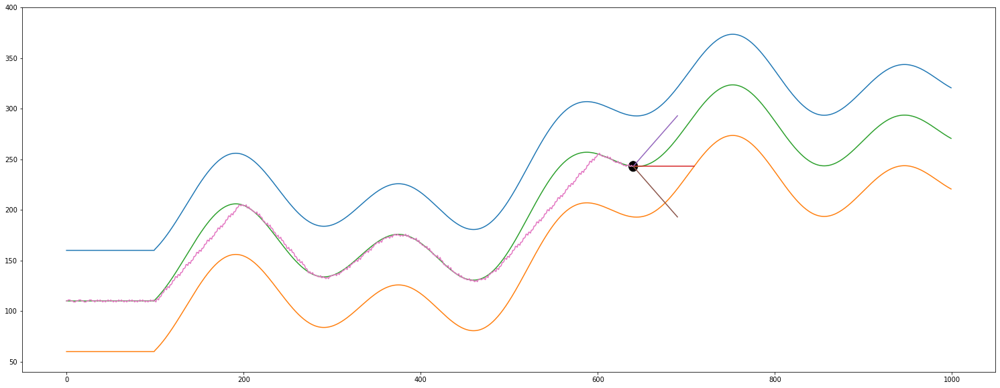

 --- plot --- 
------------------------------ IF i % 3 == 1 ------------------------------
# i =  640
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X_test =  [[51 70 51]]
actual predicted =  [[-0.41194671]]
actual self.y_distance[-1] =  -0.019382838112278478
len(self.y_distance_real)      =  207
len(self.y_distance_predicted) =  207


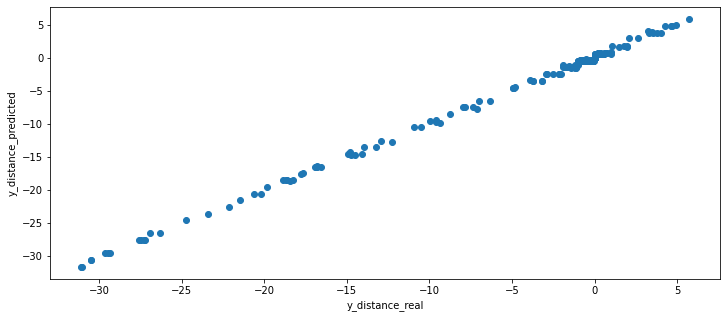

(641, 1)
(641, 1)


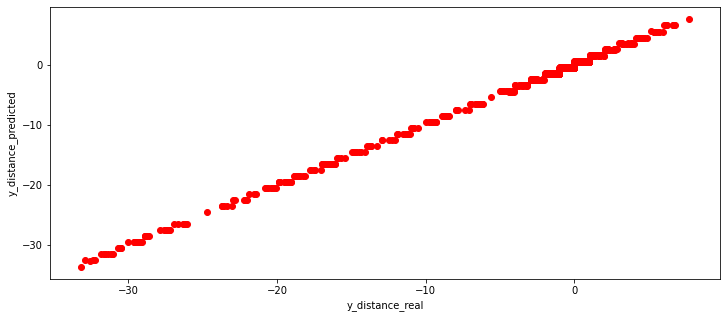

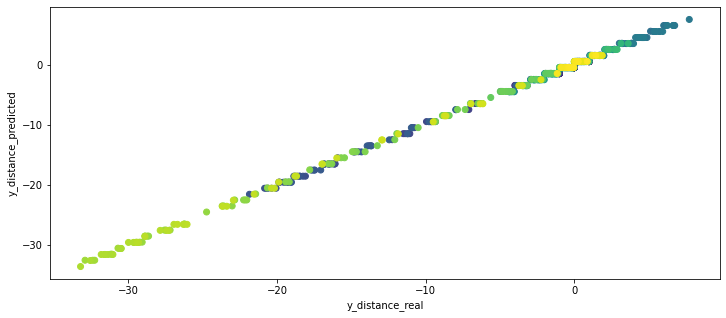

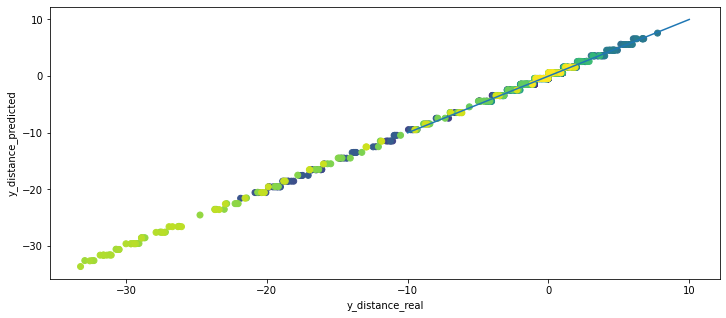

 --- plot predcition --- 
# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
243.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  69
Sensor from left wall =  50
Sensor from right wall =  52
most távolsagra van a felső faltól =  49.942391787511156
most távolsagra van az alsó faltól =  50.057608212488844
ccc

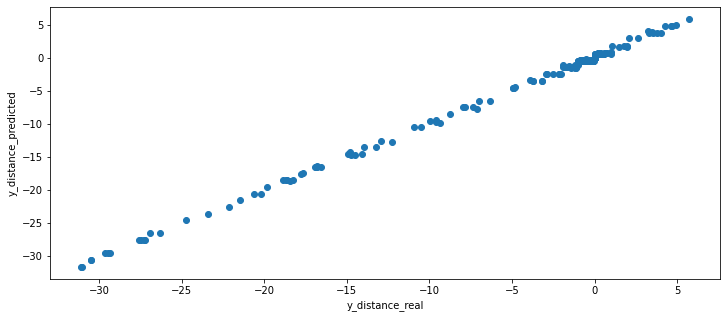

(653, 1)
(653, 1)


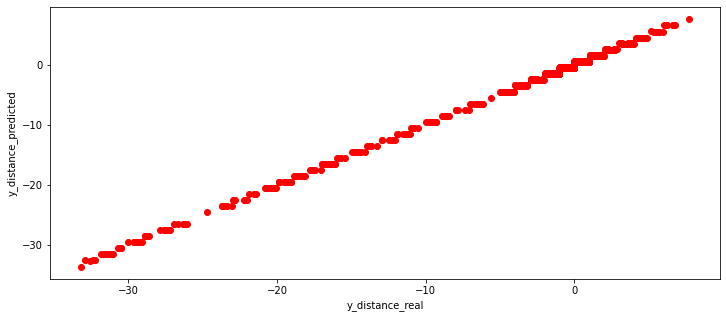

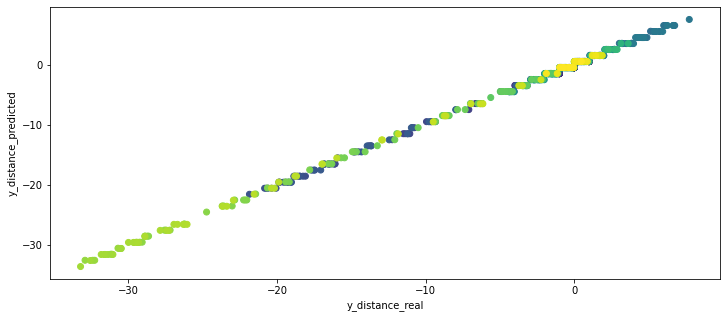

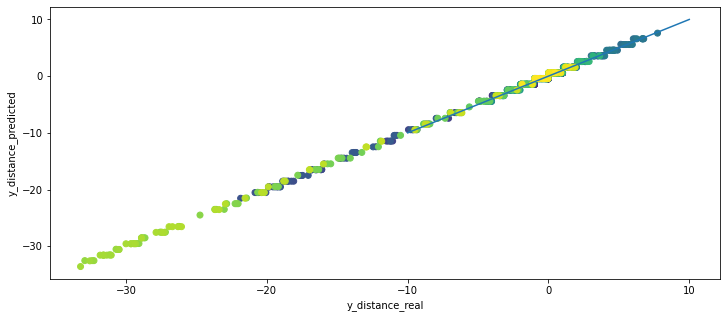

 --- plot predcition --- 
# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
243.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  57
Sensor from left wall =  51
Sensor from right wall =  51
most távolsagra van a felső faltól =  50.94618334503019
most távolsagra van az alsó faltól =  49.05381665496981
ccccc

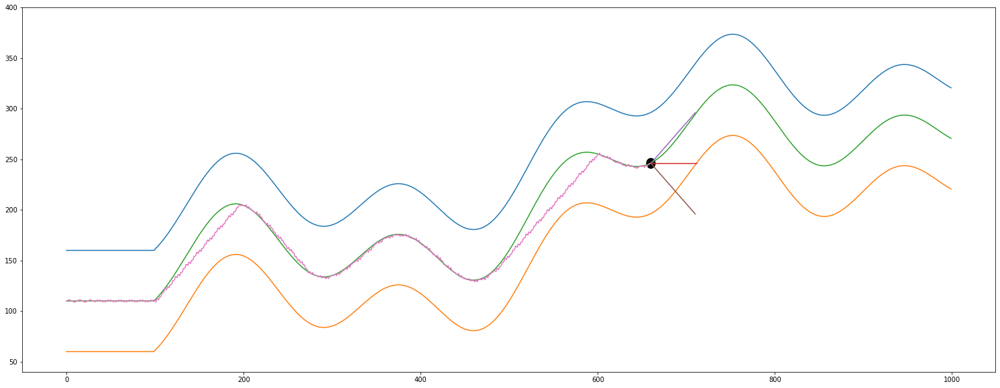

 --- plot --- 
------------------------------ IF i % 3 == 0 ------------------------------
# i =  660
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (661, 3)
y.shape =  (661, 1)
i       =  660
------------------------------ IF len(self.before) > 9 ------------------------------


# i =  660
  Ha már van elég before after adatunk
# 3. Tanulás itt kerül kiszámításra a lineáris regresszió minden egyes metrikára
# Linear Regression Learning --------------------------------------------------------------------------------------
		 # Linear Regression Training Results -------------------------------------------------------------------------
		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_left.coef_ =  [[ 1. -1.]]
		 regression_left.intercept_ =  [1.42108547e-14]
		 ------------------------------- valyon mennyire jó ennek a metr

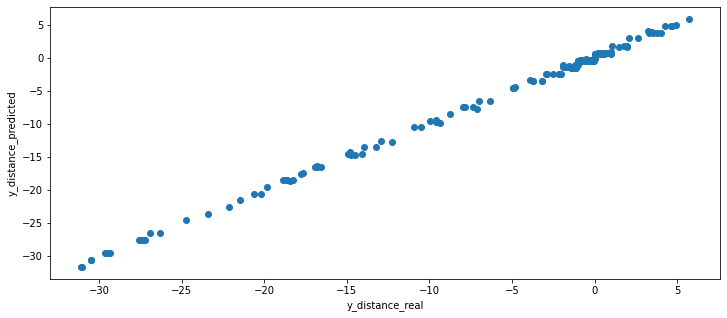

(665, 1)
(665, 1)


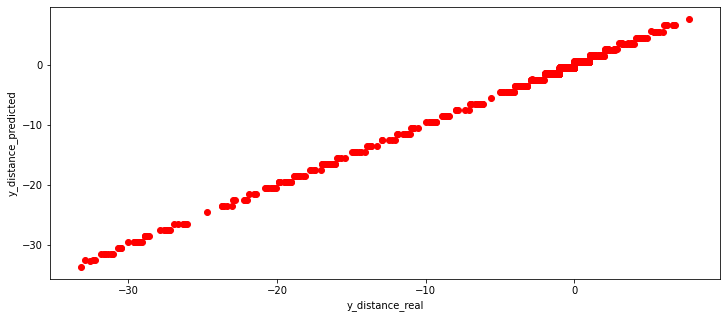

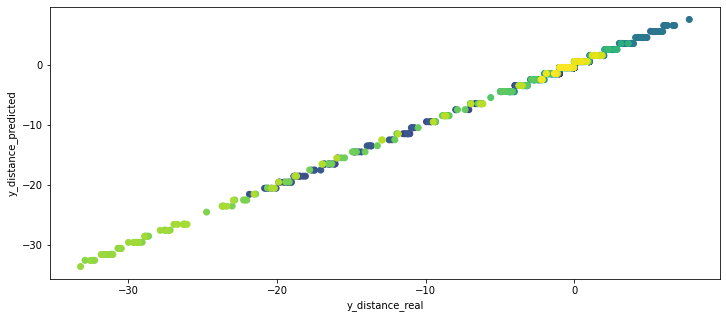

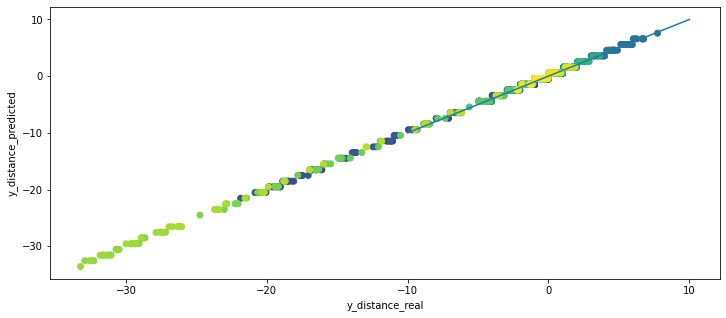

 --- plot predcition --- 
# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
247.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  49
Sensor from left wall =  52
Sensor from right wall =  50
most távolsagra van a felső faltól =  51.89642289847882
most távolsagra van az alsó faltól =  48.10357710152121
ccccc

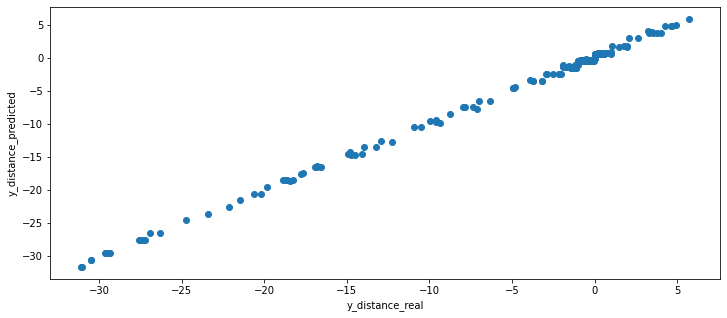

(677, 1)
(677, 1)


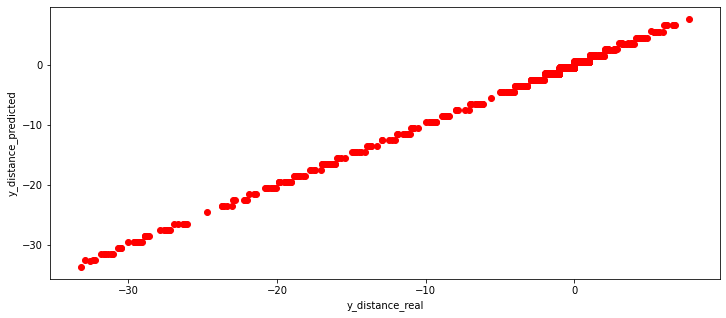

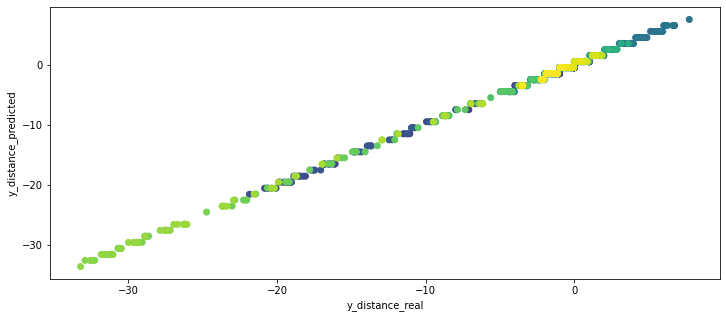

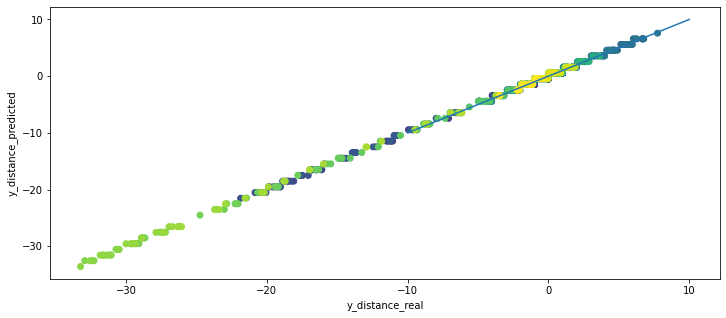

 --- plot predcition --- 
# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
256.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  45
Sensor from left wall =  52
Sensor from right wall =  50
most távolsagra van a felső faltól =  51.786929430785335
most távolsagra van az alsó faltól =  48.213070569214665
ccc

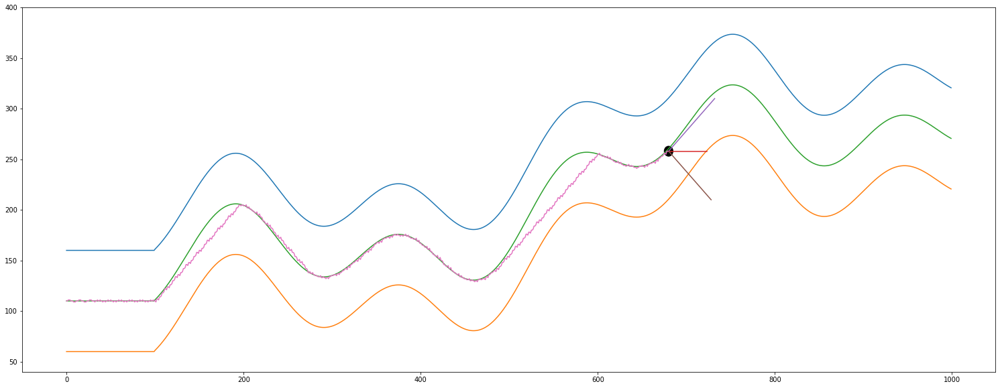

 --- plot --- 
------------------------------ IF i % 3 == 2 ------------------------------
# i =  680
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> down second
Sensor center =  43
Sensor from left wall =  54
Sensor from right wall =  48
most távolsagra van a felső faltól =  53.554592567596956
most távolsagra van az alsó faltól =  46.445407432403044
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  680
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
self.vertical_distance_from_middle =  -3.5545925675969556
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  -3.5545925675969556
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  681
			 len(self.sensor_left)   =  681
			 len(self.sensor_center) =  

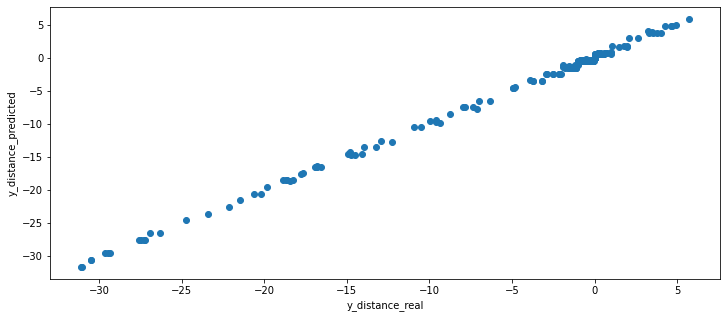

(689, 1)
(689, 1)


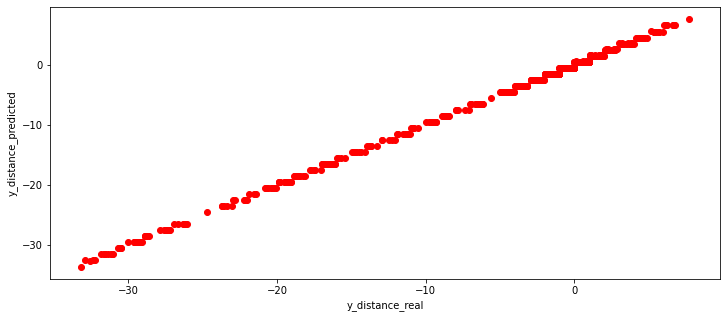

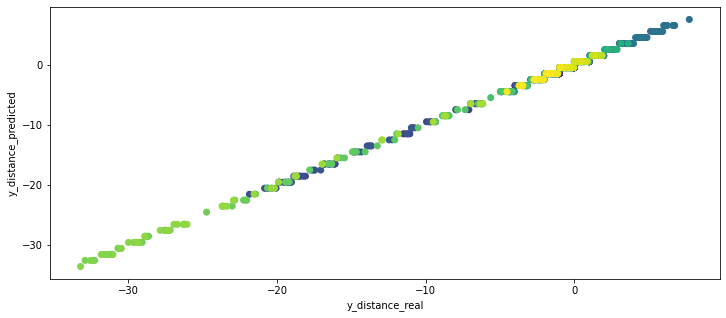

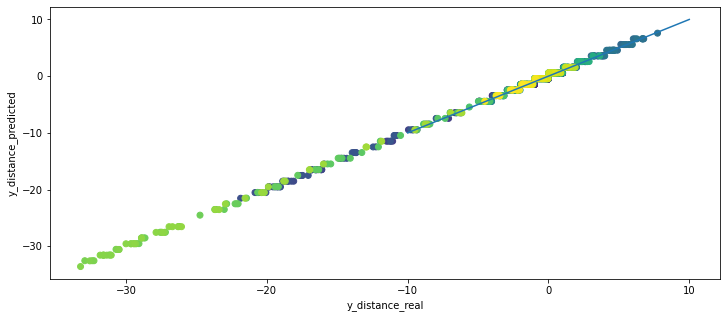

 --- plot predcition --- 
# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
267.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  46
Sensor from left wall =  53
Sensor from right wall =  49
most távolsagra van a felső faltól =  52.88901760708359
most távolsagra van az alsó faltól =  47.11098239291641
ccccc

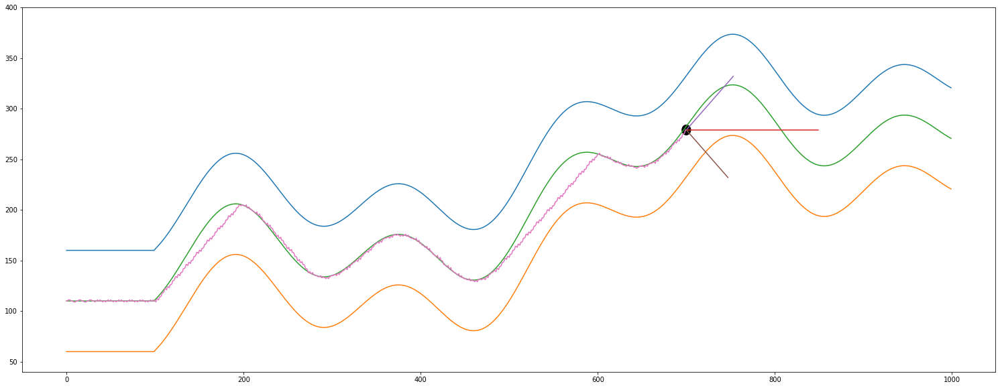

 --- plot --- 
------------------------------ IF i % 3 == 1 ------------------------------
# i =  700
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X_test =  [[ 54 150  48]]
actual predicted =  [[-3.46014043]]
actual self.y_distance[-1] =  -3.6663927987185048
len(self.y_distance_real)      =  227
len(self.y_distance_predicted) =  227


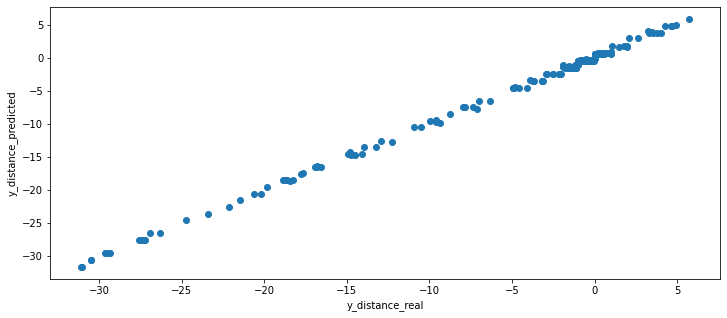

(701, 1)
(701, 1)


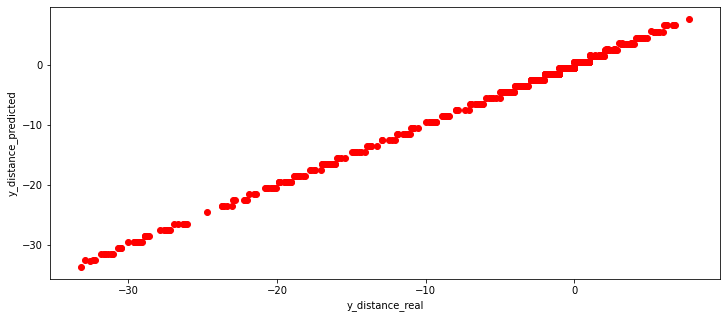

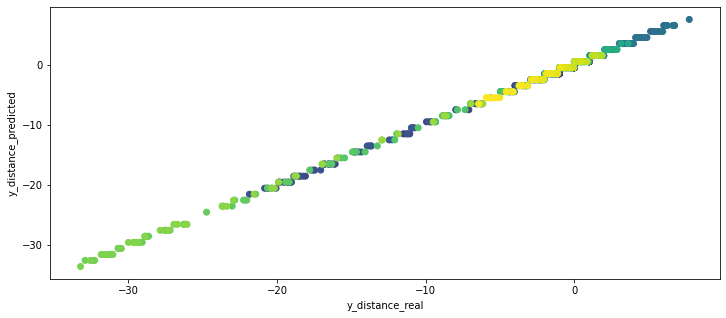

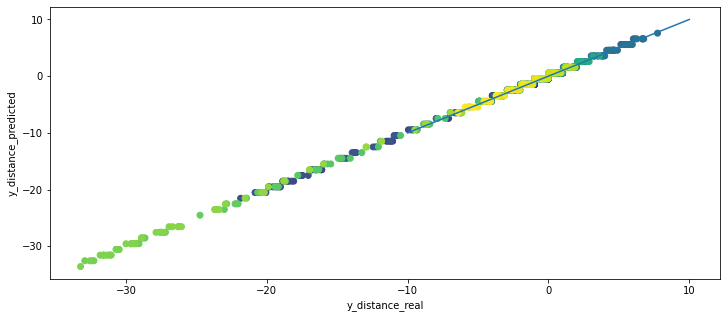

 --- plot predcition --- 
# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
279.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor from left wall =  55
Sensor from right wall =  47
most távolsagra van a felső faltól =  54.86124780330624
most távolsagra van az alsó faltól =  45.13875219669376
ccccccccccccccccccccccccc

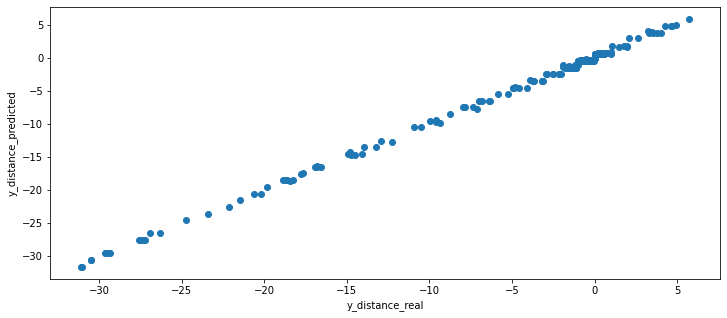

(713, 1)
(713, 1)


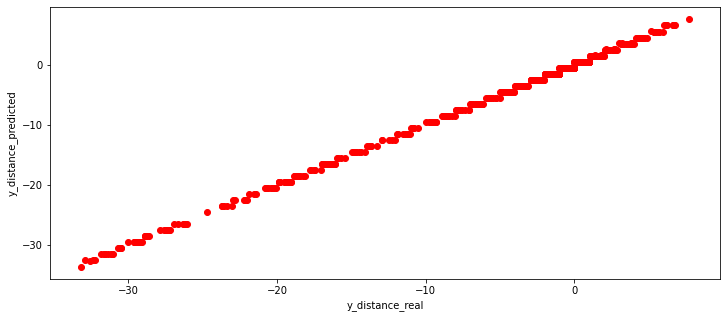

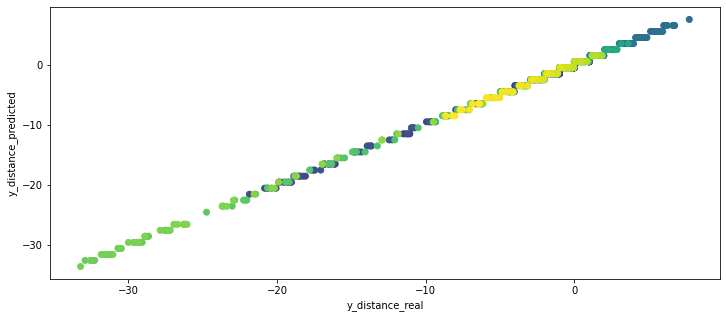

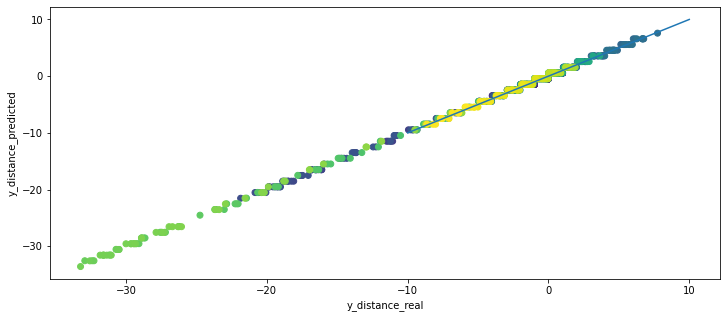

 --- plot predcition --- 
# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
291.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor from left wall =  57
Sensor from right wall =  45
most távolsagra van a felső faltól =  56.95795121215224
most távolsagra van az alsó faltól =  43.04204878784779
ccccccccccccccccccccccccc

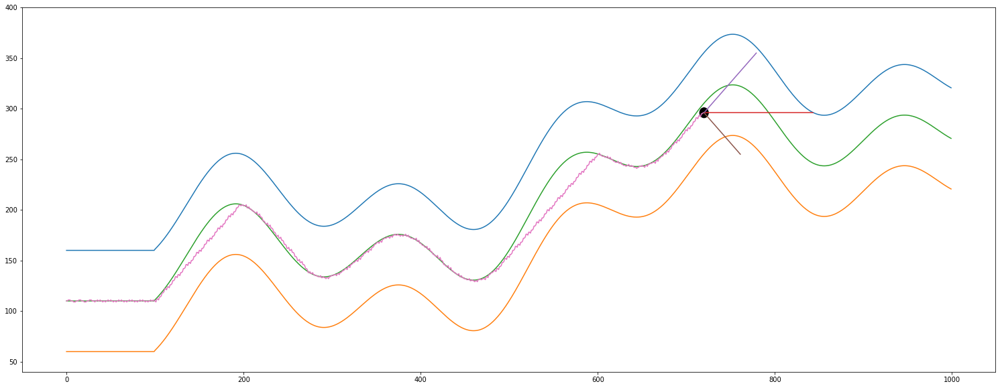

 --- plot --- 
------------------------------ IF i % 3 == 0 ------------------------------
# i =  720
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (721, 3)
y.shape =  (721, 1)
i       =  720
------------------------------ IF len(self.before) > 9 ------------------------------


# i =  720
  Ha már van elég before after adatunk
# 3. Tanulás itt kerül kiszámításra a lineáris regresszió minden egyes metrikára
# Linear Regression Learning --------------------------------------------------------------------------------------
		 # Linear Regression Training Results -------------------------------------------------------------------------
		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_left.coef_ =  [[ 1. -1.]]
		 regression_left.intercept_ =  [-2.13162821e-14]
		 ------------------------------- valyon mennyire jó ennek a met

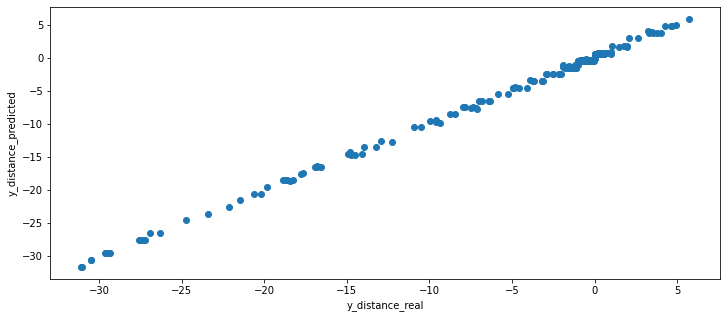

(725, 1)
(725, 1)


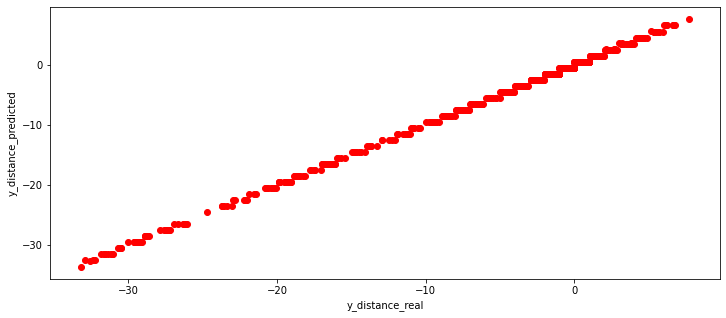

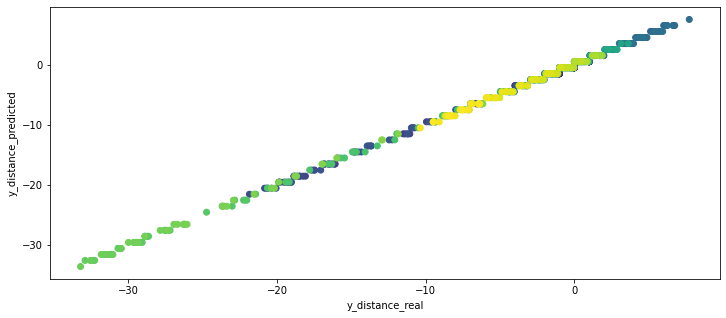

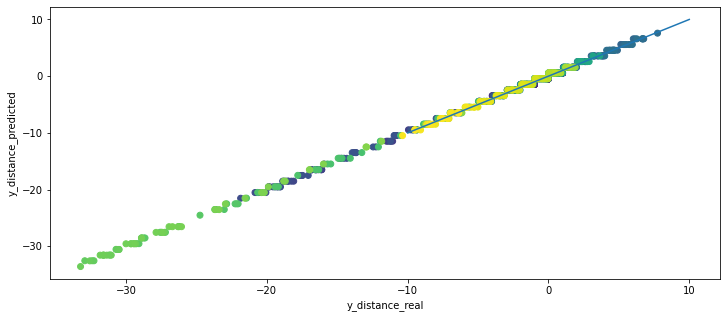

 --- plot predcition --- 
# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
303.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  107
Sensor from left wall =  58
Sensor from right wall =  44
most távolsagra van a felső faltól =  57.30368075471506
most távolsagra van az alsó faltól =  42.69631924528494
cccc

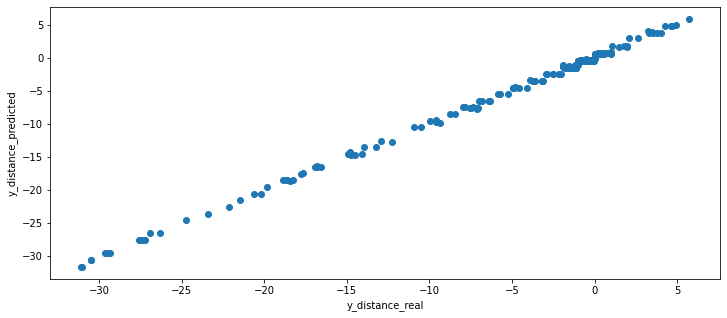

(737, 1)
(737, 1)


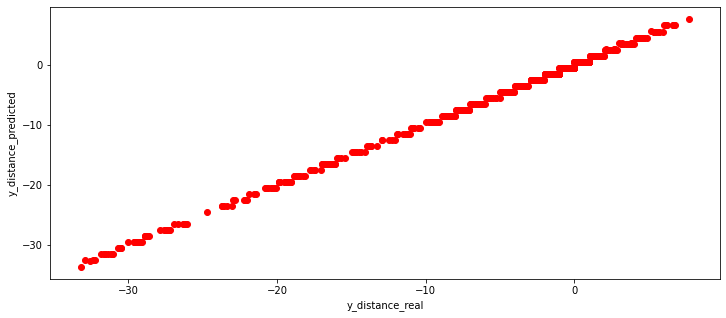

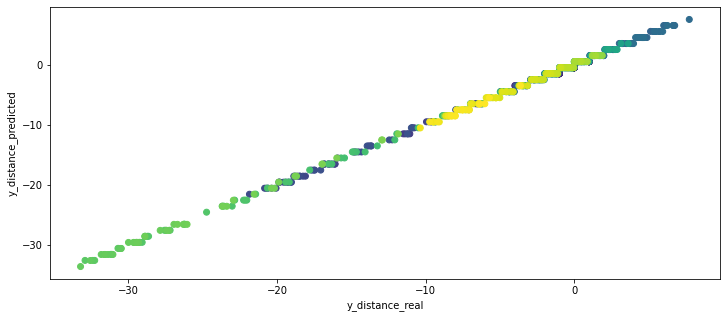

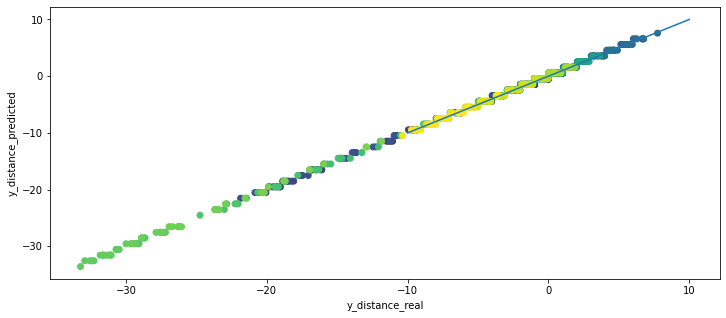

 --- plot predcition --- 
# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
315.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  83
Sensor from left wall =  55
Sensor from right wall =  47
most távolsagra van a felső faltól =  54.19029212414466
most távolsagra van az alsó faltól =  45.80970787585534
ccccc

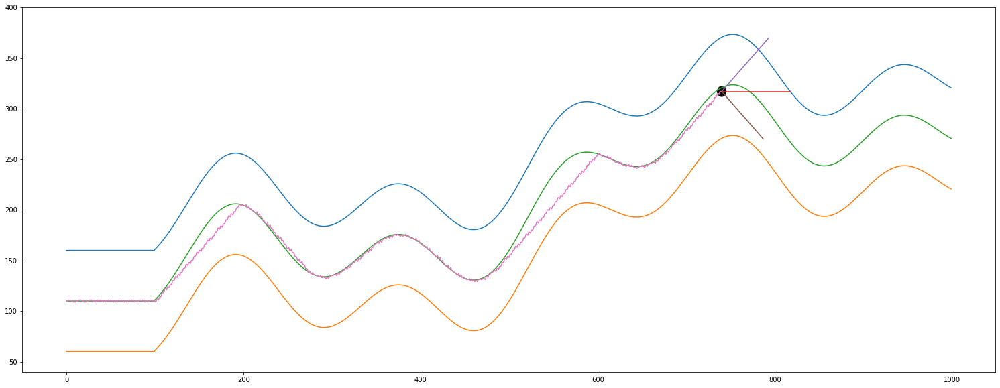

 --- plot --- 
------------------------------ IF i % 3 == 2 ------------------------------
# i =  740
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> down second
Sensor center =  79
Sensor from left wall =  55
Sensor from right wall =  47
most távolsagra van a felső faltól =  54.709880321585615
most távolsagra van az alsó faltól =  45.290119678414385
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  740
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
self.vertical_distance_from_middle =  -4.709880321585615
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  -4.709880321585615
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  741
			 len(self.sensor_left)   =  741
			 len(self.sensor_center) =  74

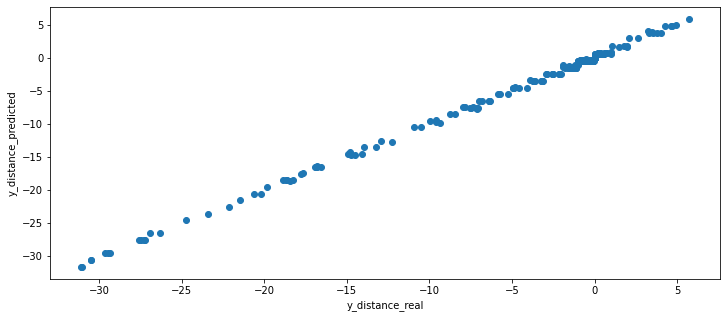

(749, 1)
(749, 1)


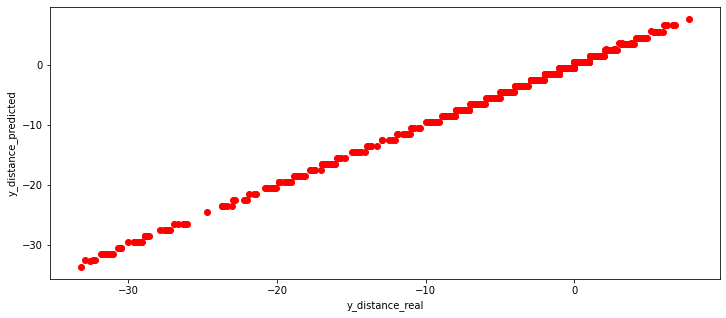

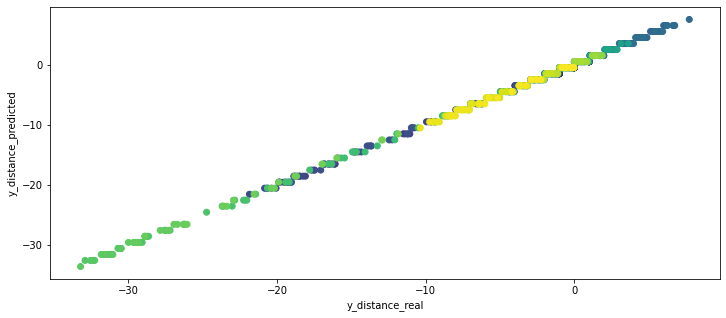

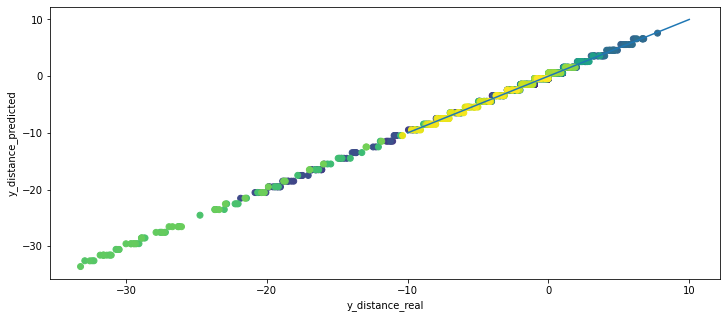

 --- plot predcition --- 
# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
323.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  64
Sensor from left wall =  51
Sensor from right wall =  51
most távolsagra van a felső faltól =  50.349747654906196
most távolsagra van az alsó faltól =  49.650252345093804
ccc

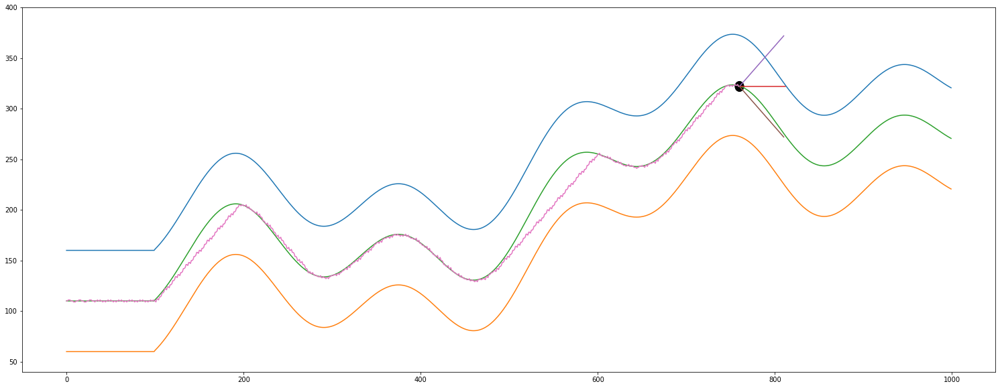

 --- plot --- 
------------------------------ IF i % 3 == 1 ------------------------------
# i =  760
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X_test =  [[51 53 51]]
actual predicted =  [[-0.43207685]]
actual self.y_distance[-1] =  -0.4649872421913983
len(self.y_distance_real)      =  247
len(self.y_distance_predicted) =  247


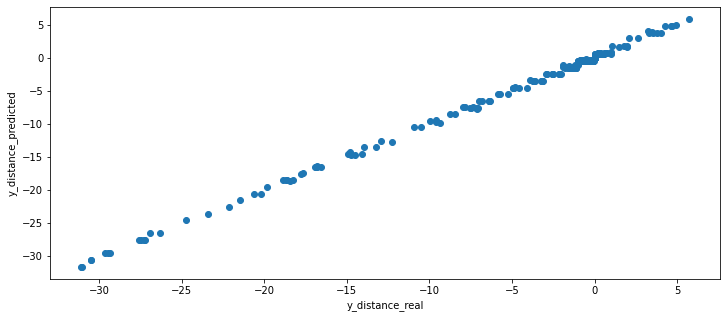

(761, 1)
(761, 1)


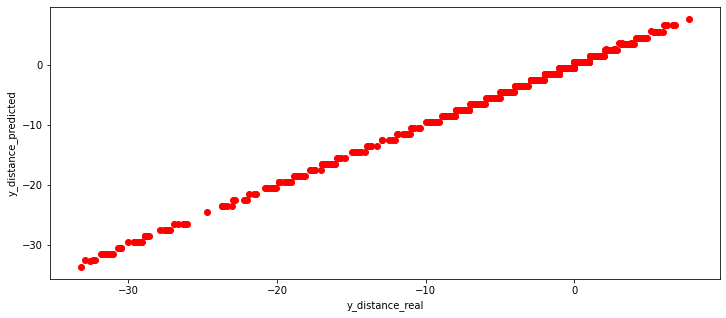

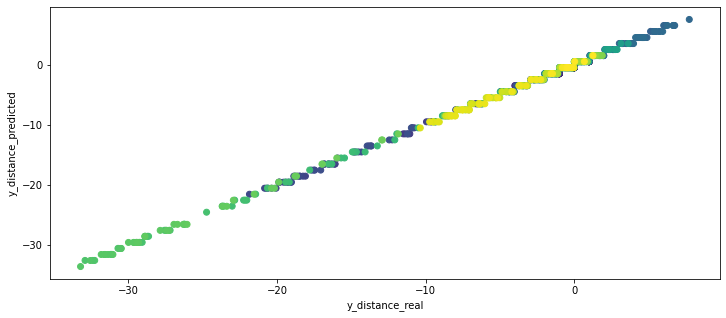

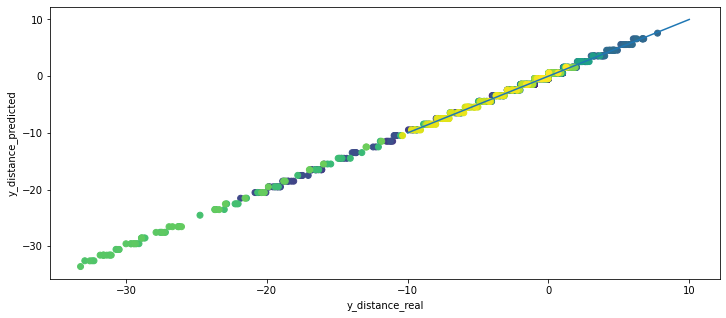

 --- plot predcition --- 
# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
322.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  52
Sensor from left wall =  51
Sensor from right wall =  51
most távolsagra van a felső faltól =  50.15952973790377
most távolsagra van az alsó faltól =  49.84047026209623
ccccc

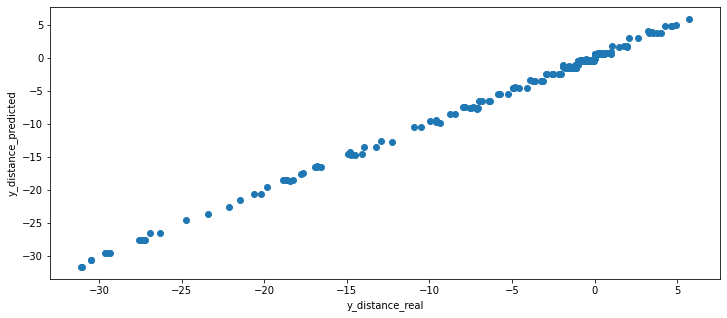

(773, 1)
(773, 1)


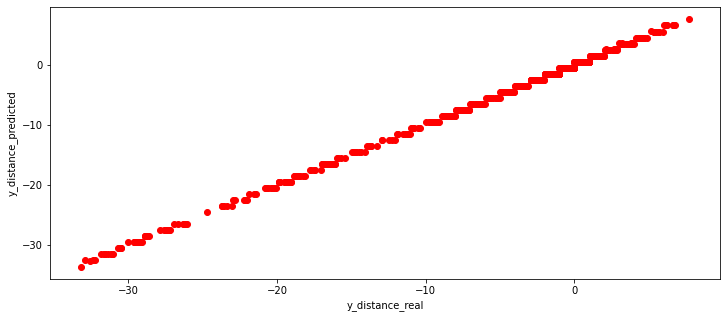

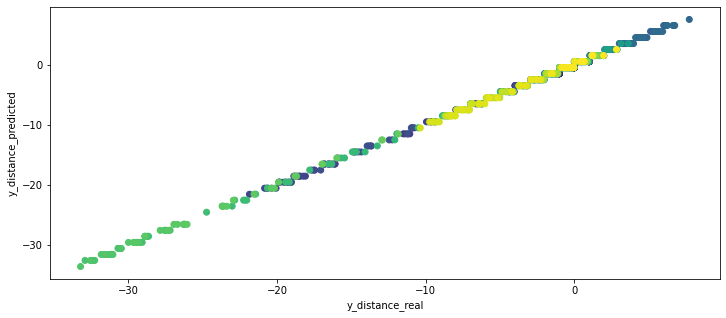

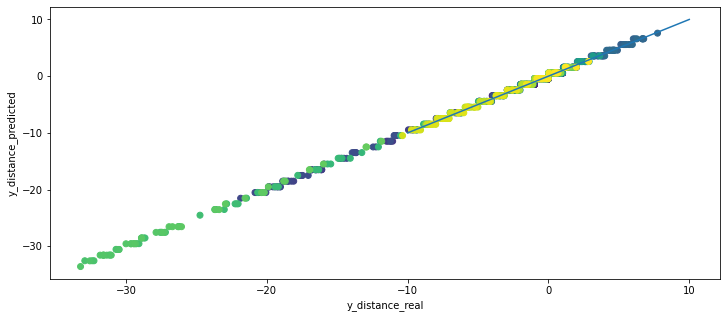

 --- plot predcition --- 
# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
317.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  45
Sensor from left wall =  49
Sensor from right wall =  53
most távolsagra van a felső faltól =  48.74815188734436
most távolsagra van az alsó faltól =  51.25184811265564
ccccc

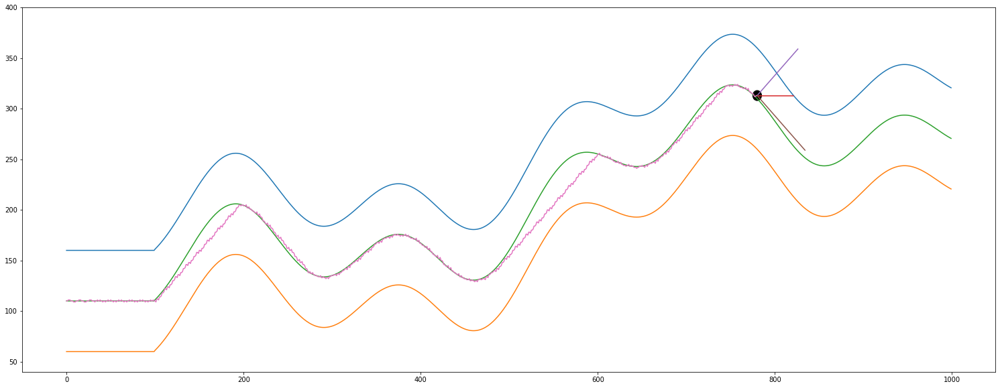

 --- plot --- 
------------------------------ IF i % 3 == 0 ------------------------------
# i =  780
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (781, 3)
y.shape =  (781, 1)
i       =  780
------------------------------ IF len(self.before) > 9 ------------------------------


# i =  780
  Ha már van elég before after adatunk
# 3. Tanulás itt kerül kiszámításra a lineáris regresszió minden egyes metrikára
# Linear Regression Learning --------------------------------------------------------------------------------------
		 # Linear Regression Training Results -------------------------------------------------------------------------
		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_left.coef_ =  [[ 1. -1.]]
		 regression_left.intercept_ =  [-3.55271368e-14]
		 ------------------------------- valyon mennyire jó ennek a met

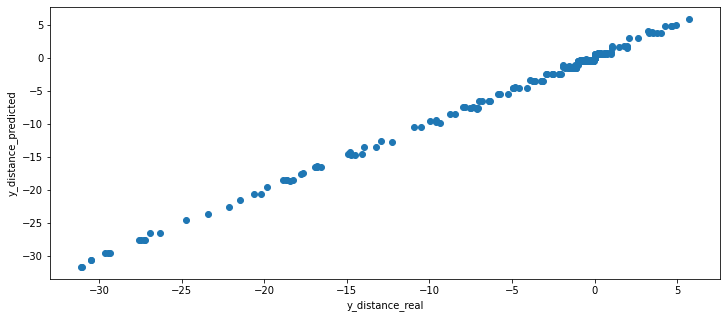

(785, 1)
(785, 1)


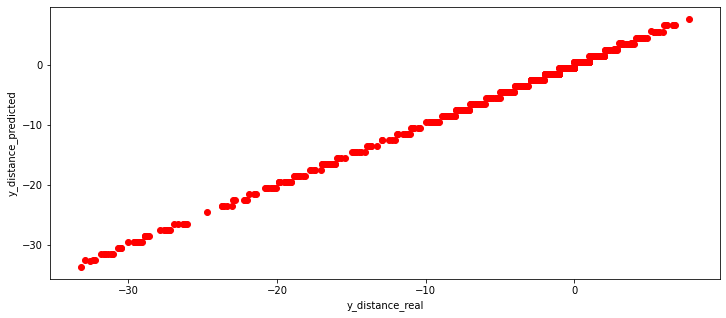

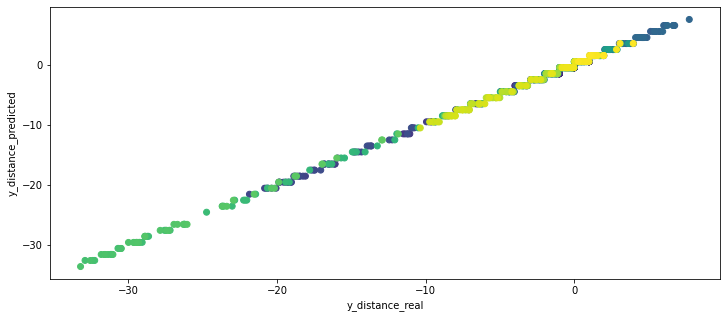

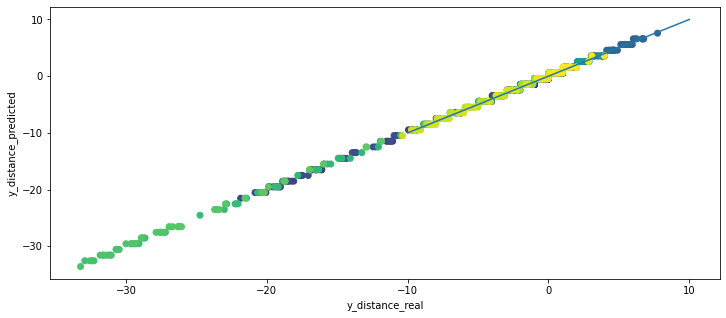

 --- plot predcition --- 
# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
308.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  42
Sensor from left wall =  47
Sensor from right wall =  55
most távolsagra van a felső faltól =  46.983991264271936
most távolsagra van az alsó faltól =  53.016008735728036
ccc

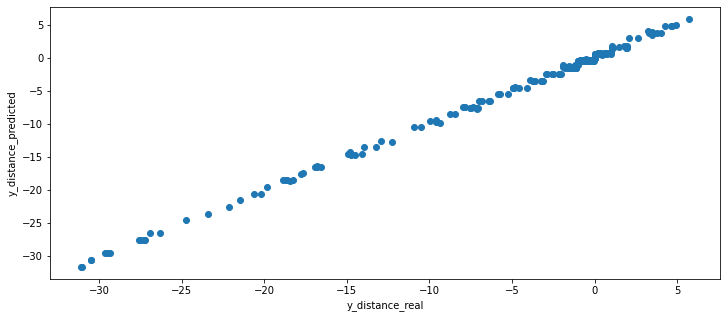

(797, 1)
(797, 1)


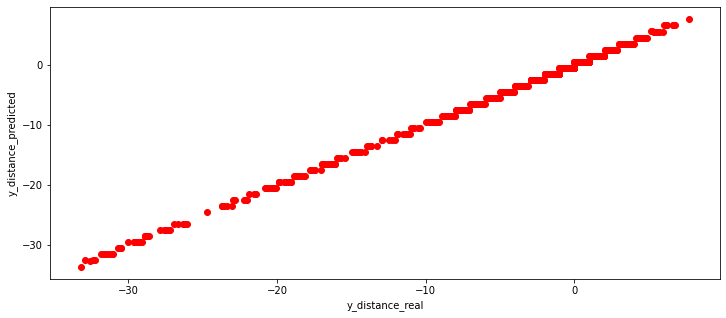

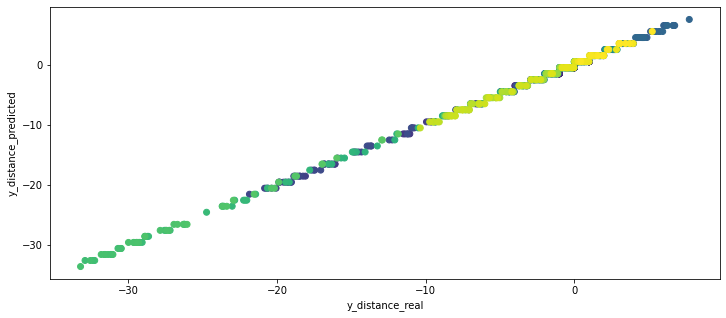

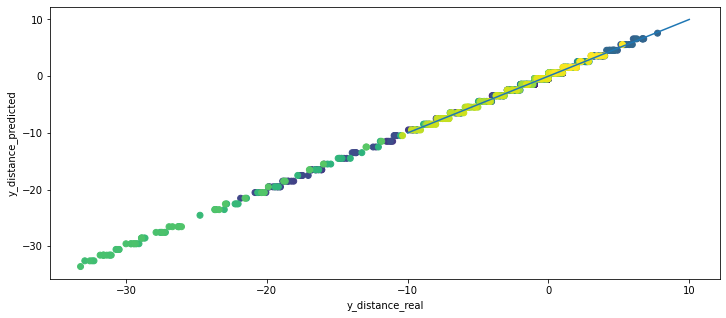

 --- plot predcition --- 
# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
296.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  47
Sensor from left wall =  46
Sensor from right wall =  56
most távolsagra van a felső faltól =  45.34905280891064
most távolsagra van az alsó faltól =  54.65094719108936
ccccc

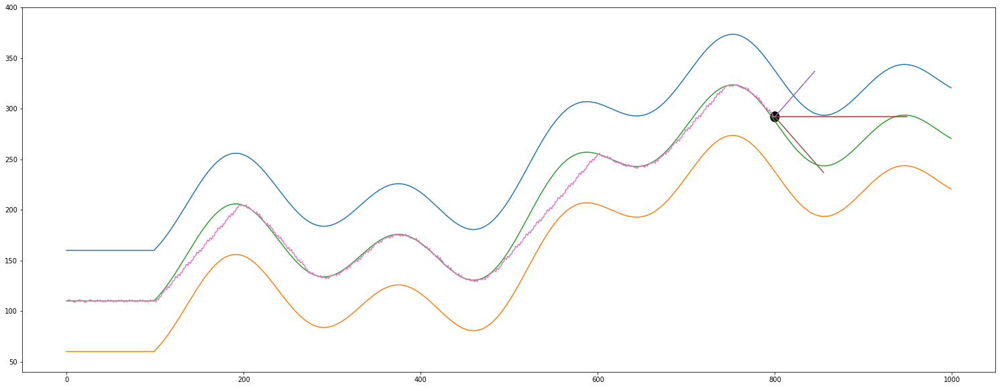

 --- plot --- 
------------------------------ IF i % 3 == 2 ------------------------------
# i =  800
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> down second
Sensor from left wall =  47
Sensor from right wall =  55
most távolsagra van a felső faltól =  46.70664647533977
most távolsagra van az alsó faltól =  53.29335352466026
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  800
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
self.vertical_distance_from_middle =  3.2933535246602332
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  3.2933535246602332
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  801
			 len(self.sensor_left)   =  801
			 len(self.sensor_center) =  801
			 len(self.sensor_

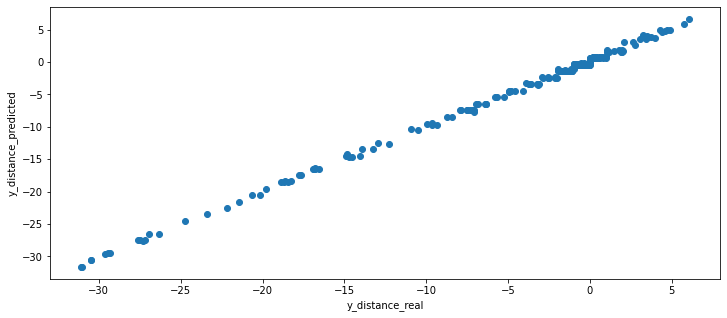

(809, 1)
(809, 1)


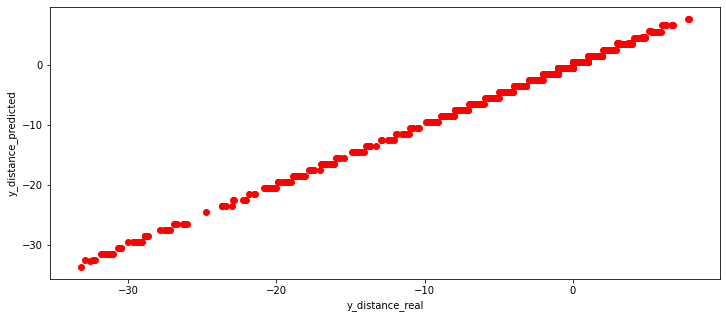

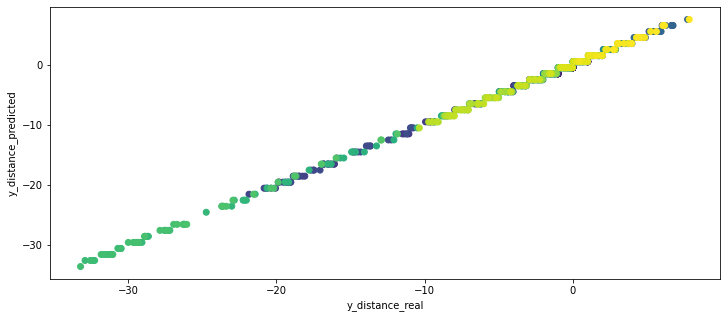

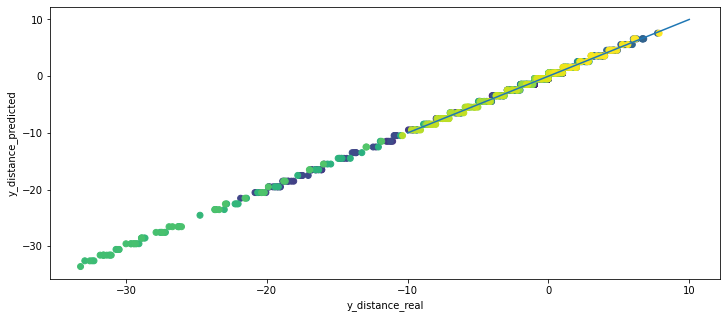

 --- plot predcition --- 
# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
284.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor from left wall =  43
Sensor from right wall =  59
most távolsagra van a felső faltól =  42.71740994867548
most távolsagra van az alsó faltól =  57.28259005132449
ccccccccccccccccccccccccc

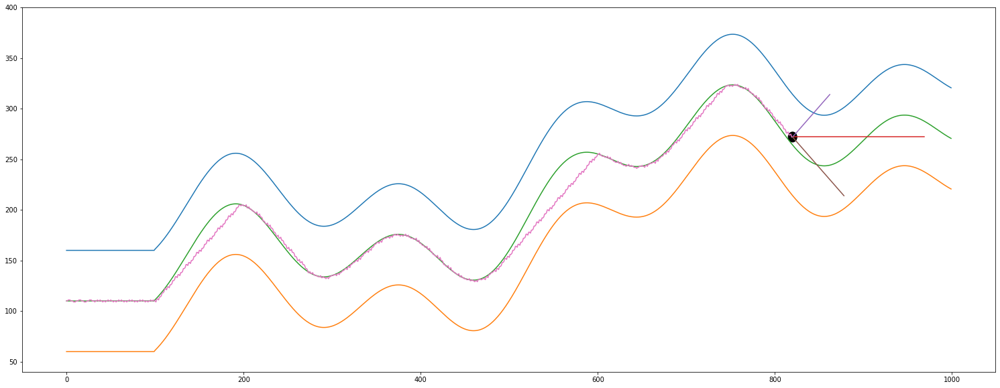

 --- plot --- 
------------------------------ IF i % 3 == 1 ------------------------------
# i =  820
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X_test =  [[ 43 150  59]]
actual predicted =  [[7.5721434]]
actual self.y_distance[-1] =  7.873764548680583
len(self.y_distance_real)      =  267
len(self.y_distance_predicted) =  267


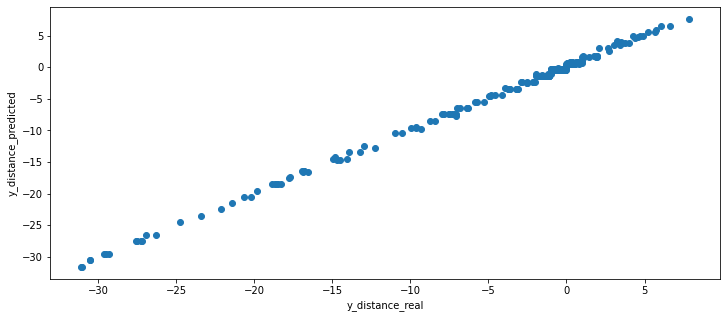

(821, 1)
(821, 1)


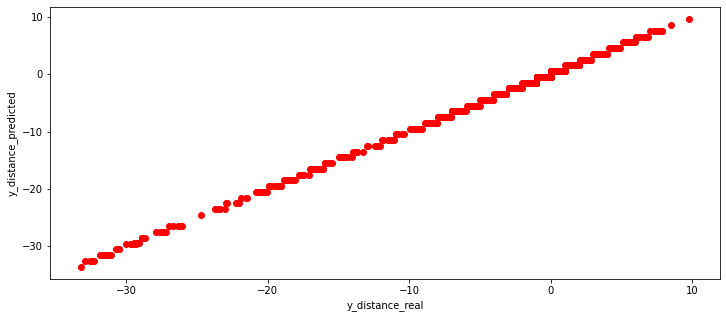

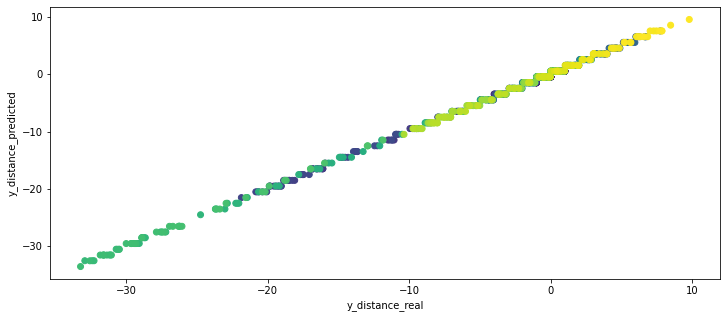

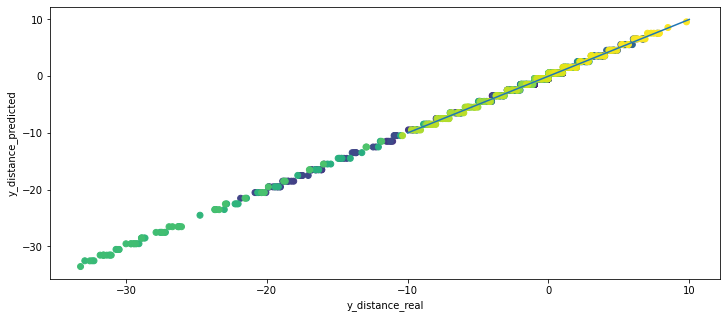

 --- plot predcition --- 
# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
272.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor from left wall =  42
Sensor from right wall =  60
most távolsagra van a felső faltól =  41.07308761442158
most távolsagra van az alsó faltól =  58.92691238557842
ccccccccccccccccccccccccc

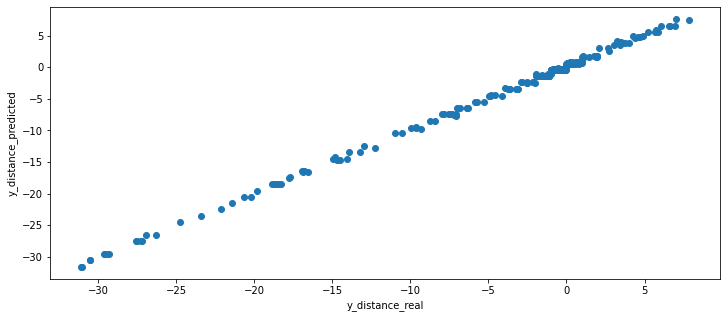

(833, 1)
(833, 1)


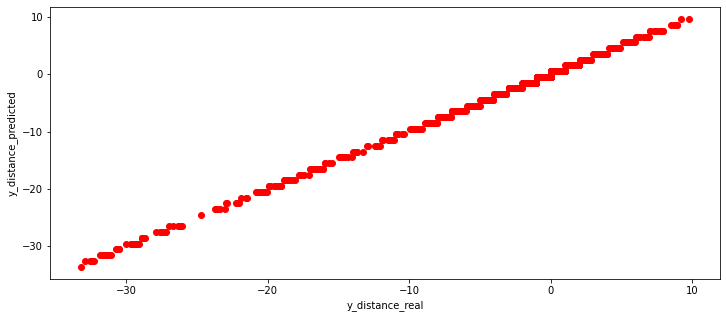

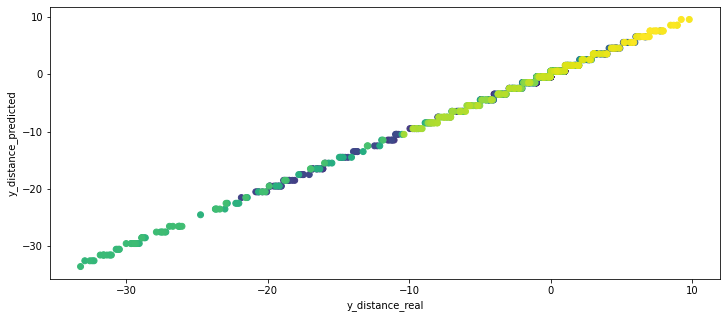

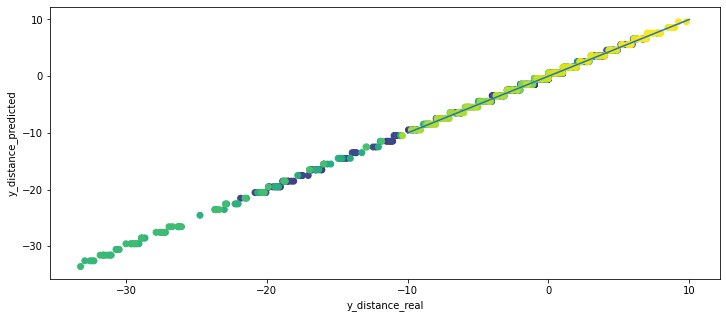

 --- plot predcition --- 
# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
260.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor from left wall =  43
Sensor from right wall =  59
most távolsagra van a felső faltól =  42.211689080088604
most távolsagra van az alsó faltól =  57.788310919911424
ccccccccccccccccccccccc

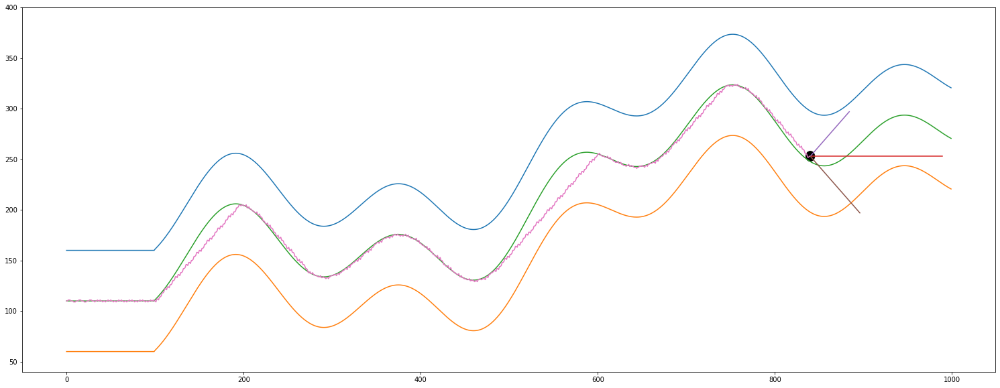

 --- plot --- 
------------------------------ IF i % 3 == 0 ------------------------------
# i =  840
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (841, 3)
y.shape =  (841, 1)
i       =  840
------------------------------ IF len(self.before) > 9 ------------------------------


# i =  840
  Ha már van elég before after adatunk
# 3. Tanulás itt kerül kiszámításra a lineáris regresszió minden egyes metrikára
# Linear Regression Learning --------------------------------------------------------------------------------------
		 # Linear Regression Training Results -------------------------------------------------------------------------
		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_left.coef_ =  [[ 1. -1.]]
		 regression_left.intercept_ =  [-1.42108547e-14]
		 ------------------------------- valyon mennyire jó ennek a met

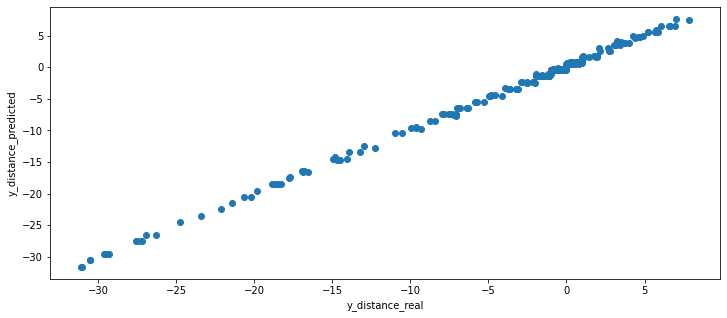

(845, 1)
(845, 1)


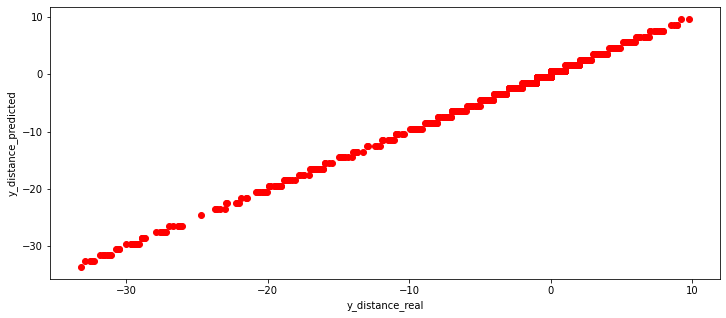

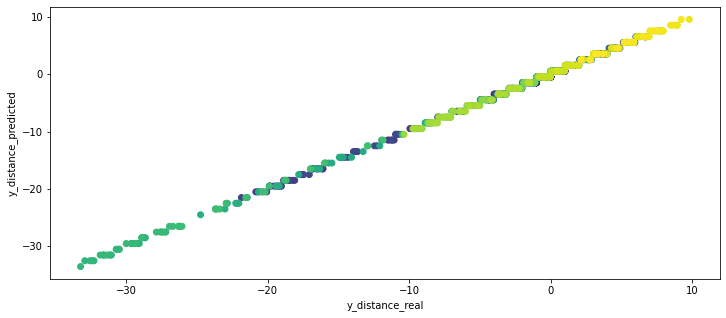

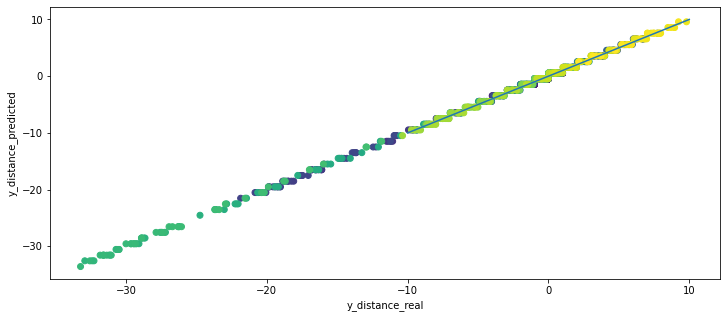

 --- plot predcition --- 
# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
248.0
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor from left wall =  48
Sensor from right wall =  54
most távolsagra van a felső faltól =  47.47261389781022
most távolsagra van az alsó faltól =  52.52738610218975
ccccccccccccccccccccccccc

IndexError: ignored

In [7]:
auto.run()

<a name="irodalom"></a>

# Felhasznált irodalom és internetes cimek

Itt gyűjtöttem össze a menet közben összegyűjt okosságokat

[vissza a tartalomhoz](#tartalom)<br>

Scikit-learn - MLPRegressor API
<br>
https://scikit-learn.org/stable/modules/generated/sklearn.neural_network.MLPRegressor.html


Fogalmak és probléma meghatározás
<br>
https://www.rubrik.com/blog/architecture/20/12/customized-autoscaling--minimize-your-cloud-cost


https://github.com/kubernetes/autoscaler/blob/master/cluster-autoscaler/FAQ.md#what-are-the-parameters-to-ca

https://arxiv.org/pdf/1608.04030.pdf

Metrikák amivel a szollgáltatás minőségét mérik különböző esetekben
<br>
https://blog.avinetworks.com/autoscaling-metrics

------------

NumPy API Reference Guide
<br>
https://numpy.org/doc/stable/reference/random/generated/numpy.random.normal.html


Seaborn API Reference Guide
<br>
https://seaborn.pydata.org/examples/pair_grid_with_kde.html

